In [ ]:
! pip install torch torchvision
! pip install matplotlib
! pip install scikit-learn

In [ ]:
# Downloading the dataset
!mkdir training_dataset
!wget http://data.celltrackingchallenge.net/training-datasets/Fluo-N2DH-GOWT1.zip
!unzip Fluo-N2DH-GOWT1.zip -d training_dataset

--2024-01-30 20:19:04--  http://data.celltrackingchallenge.net/training-datasets/Fluo-N2DH-GOWT1.zip
Resolving data.celltrackingchallenge.net (data.celltrackingchallenge.net)... 147.251.52.183
Connecting to data.celltrackingchallenge.net (data.celltrackingchallenge.net)|147.251.52.183|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://data.celltrackingchallenge.net/training-datasets/Fluo-N2DH-GOWT1.zip [following]
--2024-01-30 20:19:05--  https://data.celltrackingchallenge.net/training-datasets/Fluo-N2DH-GOWT1.zip
Connecting to data.celltrackingchallenge.net (data.celltrackingchallenge.net)|147.251.52.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 59331035 (57M) [application/zip]
Saving to: ‘Fluo-N2DH-GOWT1.zip’

Fluo-N2DH-GOWT1.zip 100%[===================>]  56.58M  17.6MB/s    in 4.2s    

2024-01-30 20:19:09 (13.4 MB/s) - ‘Fluo-N2DH-GOWT1.zip’ saved [59331035/59331035]

Archive:  Fluo-N2DH-GOWT1.zip
   cr

In [ ]:
# Removing the zip file after the unzip
!rm Fluo-N2DH-GOWT1.zip

In [ ]:
import torch
import torch.nn as nn
from torchvision.transforms.functional import center_crop


# performs a convolution the applies batch normalization and RELU
class CNNBlock(nn.Module):
    def __init__(self,
                 in_channels,
                 out_channels,
                 kernel_size=3,
                 stride=1,
                 padding=0):
        super(CNNBlock, self).__init__()

        self.seq_block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.seq_block(x)
        return x


# creates and performs a block of convolution
class CNNBlocks(nn.Module):
    """
    Parameters:
    n_conv (int): creates a block of n_conv convolutions
    in_channels (int): number of in_channels of the first block's convolution
    out_channels (int): number of out_channels of the first block's convolution
    expand (bool) : if True after the first convolution of a blocl the number of channels doubles
    """
    def __init__(self,
                 n_conv,
                 in_channels,
                 out_channels,
                 padding):
        super(CNNBlocks, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(n_conv):

            self.layers.append(CNNBlock(in_channels, out_channels, padding=padding))
            # after each convolution we set (next) in_channel to (previous) out_channels
            in_channels = out_channels

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x


class Encoder(nn.Module):
    """
    Parameters:
    in_channels (int): number of in_channels of the first CNNBlocks
    out_channels (int): number of out_channels of the first CNNBlocks
    padding (int): padding applied in each convolution
    downhill (int): number times a CNNBlocks + MaxPool2D it's applied.
    """
    def __init__(self,
                 in_channels,
                 out_channels,
                 padding,
                 downhill=4):
        super(Encoder, self).__init__()
        self.enc_layers = nn.ModuleList()

        for _ in range(downhill):
            self.enc_layers += [
                    CNNBlocks(n_conv=2, in_channels=in_channels, out_channels=out_channels, padding=padding),
                    nn.MaxPool2d(2, 2)
                ]

            in_channels = out_channels
            out_channels *= 2
        # doubling the dept of the last CNN block
        self.enc_layers.append(CNNBlocks(n_conv=2, in_channels=in_channels,
                                         out_channels=out_channels, padding=padding))

    def forward(self, x):
        route_connection = []
        for layer in self.enc_layers:
            if isinstance(layer, CNNBlocks):
                x = layer(x)
                route_connection.append(x)
            else:
                x = layer(x)
        return x, route_connection


class Decoder(nn.Module):
    """
    Parameters:
    in_channels (int): number of in_channels of the first ConvTranspose2d
    out_channels (int): number of out_channels of the first ConvTranspose2d
    padding (int): padding applied in each convolution
    uphill (int): number times a ConvTranspose2d + CNNBlocks it's applied.
    """
    def __init__(self,
                 in_channels,
                 out_channels,
                 exit_channels,
                 padding,
                 uphill=4):
        super(Decoder, self).__init__()
        self.exit_channels = exit_channels
        self.layers = nn.ModuleList()

        for i in range(uphill):

            self.layers += [
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
                CNNBlocks(n_conv=2, in_channels=in_channels,
                          out_channels=out_channels, padding=padding),
            ]
            in_channels //= 2
            out_channels //= 2

        # cannot be a CNNBlock because it has ReLU incorpored
        # cannot append nn.Sigmoid here because you should be later using
        # BCELoss () which will trigger the amp error "are unsafe to autocast".
        self.layers.append(
            nn.Conv2d(in_channels, exit_channels, kernel_size=1, padding=padding),
        )


    def forward(self, x, routes_connection):
        # pop the last element of the list since
        # it's not used for concatenation
        routes_connection.pop(-1)
        for layer in self.layers:
            if isinstance(layer, CNNBlocks):
                # center_cropping the route tensor to make width and height match
                routes_connection[-1] = center_crop(routes_connection[-1], x.shape[2])
                # concatenating tensors channel-wise
                x = torch.cat([x, routes_connection.pop(-1)], dim=1)
                x = layer(x)
            else:
                x = layer(x)
        return x


class UNET(nn.Module):
    def __init__(self,
                 in_channels,
                 first_out_channels,
                 exit_channels,
                 downhill,
                 padding=0
                 ):
        super(UNET, self).__init__()
        self.encoder = Encoder(in_channels, first_out_channels, padding=padding, downhill=downhill)
        self.decoder = Decoder(first_out_channels*(2**downhill), first_out_channels*(2**(downhill-1)),
                               exit_channels, padding=padding, uphill=downhill)

    def forward(self, x):
        enc_out, routes = self.encoder(x)
        out = self.decoder(enc_out, routes)
        return out



In [ ]:
import os

path_to_dataset = '/content/training_dataset/Fluo-N2DH-GOWT1'
path_to_segmantation_masks = os.path.join(path_to_dataset, '01_ST/SEG')
path_to_images = os.path.join(path_to_dataset, '01')

path_images_test = os.path.join(path_to_dataset, '02')
path_segmentation_masks_test = os.path.join(path_to_dataset, '02_ST/SEG')

masks_files = [os.path.join(path_to_segmantation_masks, mask) for mask in os.listdir(path_to_segmantation_masks)]
image_files = [os.path.join(path_to_images, image) for image in os.listdir(path_to_images)]

masks_files_test = [os.path.join(path_segmentation_masks_test, mask) for mask in os.listdir(path_segmentation_masks_test)]
image_files_test = [os.path.join(path_images_test, image) for image in os.listdir(path_images_test)]

print('len training masks', len(masks_files))
print('len training data', len(image_files))
print('sample data', image_files)
print('sample data', masks_files)


print('len training masks', len(masks_files_test))
print('len training data', len(image_files_test))
print('man_seg'+''.join(filter(lambda char: char.isdigit(), os.path.basename(image_files[0])))+'.tif')

len training masks 92
len training data 92
sample data ['/content/training_dataset/Fluo-N2DH-GOWT1/01/t066.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t068.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t029.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t076.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t019.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t058.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t088.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t078.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t002.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t090.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t016.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t059.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t034.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t037.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t052.tif', '/content/training_dataset/Fluo-N2DH-GOWT1/01/t044.tif', '/content/training_dataset/Fluo-

sample image name :  /content/training_dataset/Fluo-N2DH-GOWT1/01/t064.tif
064
/content/training_dataset/Fluo-N2DH-GOWT1/01_ST/SEG/man_seg064.tif


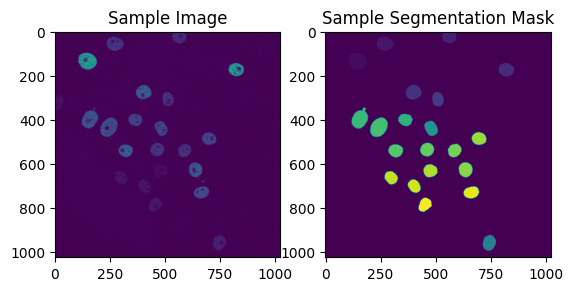

22


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Choose a sample image and corresponding mask
#print()
sample_image = image_files[20]
print('sample image name : ', sample_image)

base_number = sample_image.split('/')[-1][1:4]
print(base_number)
sample_mask = os.path.join(path_to_segmantation_masks,
                           'man_seg'+ base_number +'.tif')
print(sample_mask)

# Load and display the sample image and mask
image = Image.open(sample_image)
mask = Image.open(sample_mask)

# Display the images
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Sample Image")

plt.subplot(1, 2, 2)
plt.imshow(mask)
plt.title("Sample Segmentation Mask")

plt.show()

# Convert the mask to a NumPy array
mask_array = np.array(mask)

# Get unique values in the mask
unique_classes = np.unique(mask_array)

# Count the number of unique classes
num_classes = len(unique_classes)
print(num_classes)

sample image name :  /content/training_dataset/Fluo-N2DH-GOWT1/02/t064.tif
064
/content/training_dataset/Fluo-N2DH-GOWT1/02_ST/SEG/man_seg087.tif


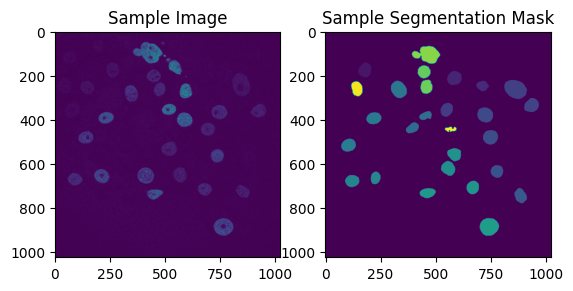

28


In [ ]:
# Choose a sample image and corresponding mask
#print()
sample_image = image_files_test[20]
print('sample image name : ', sample_image)

base_number = sample_image.split('/')[-1][1:4]
print(base_number)
sample_mask = masks_files_test[20]
print(sample_mask)

# Load and display the sample image and mask
image = Image.open(sample_image)
mask = Image.open(sample_mask)

# Display the images
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Sample Image")

plt.subplot(1, 2, 2)
plt.imshow(mask)
plt.title("Sample Segmentation Mask")

plt.show()

# Convert the mask to a NumPy array
mask_array = np.array(mask)

# Get unique values in the mask
unique_classes = np.unique(mask_array)

# Count the number of unique classes
num_classes = len(unique_classes)
print(num_classes)

In [ ]:
from torchvision.transforms import ToTensor
from torch.utils.data import Dataset, random_split
from torchvision import transforms
from torchvision.transforms import v2
from torchvision import tv_tensors
from torchvision.transforms import Pad, Resize

import os
import numpy as np
from PIL import Image
import torch
from torchvision import transforms as tv_transforms
from torchvision.transforms import ToTensor, Pad
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transforms=ToTensor(), pad_mirroring=None):
        """
        Custom dataset class for image segmentation.

        Args:
        - image_paths (list): List of file paths for input images.
        - mask_paths (list): List of file paths for corresponding masks.
        - transforms (torchvision.transforms): Image transformations (default: ToTensor).
        - pad_mirroring (int): Padding value for mirroring (default: None).
        """
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transforms = transforms
        self.pad_mirroring = pad_mirroring

    def __len__(self):
        """
        Returns the total number of samples in the dataset.
        """
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        Retrieves a sample from the dataset.

        Args:
        - idx (int): Index of the sample.

        Returns:
        - img (numpy array): Input image.
        - gt (numpy array): Ground truth mask.
        """
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]
        base_path_image = os.path.split(mask_path)
        name_mask_image = 'man_seg' + ''.join(filter(lambda char: char.isdigit(), os.path.basename(image_path))) + '.tif'
        mask_path = os.path.join(base_path_image[0], name_mask_image)

        img = np.array(Image.open(image_path).convert("RGB"), dtype=np.float32)
        gt = np.array(Image.open(mask_path).convert('L'), dtype=np.float32)
        gt = gt.astype(np.float32) / 255

        if self.transforms is not None:
            augmentations = self.transforms(image=img, mask=gt)
            img = augmentations["image"]
            gt = augmentations["mask"]

        if self.pad_mirroring:
            img = Pad(padding=self.pad_mirroring, padding_mode="reflect")(img)

        return img, gt


In [ ]:
from torch.utils.data import DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

# height and width of images
IMAGE_HEIGHT = 388
IMAGE_WIDTH = 388

# Data augmentations for training and validations
train_transform = A.Compose(
    [
        A.Resize(IMAGE_HEIGHT, IMAGE_WIDTH),
        A.Rotate(limit=45, p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.1),
        A.Normalize(
            mean=(0, 0, 0),
            std=(1, 1, 1),
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ],
)

val_transforms = A.Compose(
    [
        A.Resize(IMAGE_HEIGHT, IMAGE_WIDTH),
        A.Normalize(
            mean=(0, 0, 0),
            std=(1, 1, 1),
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ],
)

PAD_MIRRORING = 92
training_dataset = CustomDataset(image_files, masks_files, transforms=train_transform, pad_mirroring=PAD_MIRRORING)
test_dataset = CustomDataset(image_files_test, masks_files_test, transforms=val_transforms, pad_mirroring=PAD_MIRRORING)


val_ratio = 0.2

# Calculate split sizes
num_samples = len(test_dataset)
val_size = int(val_ratio * num_samples)
test_size = num_samples -  val_size

# Use random_split to split the dataset
val_dataset, test_dataset = random_split(test_dataset, [val_size, test_size])
print('validation dataset', len(val_dataset))
print('test_dataset', len(test_dataset))

# Creation of dataloaders
batch_size = 4
train_dataloader = DataLoader(training_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)



validation dataset 18
test_dataset 74


In [ ]:
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np

# define train_loop with early stopping and visualization
def train_loop(model, train_loader, val_loader, optim, loss_fn, scaler, num_epochs, patience, pos_weight=False):
    """
    Train the given model using the provided training and validation data loaders.

    Args:
        model (torch.nn.Module): The neural network model to be trained.
        train_loader (torch.utils.data.DataLoader): DataLoader for training data.
        val_loader (torch.utils.data.DataLoader): DataLoader for validation data.
        optim (torch.optim.Optimizer): The optimizer for updating model parameters.
        loss_fn (torch.nn.Module): The loss function used for training.
        scaler (torch.cuda.amp.GradScaler): Gradient scaler for mixed-precision training.
        num_epochs (int): Number of epochs for training.
        patience (int): Number of epochs to wait for improvement during early stopping.
        pos_weight (bool): Whether to use positive class weights in the loss function.

    Returns:
        tuple: Lists of training and validation losses throughout the training process.
    """

    train_losses = []
    val_losses = []
    best_val_loss = float('inf')
    epochs_without_improvement = 0

    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")

        # Training
        model.train()
        train_loss = 0
        for idx, (image, mask) in enumerate(tqdm(train_loader)):
            image = image.to(DEVICE)
            mask = mask.float().unsqueeze(dim=1).to(DEVICE)
            #print('mask', mask)
            with torch.cuda.amp.autocast():
                out = model(image)
                #print(out)
                #print('out shape : ', out.shape)
                #print('mask shape : ', mask.shape)
                if pos_weight:
                    loss_fn = torch.nn.BCEWithLogitsLoss(pos_weight=(mask == 0.).sum() / mask.sum())
                loss = loss_fn(out, mask)

            optim.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optim)
            scaler.update()

            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        # Validation
        val_loss = evaluate(model, val_loader, loss_fn, scaler, pos_weight)
        val_losses.append(val_loss)

        print(f"==> Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

        # Visualization
        plot_progress(train_losses, val_losses)

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1
            if epochs_without_improvement >= patience:
                print(f"Early stopping at epoch {epoch + 1} as there is no improvement.")
                break

    return train_losses, val_losses


def evaluate(model, loader, loss_fn, scaler, pos_weight=False):
    """
    Evaluate the given model on the provided data loader.

    Args:
        model (torch.nn.Module): The neural network model to be evaluated.
        loader (torch.utils.data.DataLoader): DataLoader for evaluation data.
        loss_fn (torch.nn.Module): The loss function used for evaluation.
        scaler (torch.cuda.amp.GradScaler): Gradient scaler for mixed-precision training.
        pos_weight (bool): Whether to use positive class weights in the loss function.

    Returns:
        float: The average loss over the evaluation dataset.
    """
    model.eval()
    val_loss = 0

    with torch.no_grad():
        for idx, (image, mask) in enumerate(loader):
            image = image.to(DEVICE)
            mask = mask.float().unsqueeze(dim=1).to(DEVICE)

            with torch.cuda.amp.autocast():
                out = model(image)
                if pos_weight:
                    loss_fn = torch.nn.BCEWithLogitsLoss(pos_weight=(mask == 0.).sum() / mask.sum())
                loss = loss_fn(out, mask)

                val_loss += loss.item()

    val_loss /= len(loader)
    return val_loss

def plot_progress(train_losses, val_losses):
    """
    Plot the training and validation loss progress over epochs.

    Args:
        train_losses (list): List of training losses for each epoch.
        val_losses (list): List of validation losses for each epoch.

    Returns:
        None
    """
    plt.figure(figsize=(10, 5))
    epochs = np.arange(1, len(train_losses) + 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.plot(epochs, val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Progress')
    plt.legend()
    plt.show()


In [ ]:
DEVICE = "cuda"
# loading of the Unet model
model = UNET(3, 64, 1, padding=0, downhill=4).to(DEVICE)

Epoch 1/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.5255, Validation Loss: 0.5769


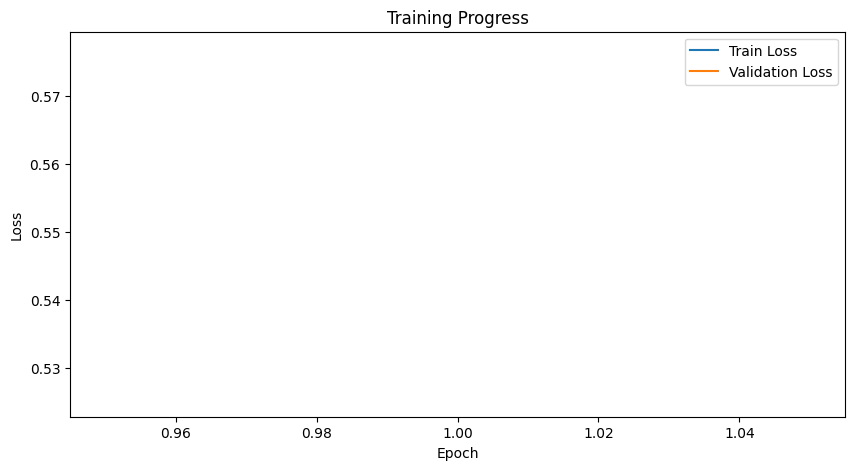

Epoch 2/200


100%|██████████| 23/23 [00:10<00:00,  2.30it/s]


==> Training Loss: 0.3965, Validation Loss: 0.3475


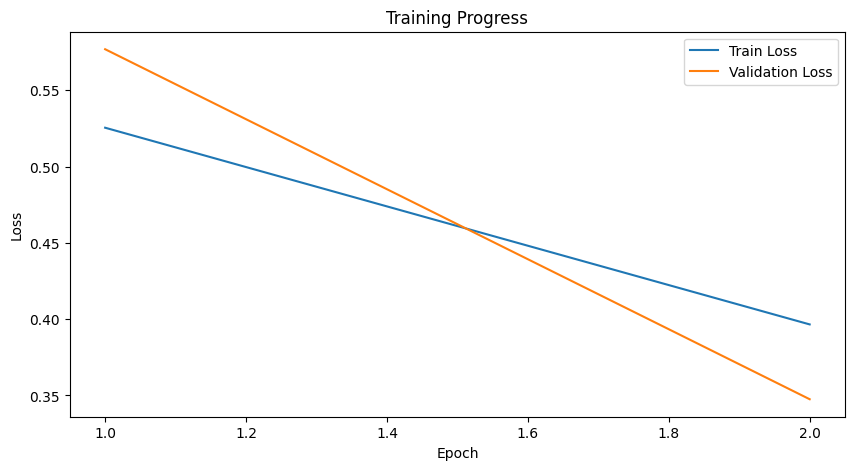

Epoch 3/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.3447, Validation Loss: 0.3127


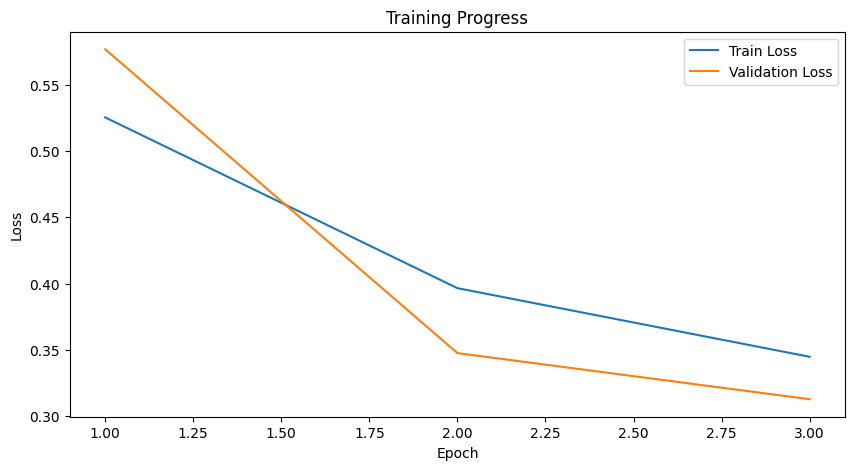

Epoch 4/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.3120, Validation Loss: 0.2983


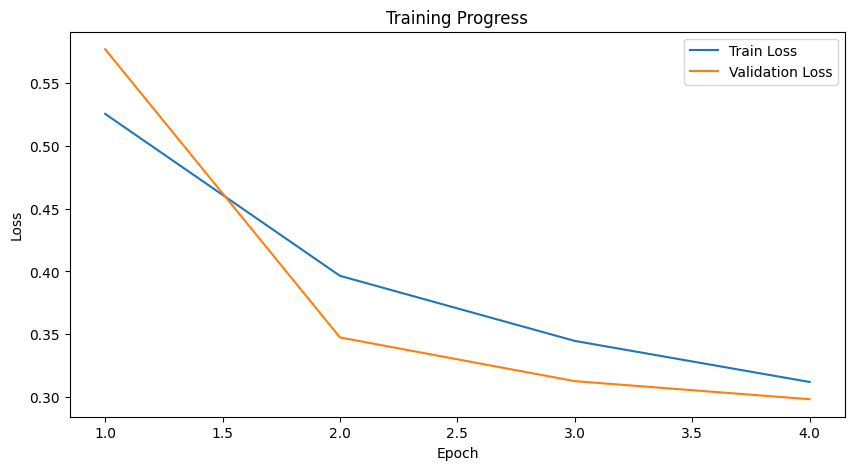

Epoch 5/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.2947, Validation Loss: 0.2886


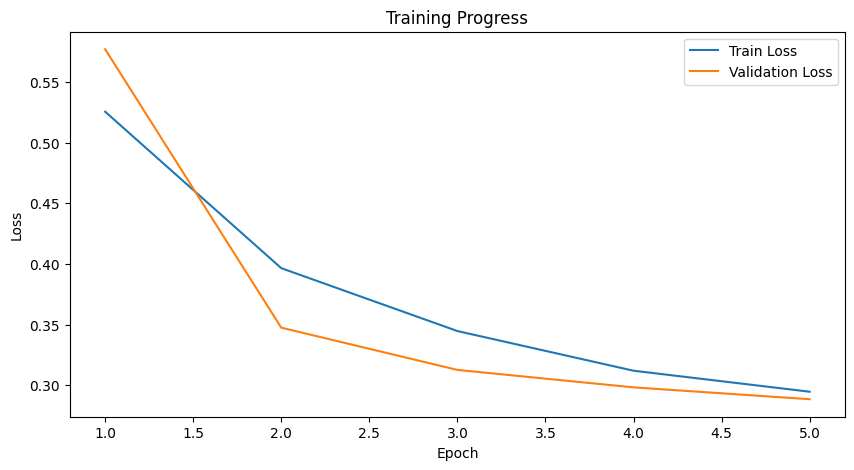

Epoch 6/200


100%|██████████| 23/23 [00:09<00:00,  2.33it/s]


==> Training Loss: 0.2795, Validation Loss: 0.2741


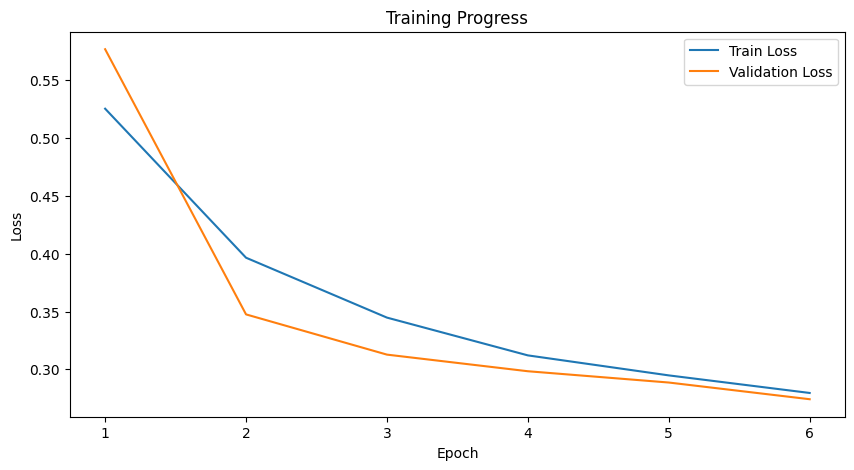

Epoch 7/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.2631, Validation Loss: 0.2582


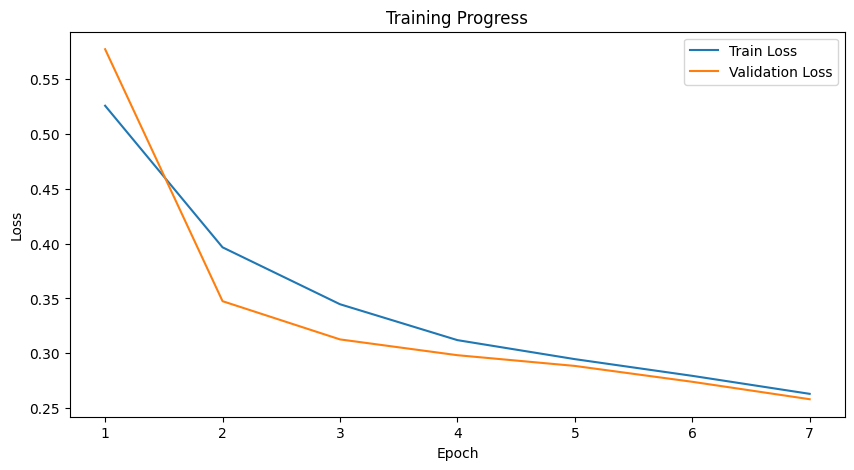

Epoch 8/200


100%|██████████| 23/23 [00:10<00:00,  2.24it/s]


==> Training Loss: 0.2488, Validation Loss: 0.2496


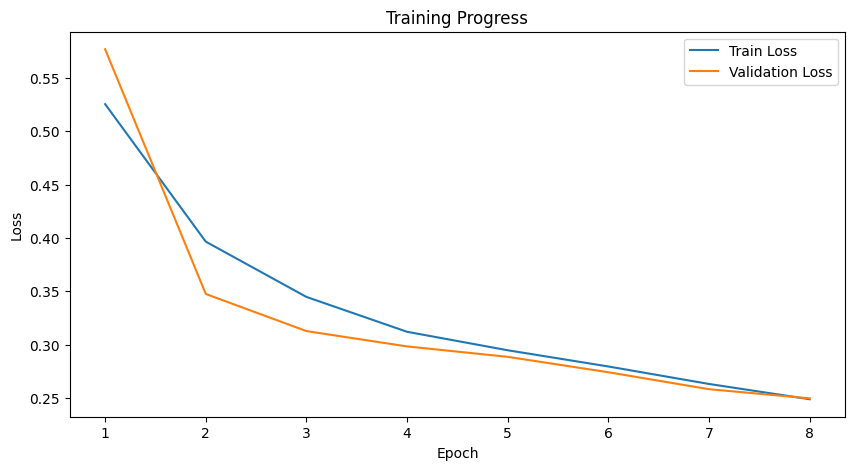

Epoch 9/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.2376, Validation Loss: 0.2393


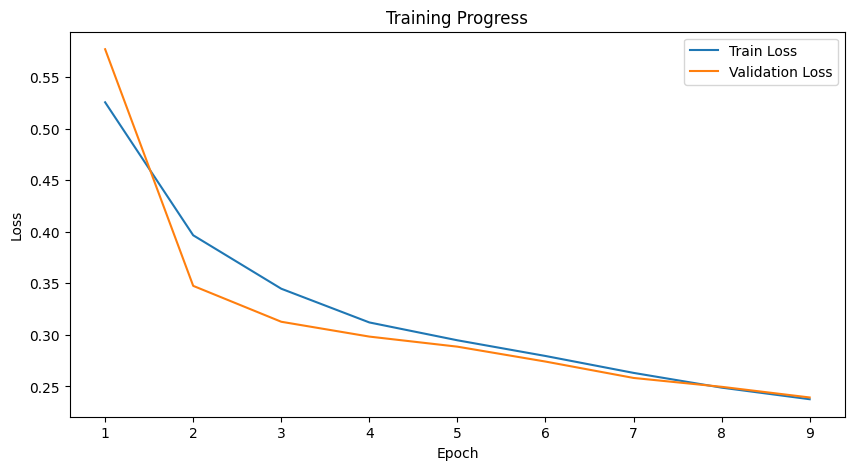

Epoch 10/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.2256, Validation Loss: 0.2239


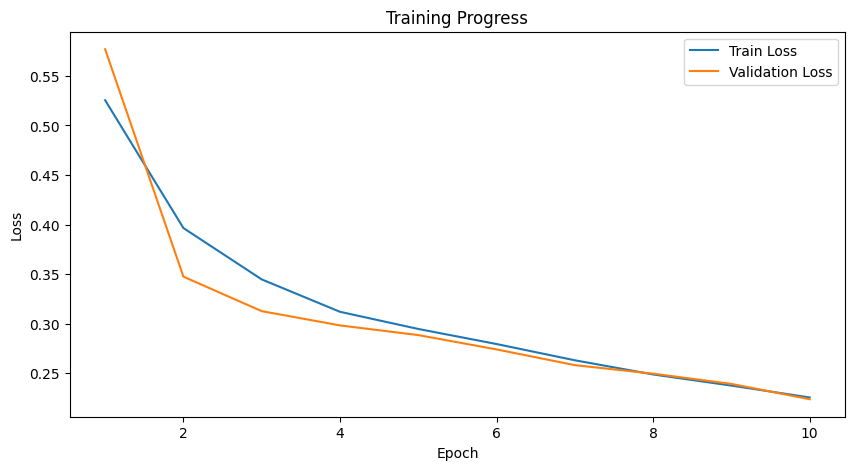

Epoch 11/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.2151, Validation Loss: 0.2176


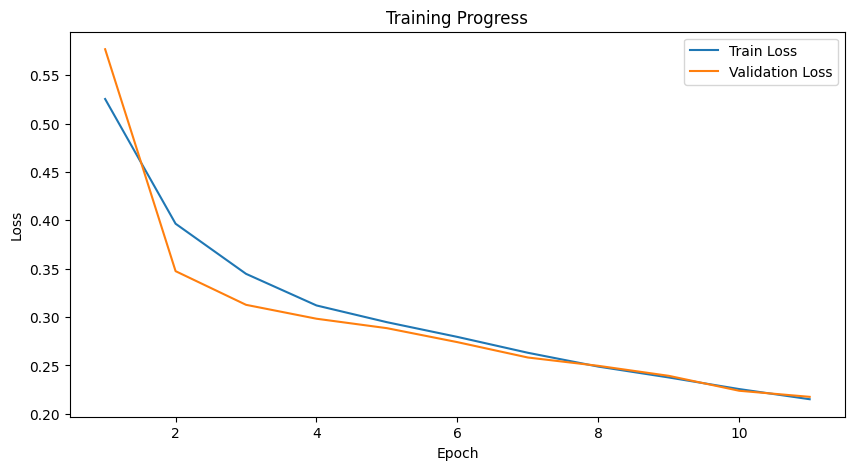

Epoch 12/200


100%|██████████| 23/23 [00:09<00:00,  2.32it/s]


==> Training Loss: 0.2063, Validation Loss: 0.2104


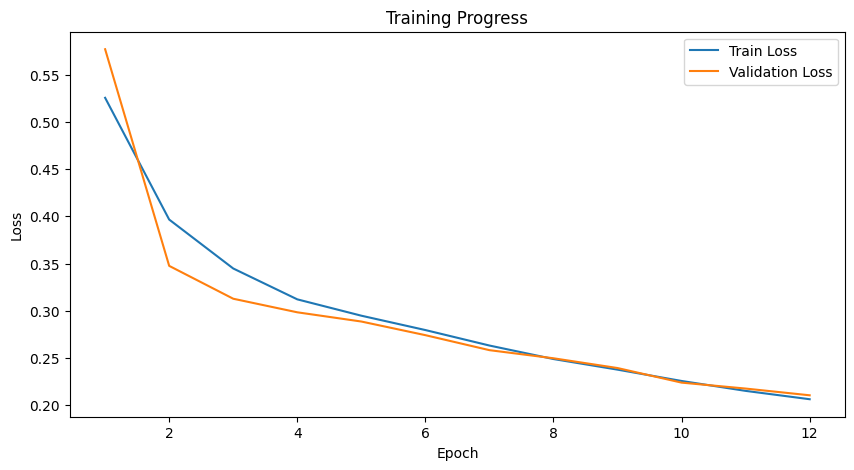

Epoch 13/200


100%|██████████| 23/23 [00:09<00:00,  2.36it/s]


==> Training Loss: 0.1974, Validation Loss: 0.1983


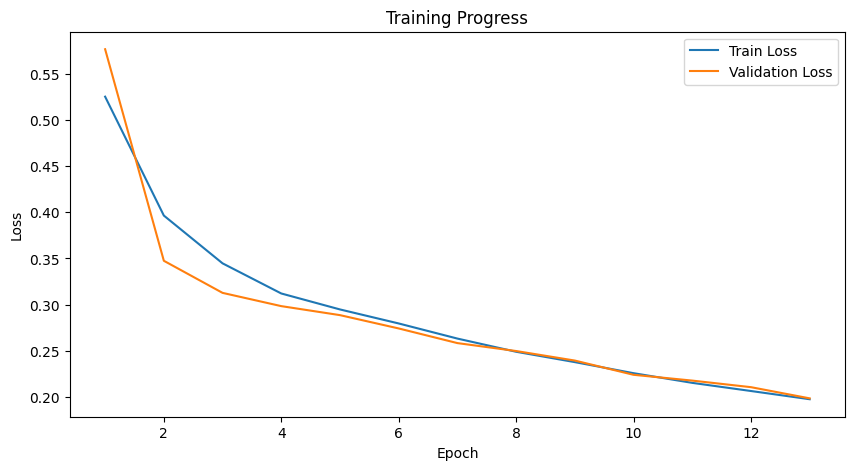

Epoch 14/200


100%|██████████| 23/23 [00:09<00:00,  2.33it/s]


==> Training Loss: 0.1896, Validation Loss: 0.1940


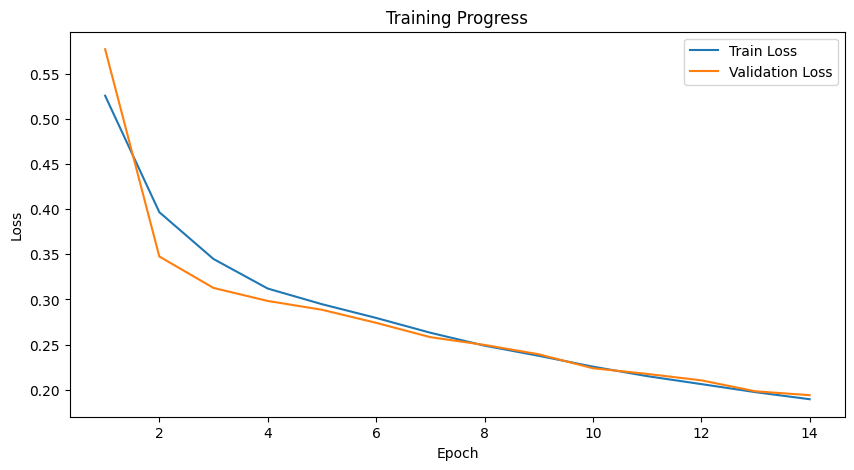

Epoch 15/200


100%|██████████| 23/23 [00:09<00:00,  2.33it/s]


==> Training Loss: 0.1813, Validation Loss: 0.1813


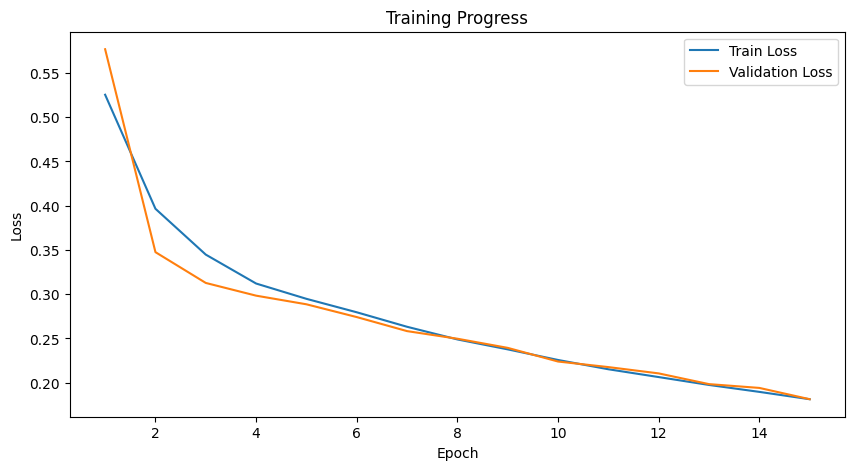

Epoch 16/200


100%|██████████| 23/23 [00:10<00:00,  2.30it/s]


==> Training Loss: 0.1739, Validation Loss: 0.1789


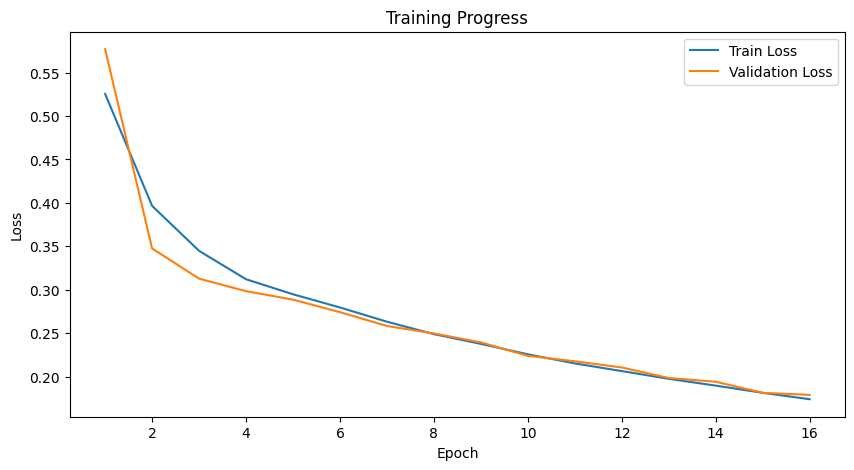

Epoch 17/200


100%|██████████| 23/23 [00:09<00:00,  2.30it/s]


==> Training Loss: 0.1668, Validation Loss: 0.1742


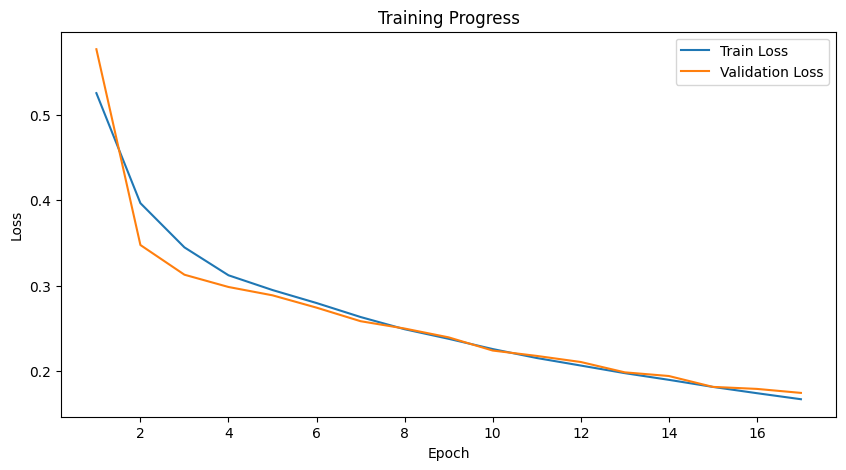

Epoch 18/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.1599, Validation Loss: 0.1650


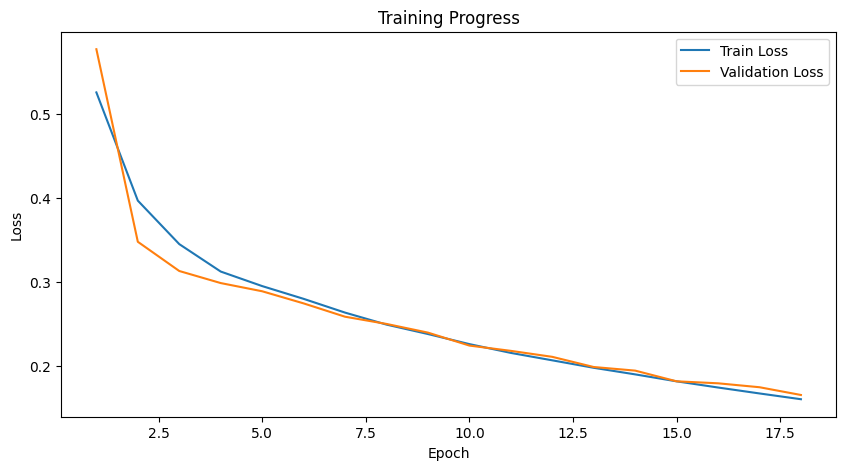

Epoch 19/200


100%|██████████| 23/23 [00:09<00:00,  2.30it/s]


==> Training Loss: 0.1540, Validation Loss: 0.1593


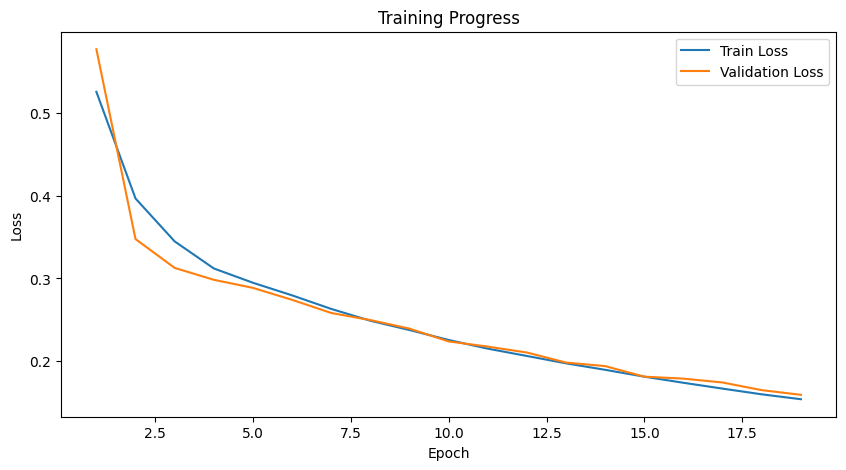

Epoch 20/200


100%|██████████| 23/23 [00:10<00:00,  2.30it/s]


==> Training Loss: 0.1482, Validation Loss: 0.1526


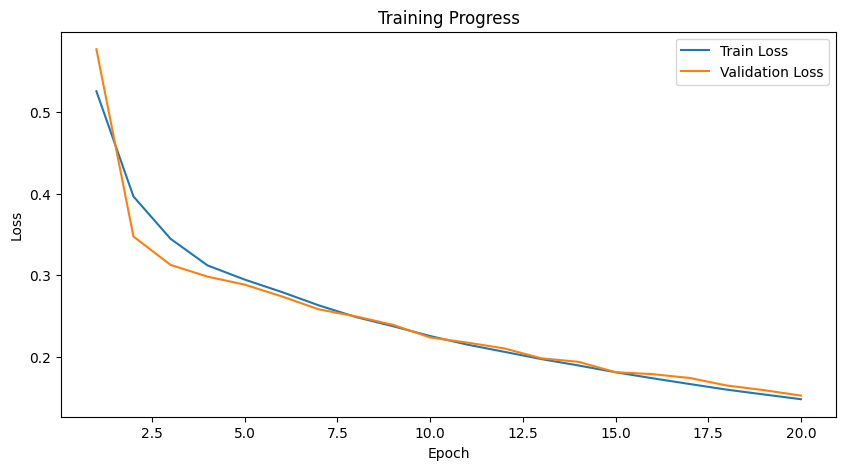

Epoch 21/200


100%|██████████| 23/23 [00:10<00:00,  2.30it/s]


==> Training Loss: 0.1424, Validation Loss: 0.1448


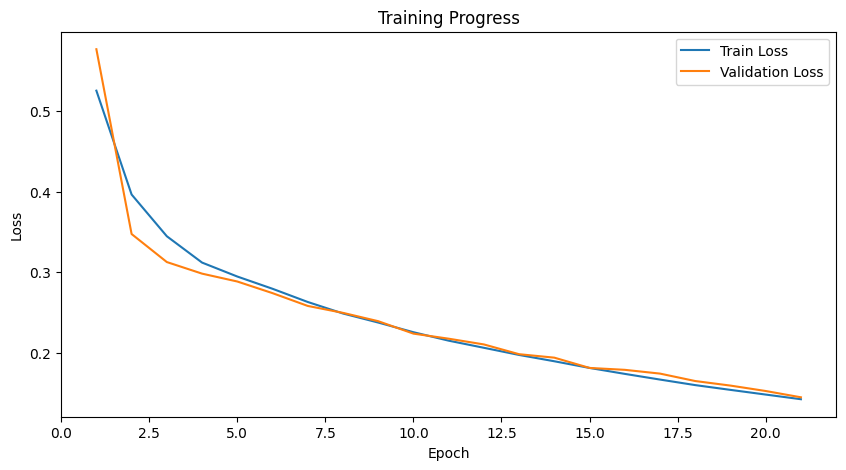

Epoch 22/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.1374, Validation Loss: 0.1429


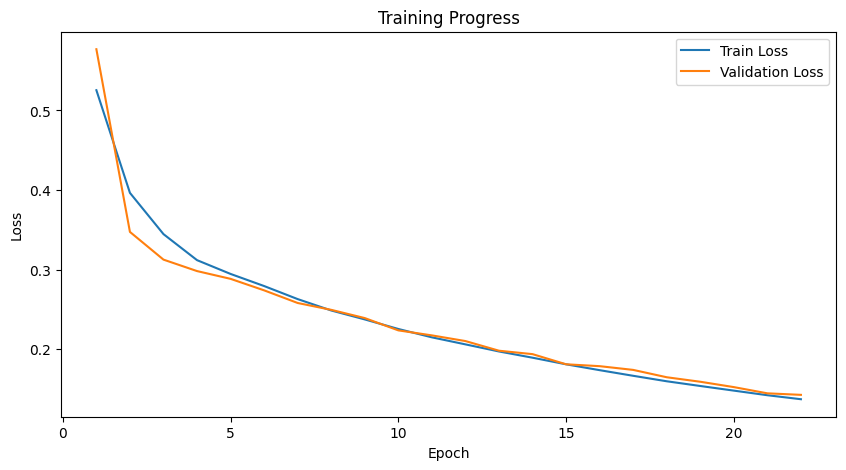

Epoch 23/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.1321, Validation Loss: 0.1382


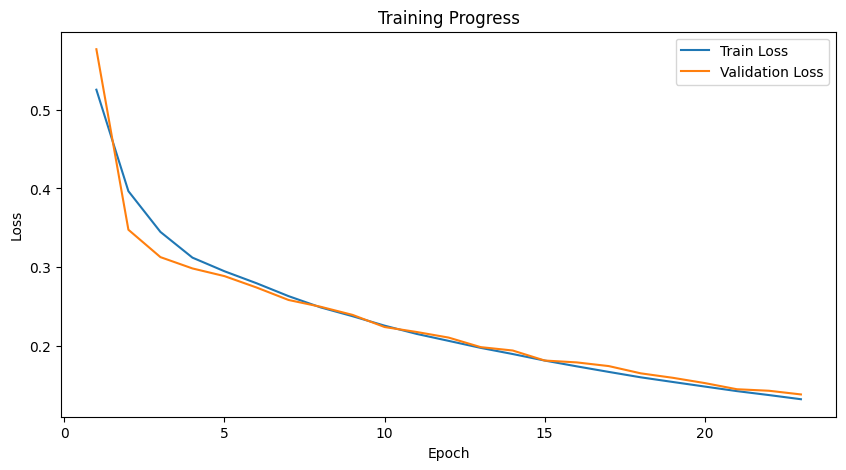

Epoch 24/200


100%|██████████| 23/23 [00:10<00:00,  2.30it/s]


==> Training Loss: 0.1273, Validation Loss: 0.1347


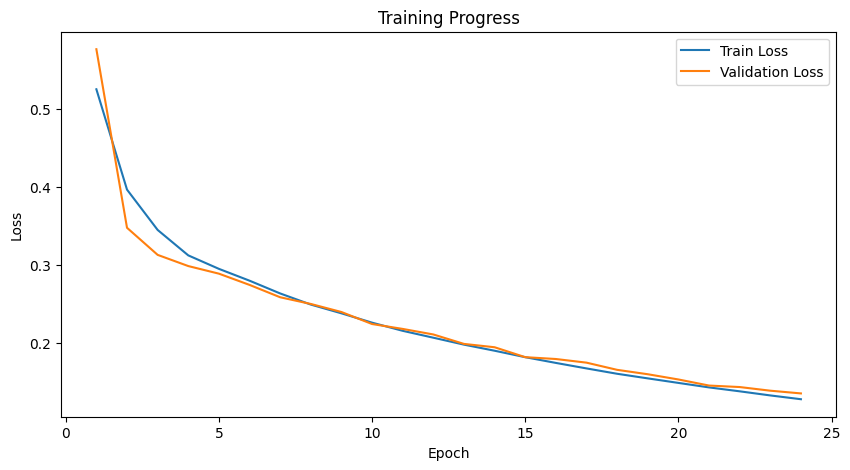

Epoch 25/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.1228, Validation Loss: 0.1294


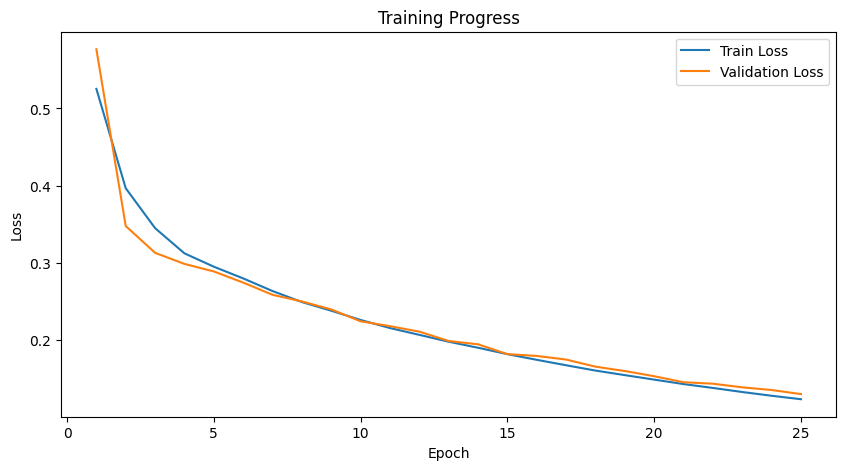

Epoch 26/200


100%|██████████| 23/23 [00:09<00:00,  2.32it/s]


==> Training Loss: 0.1184, Validation Loss: 0.1245


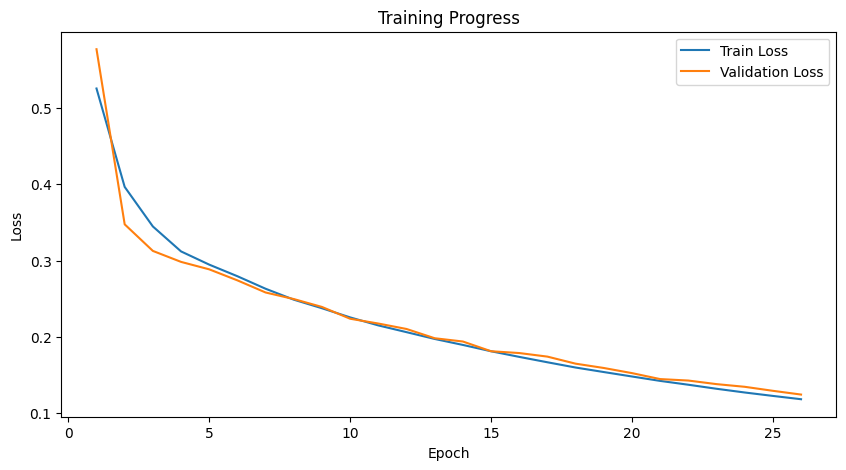

Epoch 27/200


100%|██████████| 23/23 [00:09<00:00,  2.34it/s]


==> Training Loss: 0.1143, Validation Loss: 0.1230


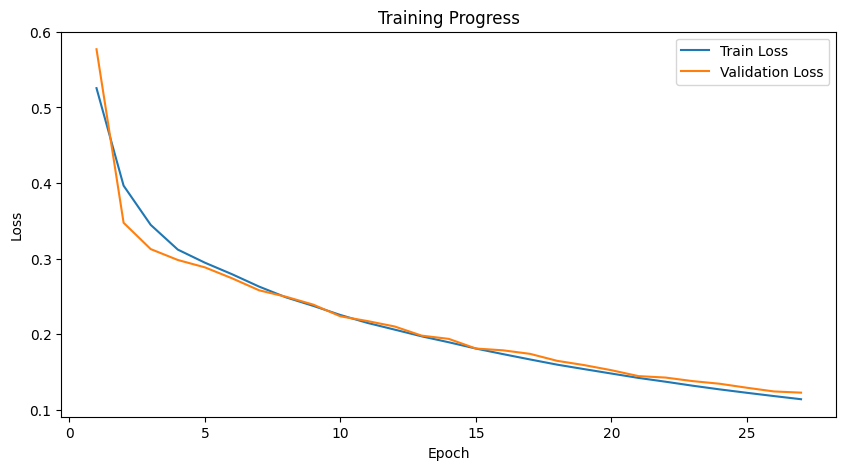

Epoch 28/200


100%|██████████| 23/23 [00:09<00:00,  2.32it/s]


==> Training Loss: 0.1105, Validation Loss: 0.1191


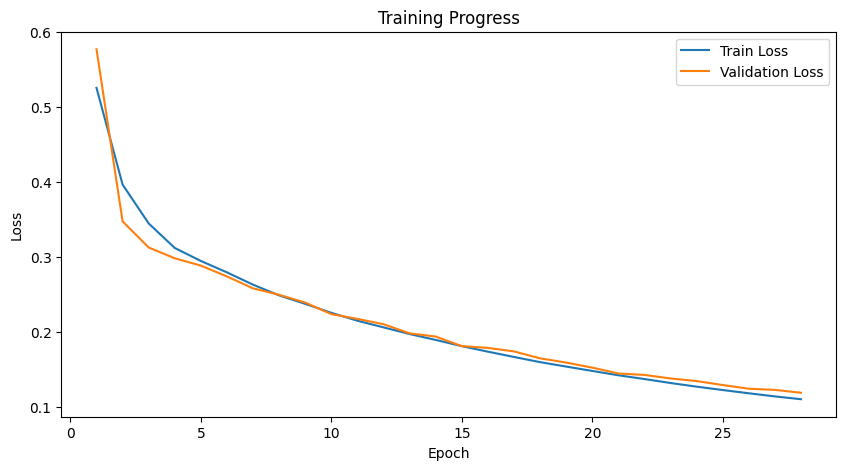

Epoch 29/200


100%|██████████| 23/23 [00:09<00:00,  2.30it/s]


==> Training Loss: 0.1068, Validation Loss: 0.1155


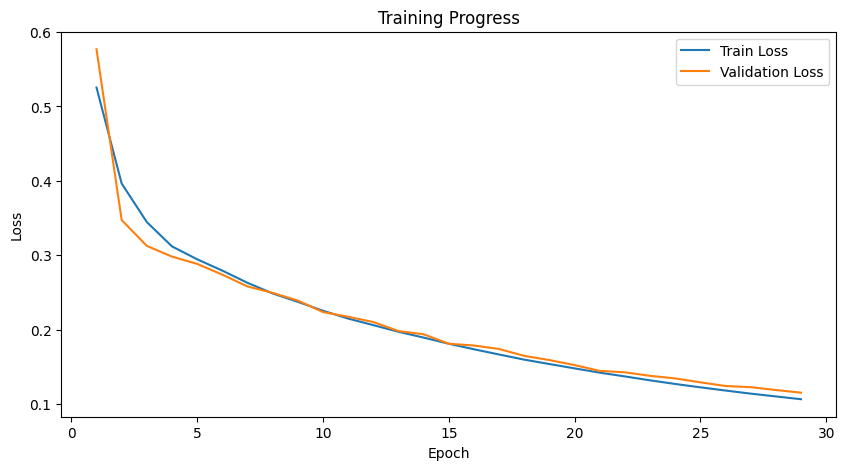

Epoch 30/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.1033, Validation Loss: 0.1129


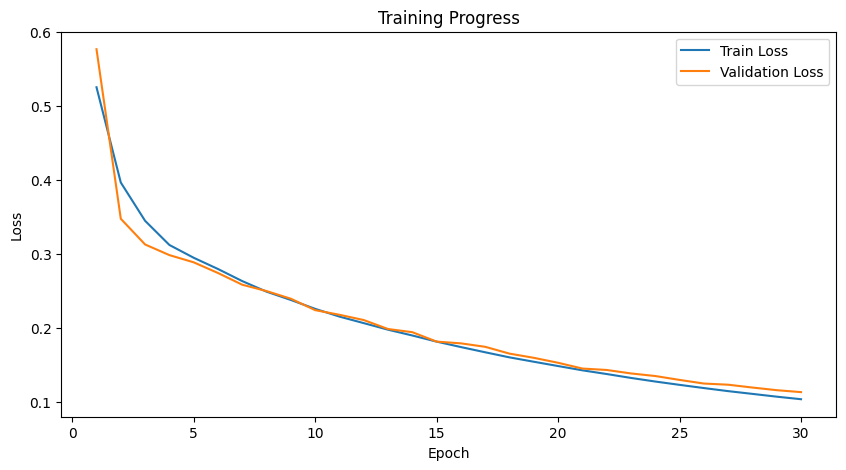

Epoch 31/200


100%|██████████| 23/23 [00:09<00:00,  2.30it/s]


==> Training Loss: 0.1000, Validation Loss: 0.1081


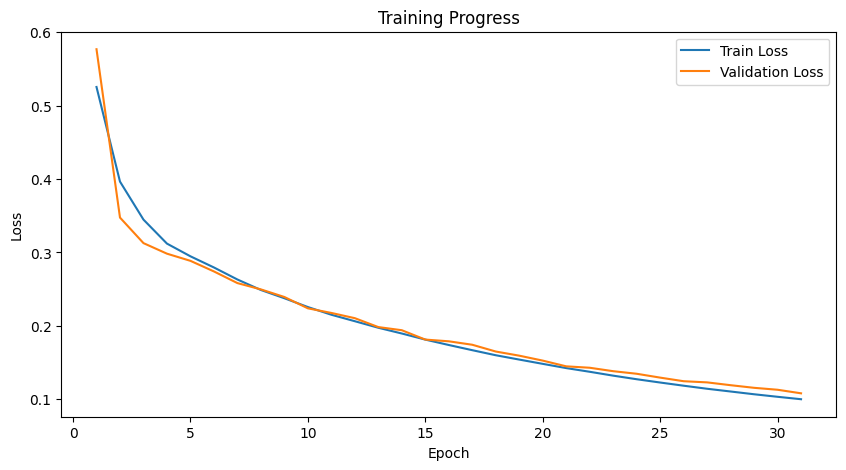

Epoch 32/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0968, Validation Loss: 0.1069


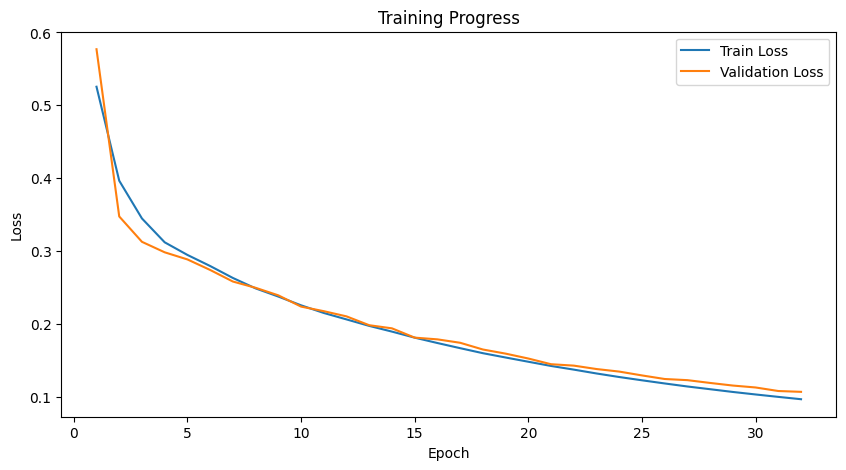

Epoch 33/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0938, Validation Loss: 0.1024


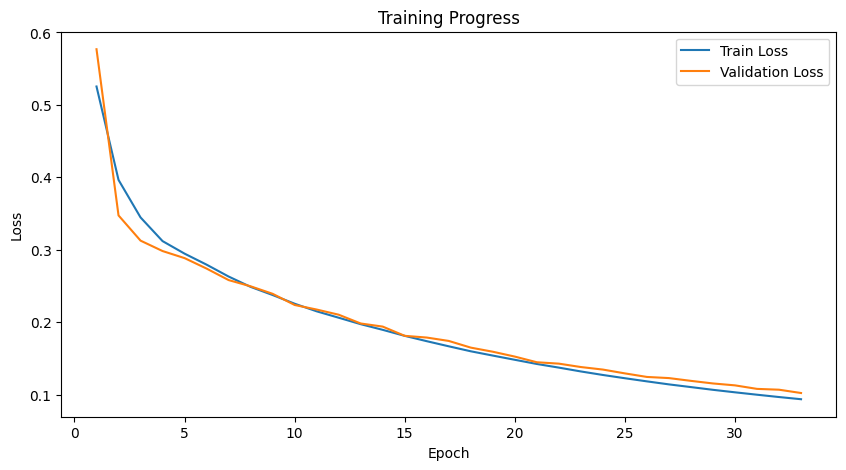

Epoch 34/200


100%|██████████| 23/23 [00:10<00:00,  2.30it/s]


==> Training Loss: 0.0906, Validation Loss: 0.1000


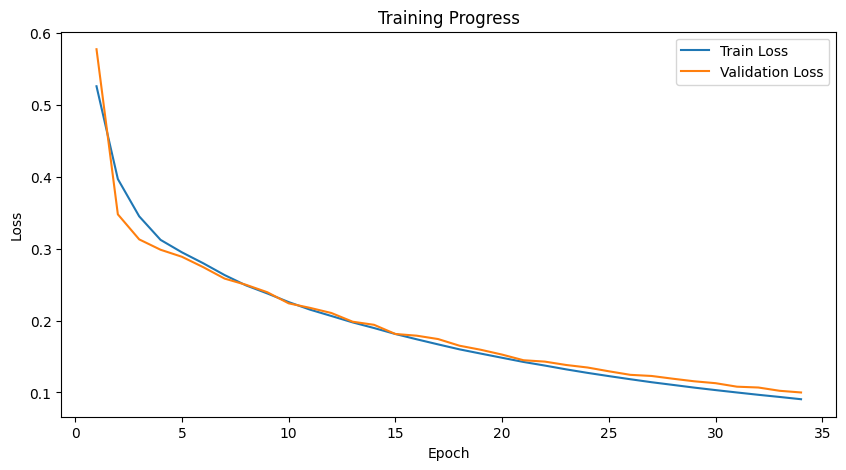

Epoch 35/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0878, Validation Loss: 0.0966


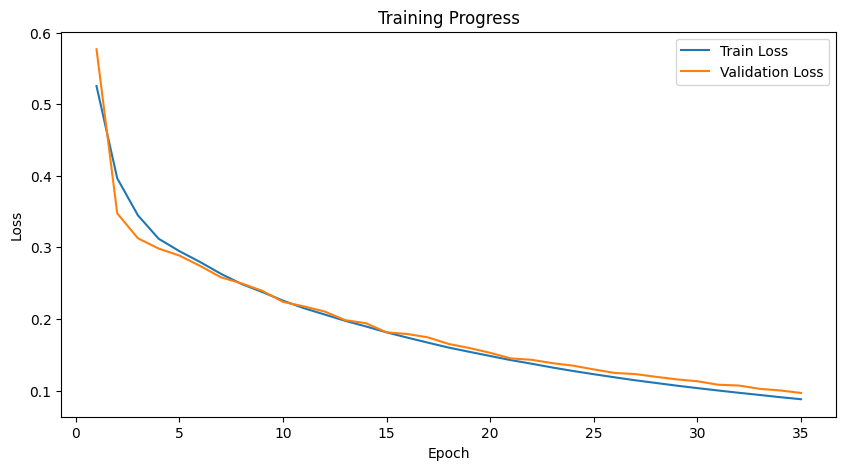

Epoch 36/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0852, Validation Loss: 0.0957


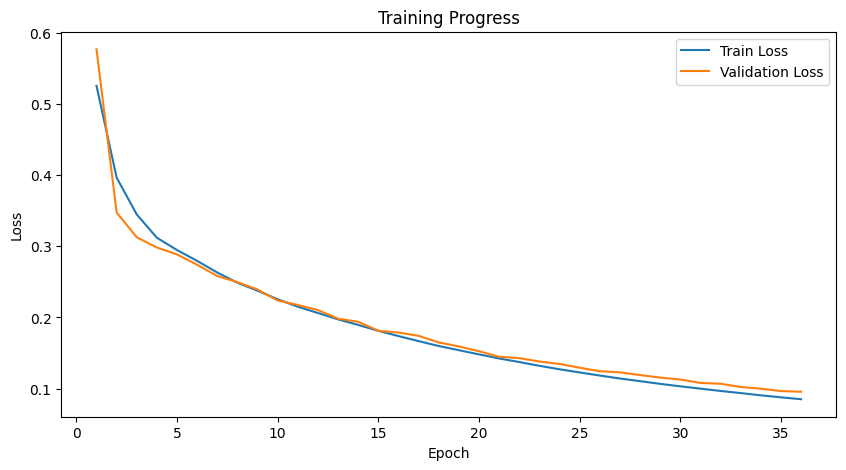

Epoch 37/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0826, Validation Loss: 0.0916


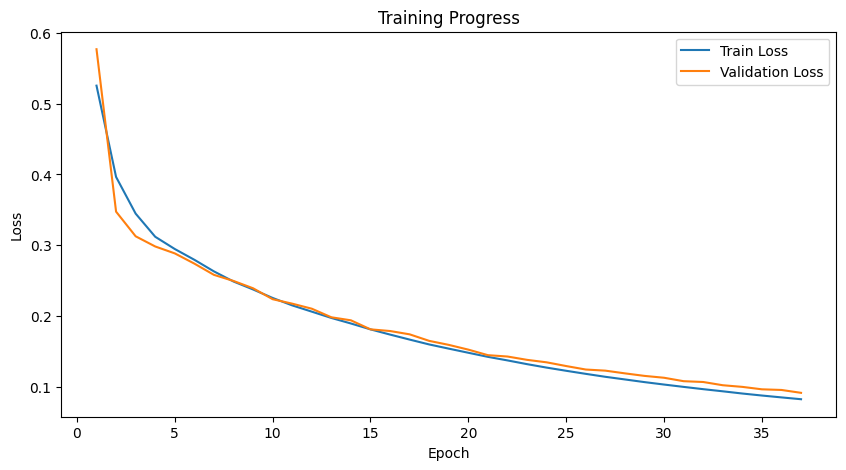

Epoch 38/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0802, Validation Loss: 0.0910


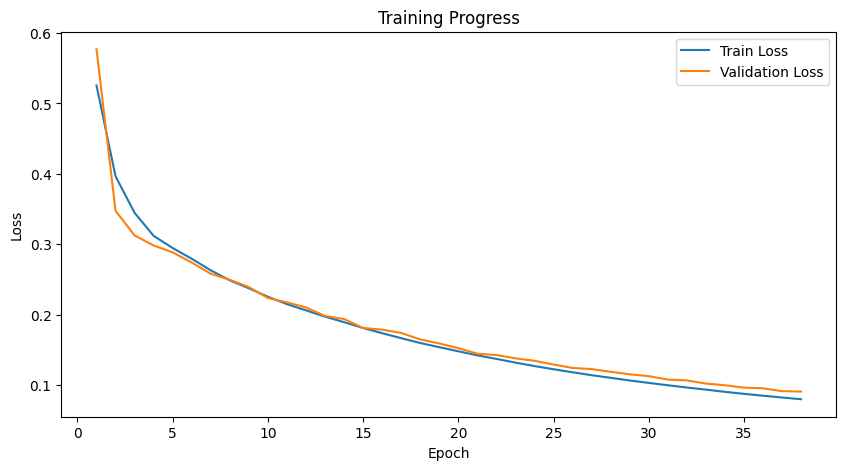

Epoch 39/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.0778, Validation Loss: 0.0876


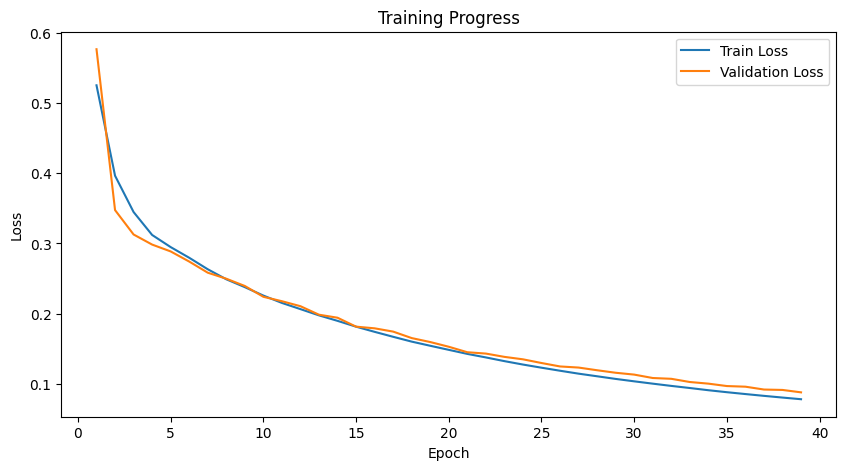

Epoch 40/200


100%|██████████| 23/23 [00:09<00:00,  2.34it/s]


==> Training Loss: 0.0756, Validation Loss: 0.0855


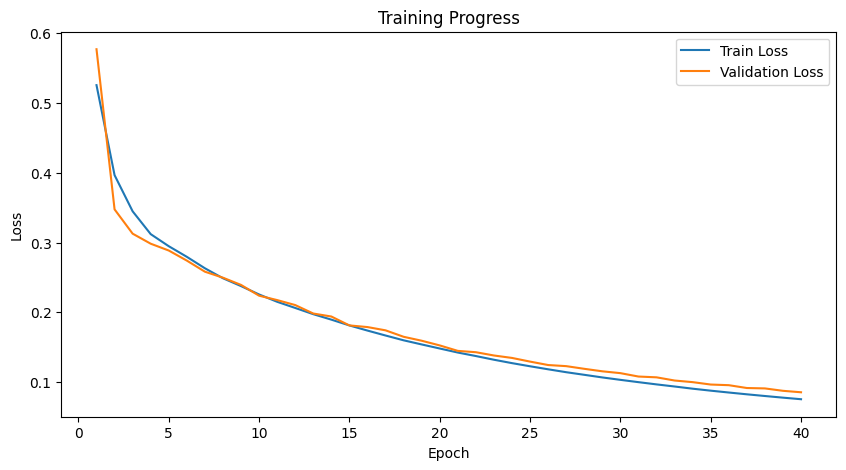

Epoch 41/200


100%|██████████| 23/23 [00:09<00:00,  2.32it/s]


==> Training Loss: 0.0735, Validation Loss: 0.0837


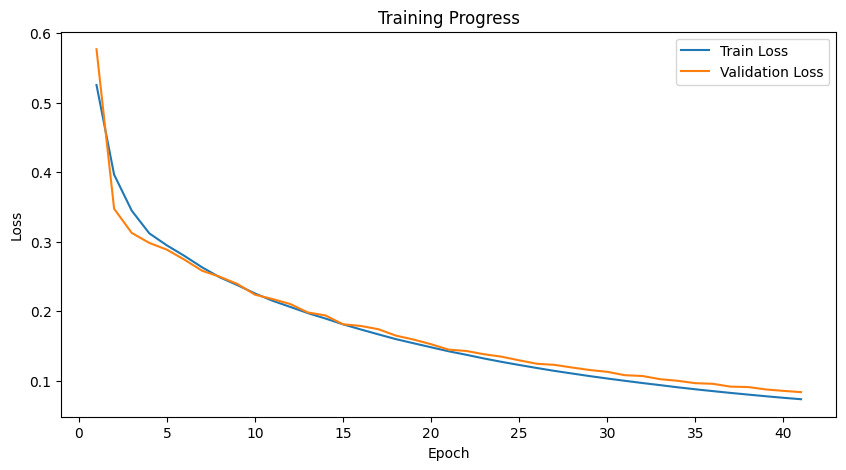

Epoch 42/200


100%|██████████| 23/23 [00:09<00:00,  2.31it/s]


==> Training Loss: 0.0714, Validation Loss: 0.0826


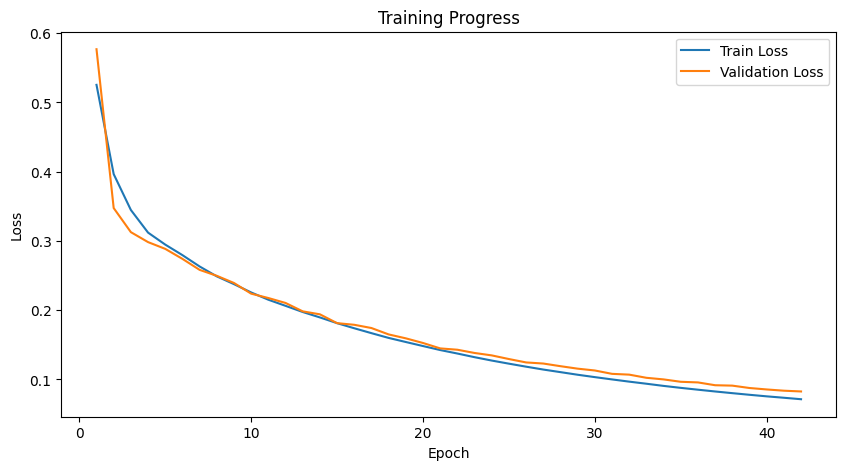

Epoch 43/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0696, Validation Loss: 0.0805


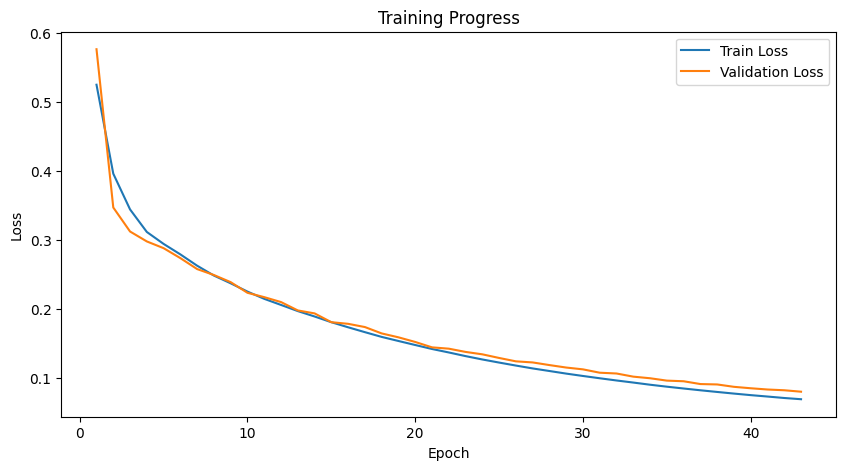

Epoch 44/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0677, Validation Loss: 0.0791


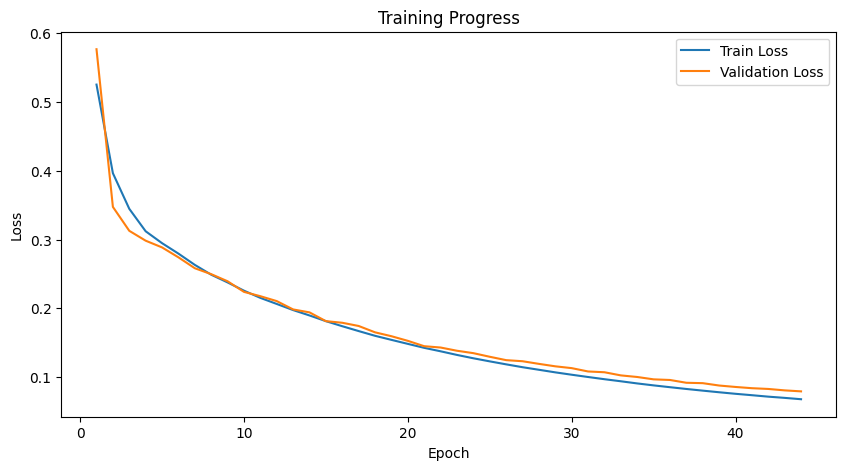

Epoch 45/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0659, Validation Loss: 0.0775


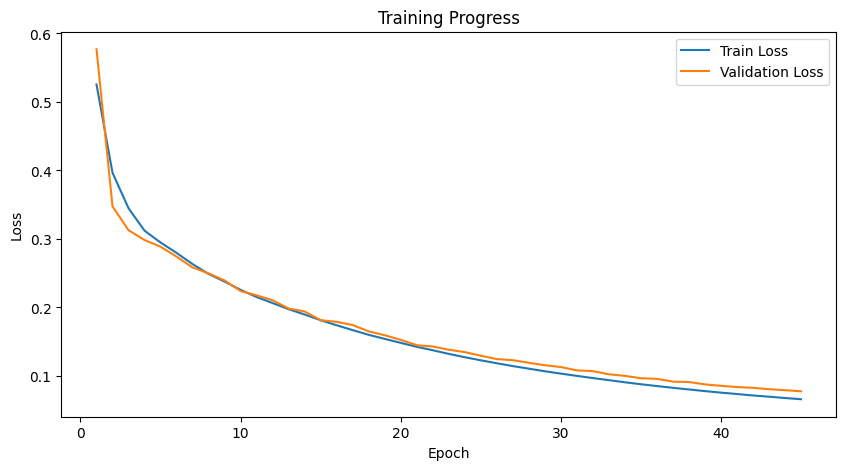

Epoch 46/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0642, Validation Loss: 0.0759


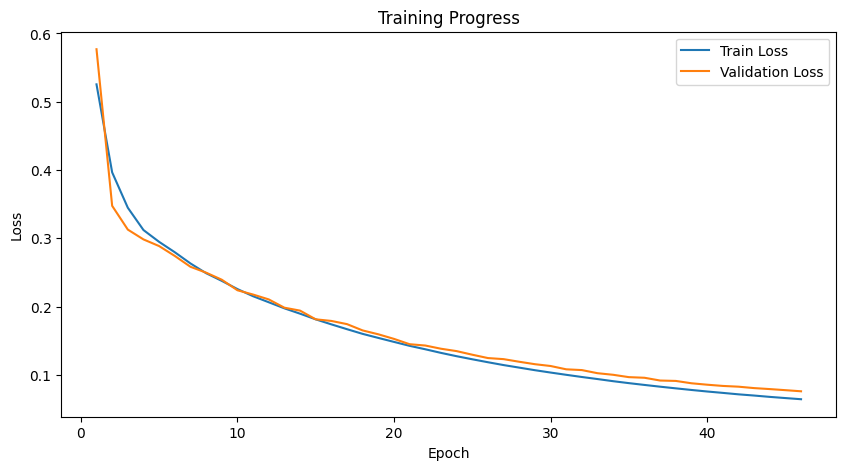

Epoch 47/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0627, Validation Loss: 0.0742


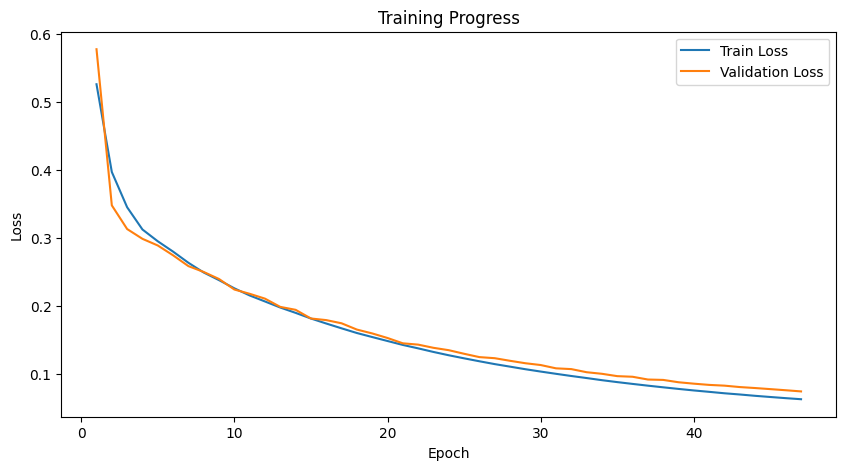

Epoch 48/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0612, Validation Loss: 0.0736


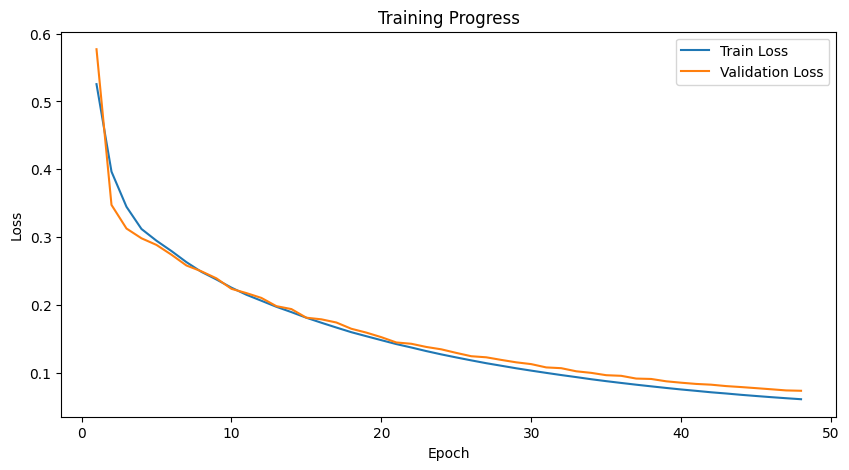

Epoch 49/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0598, Validation Loss: 0.0718


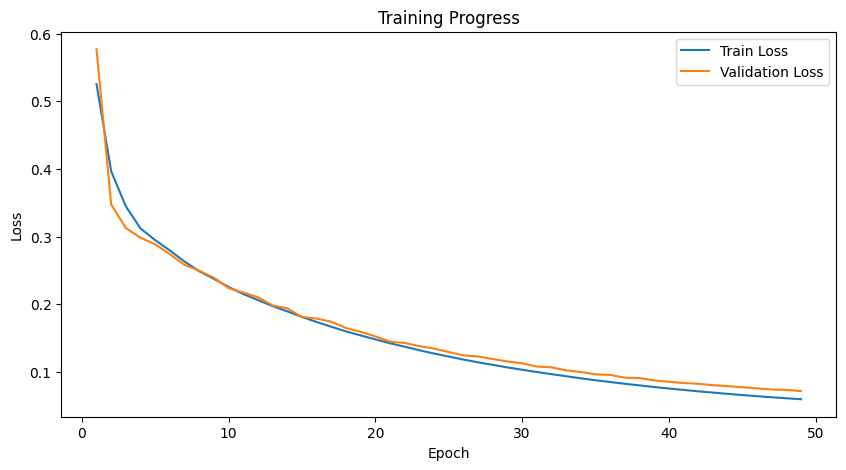

Epoch 50/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0585, Validation Loss: 0.0703


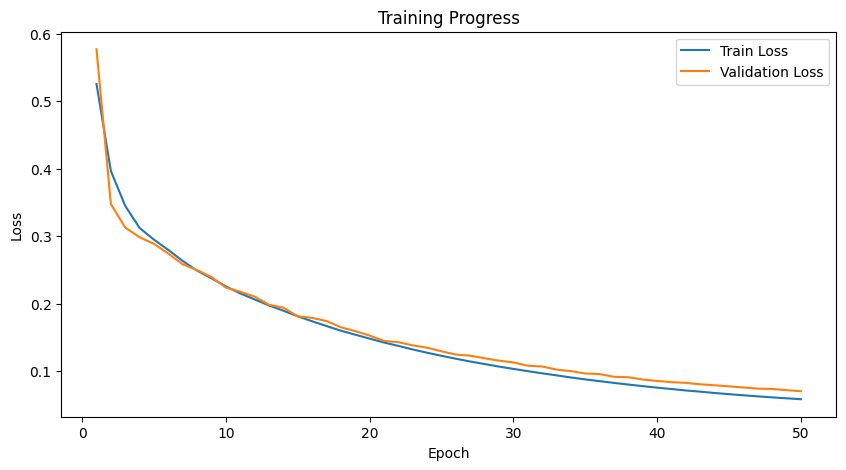

Epoch 51/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0570, Validation Loss: 0.0695


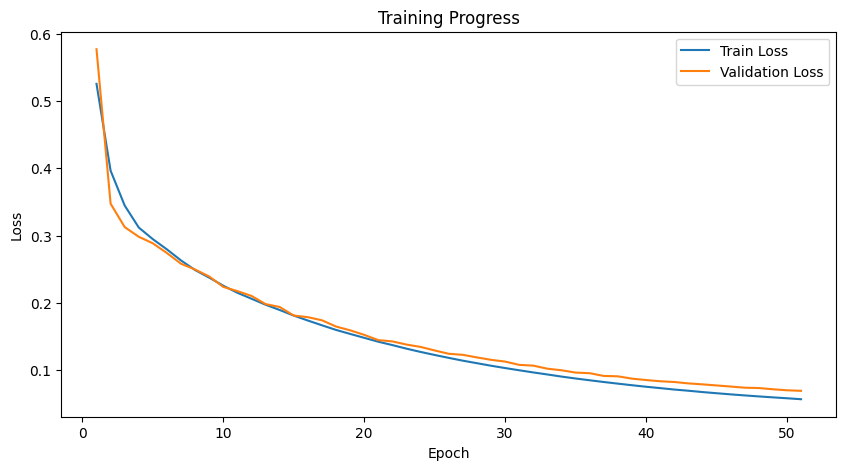

Epoch 52/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0557, Validation Loss: 0.0687


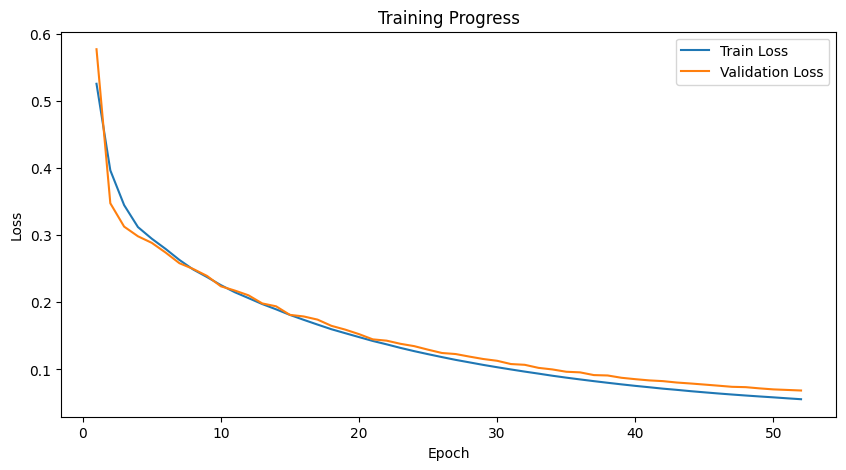

Epoch 53/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0544, Validation Loss: 0.0666


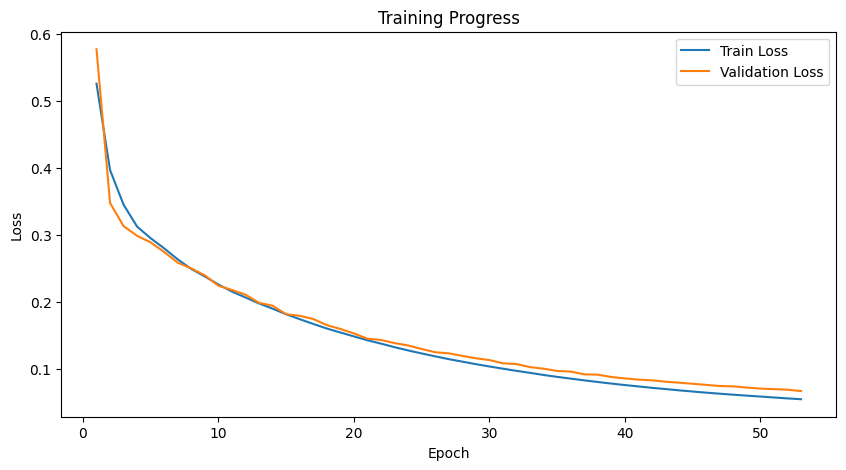

Epoch 54/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0533, Validation Loss: 0.0671


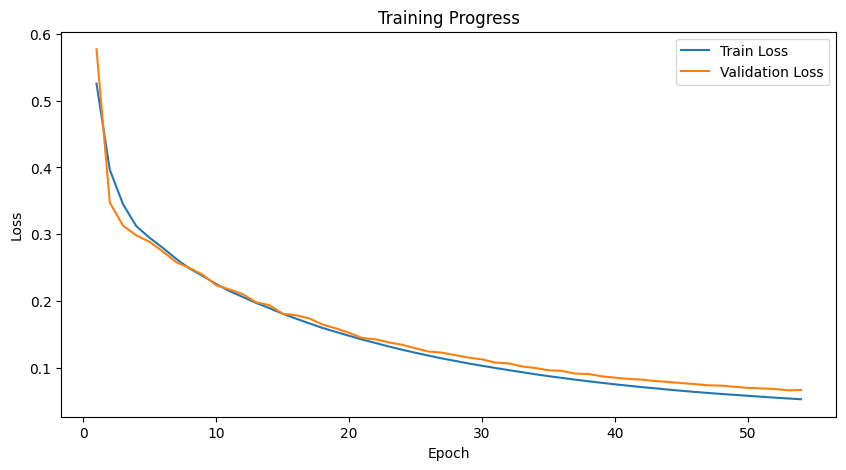

Epoch 55/200


100%|██████████| 23/23 [00:09<00:00,  2.30it/s]


==> Training Loss: 0.0522, Validation Loss: 0.0643


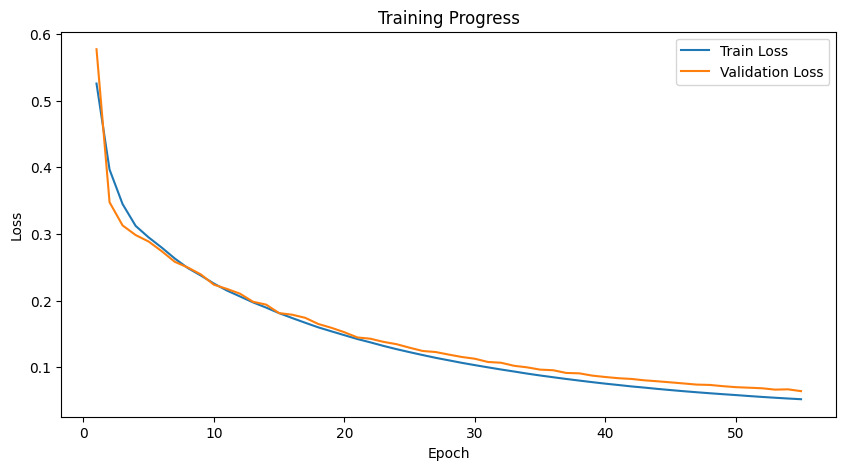

Epoch 56/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0511, Validation Loss: 0.0637


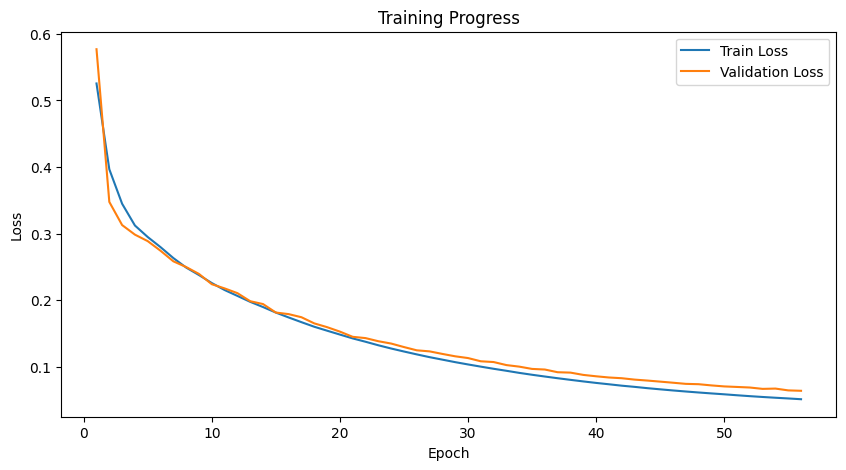

Epoch 57/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0501, Validation Loss: 0.0628


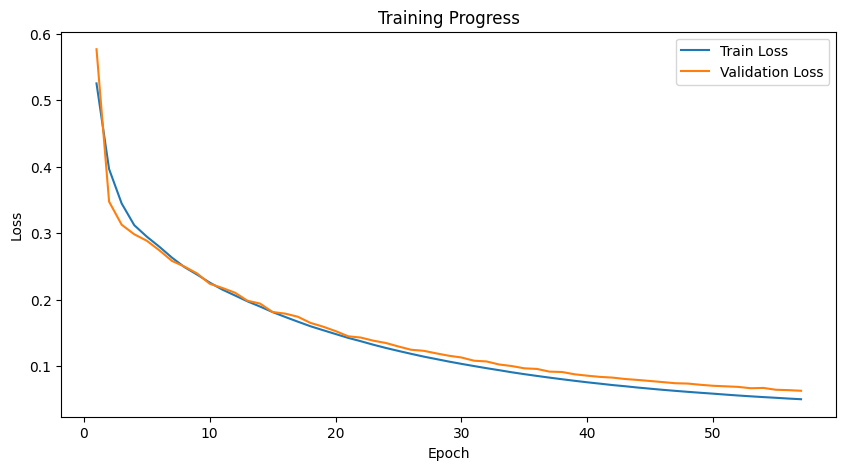

Epoch 58/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0491, Validation Loss: 0.0618


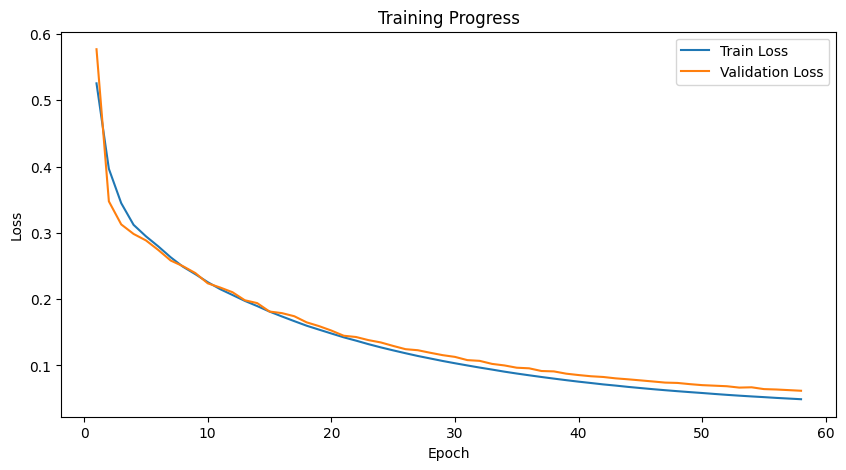

Epoch 59/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0481, Validation Loss: 0.0614


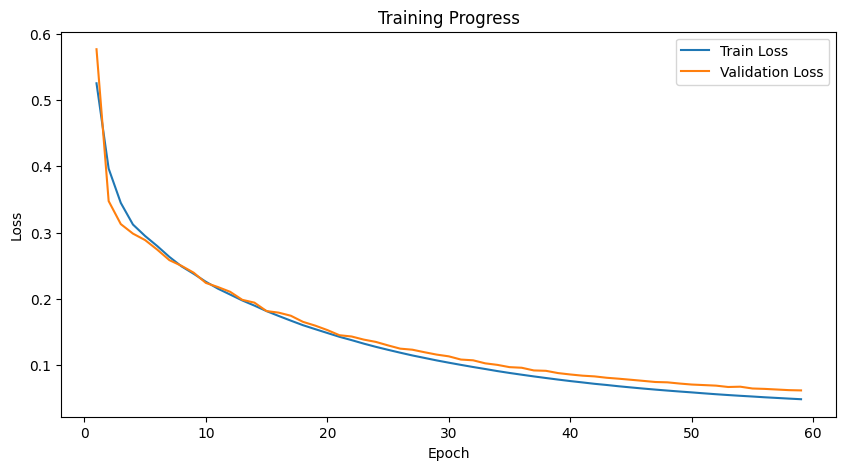

Epoch 60/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0472, Validation Loss: 0.0601


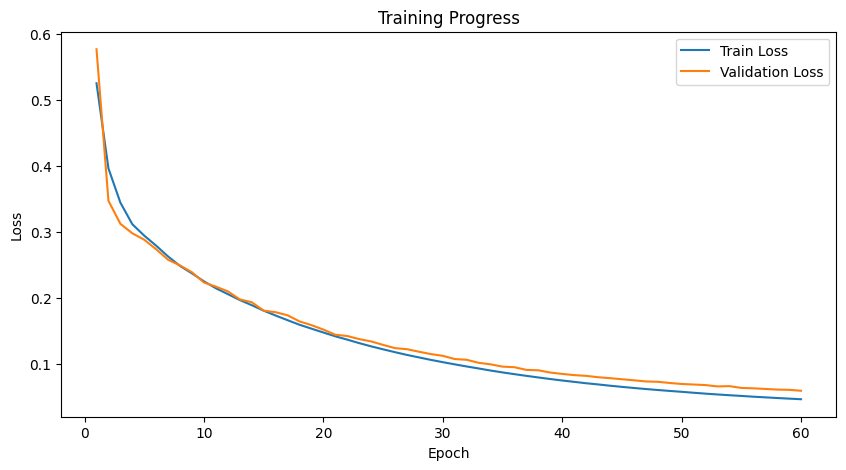

Epoch 61/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0463, Validation Loss: 0.0596


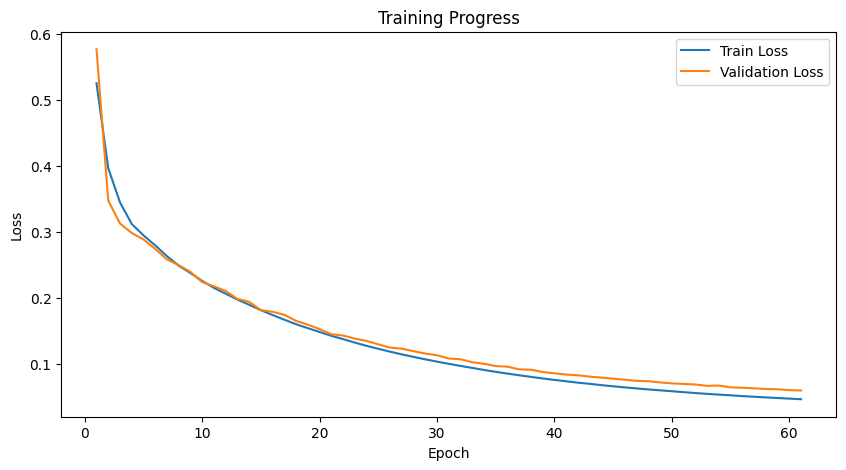

Epoch 62/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0454, Validation Loss: 0.0587


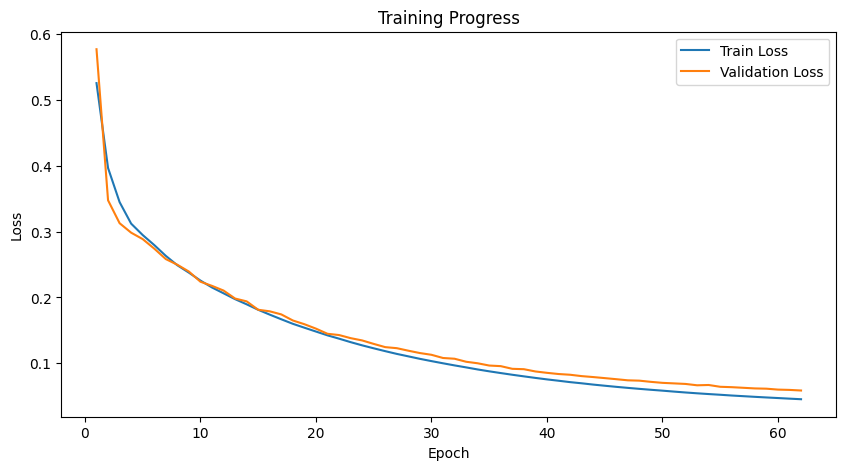

Epoch 63/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0446, Validation Loss: 0.0584


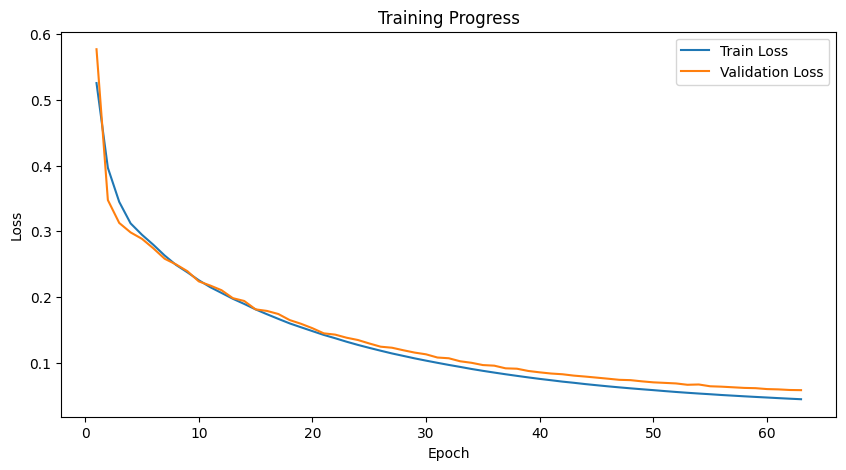

Epoch 64/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0438, Validation Loss: 0.0576


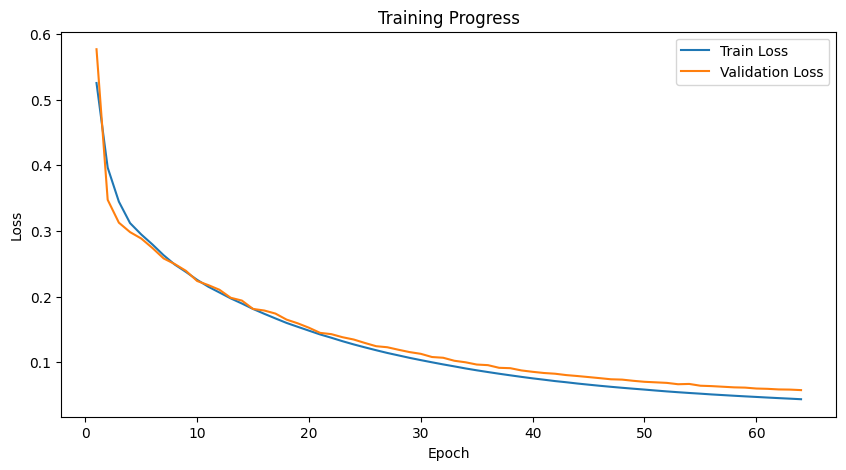

Epoch 65/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0429, Validation Loss: 0.0576


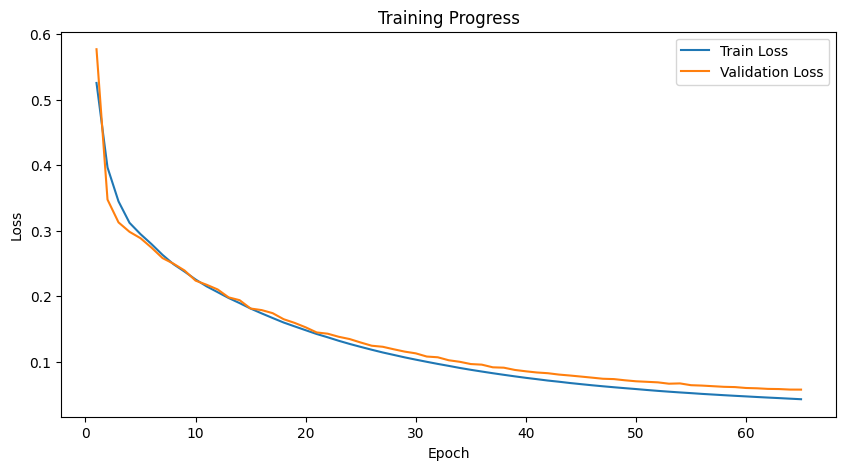

Epoch 66/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0423, Validation Loss: 0.0563


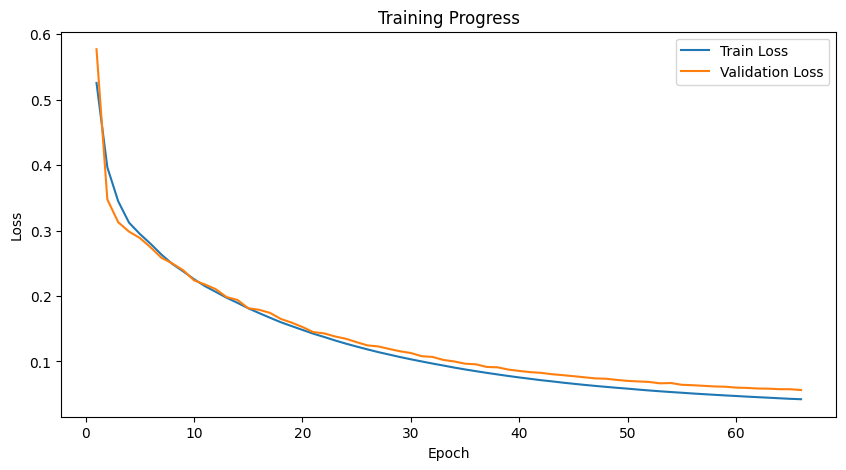

Epoch 67/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0416, Validation Loss: 0.0563


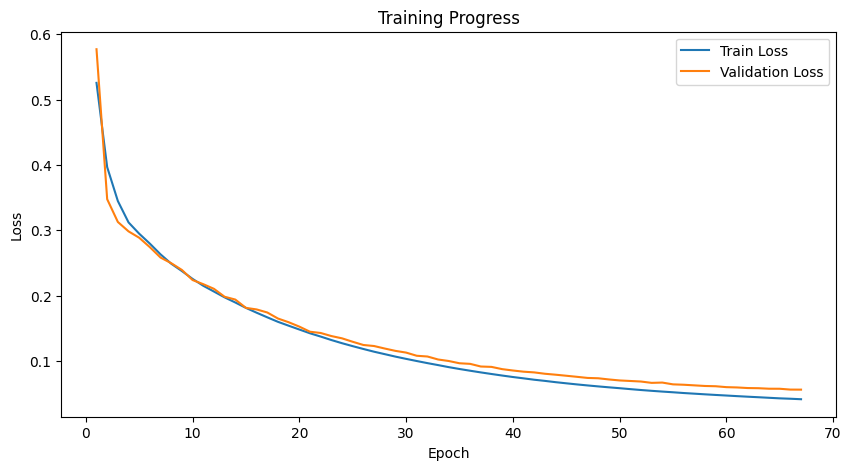

Epoch 68/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0409, Validation Loss: 0.0554


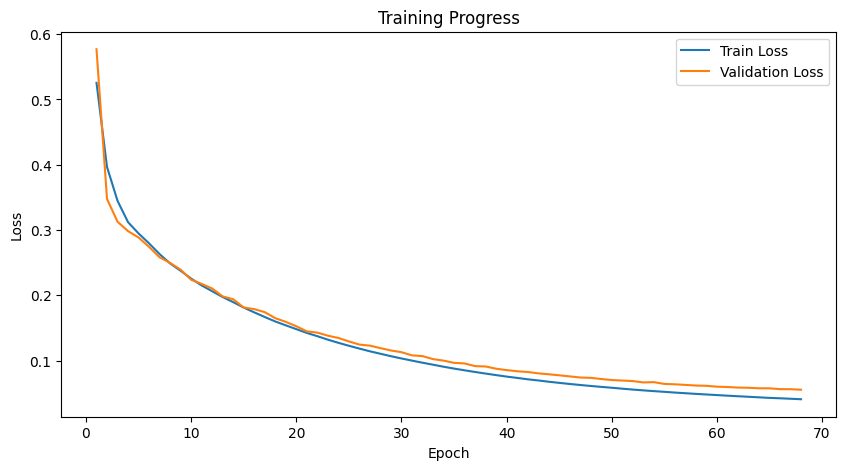

Epoch 69/200


100%|██████████| 23/23 [00:10<00:00,  2.30it/s]


==> Training Loss: 0.0402, Validation Loss: 0.0545


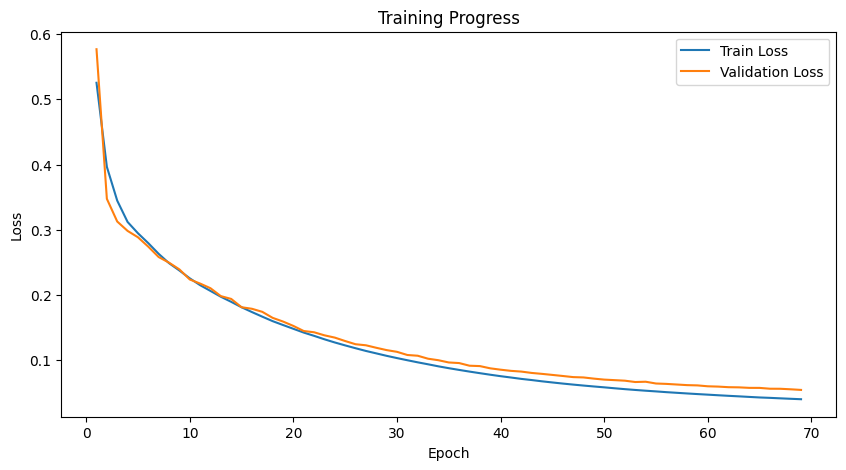

Epoch 70/200


100%|██████████| 23/23 [00:10<00:00,  2.30it/s]


==> Training Loss: 0.0396, Validation Loss: 0.0535


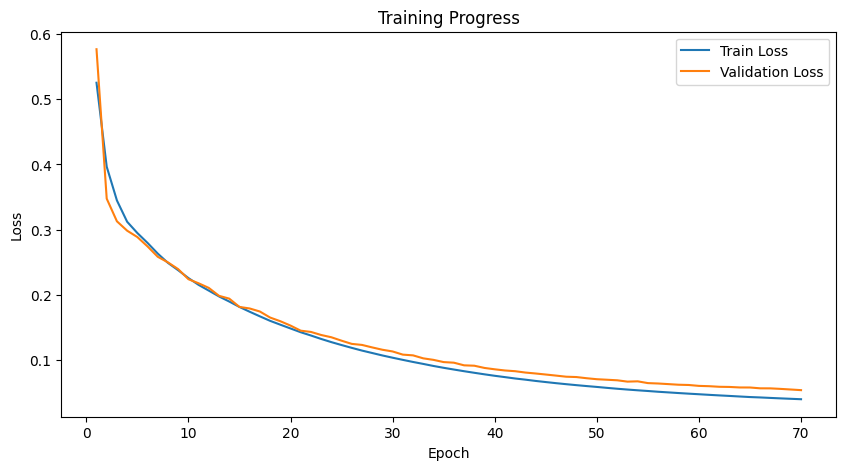

Epoch 71/200


100%|██████████| 23/23 [00:10<00:00,  2.29it/s]


==> Training Loss: 0.0390, Validation Loss: 0.0536


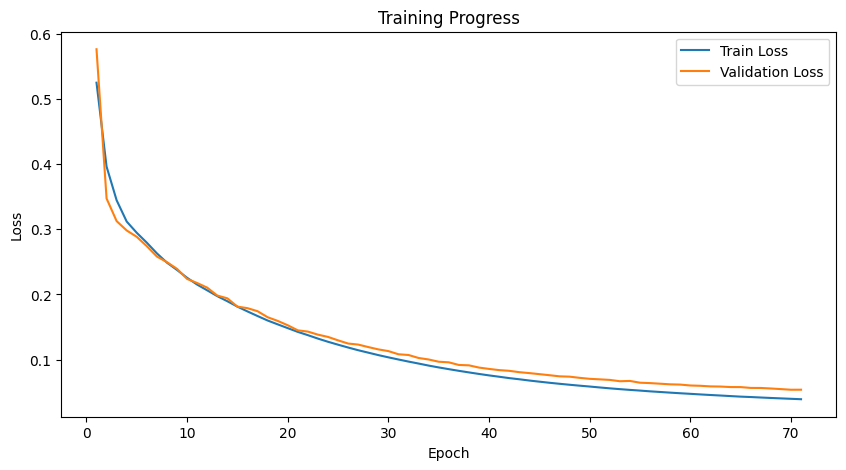

Epoch 72/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0384, Validation Loss: 0.0532


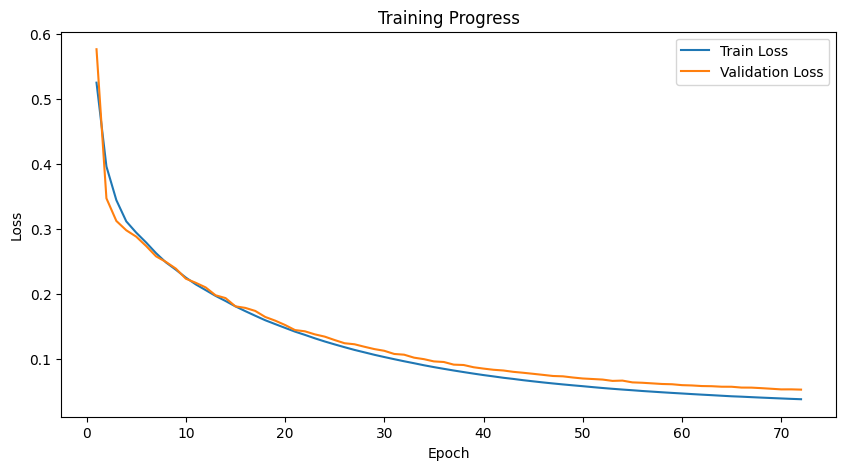

Epoch 73/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0378, Validation Loss: 0.0524


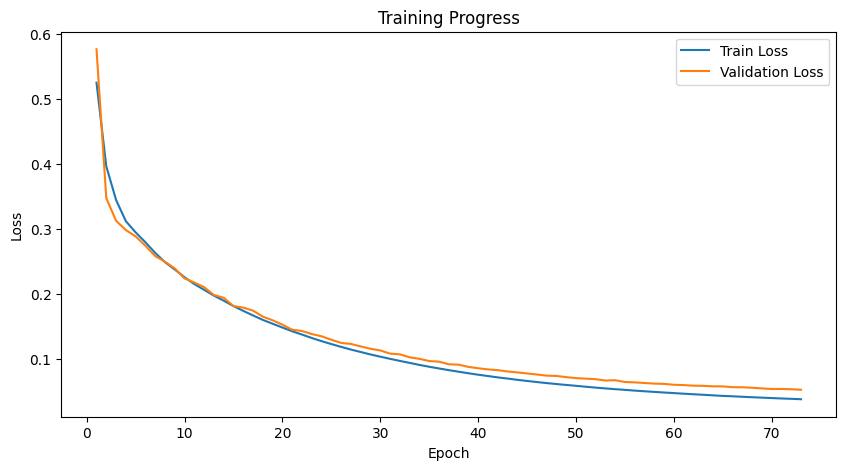

Epoch 74/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0373, Validation Loss: 0.0521


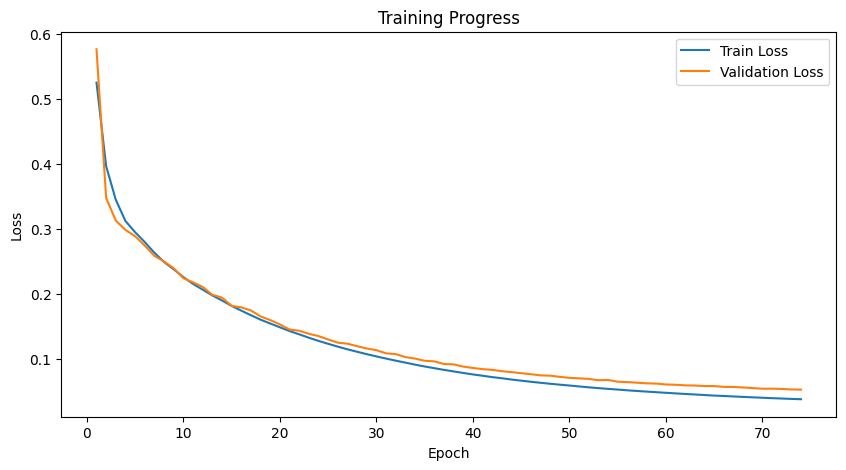

Epoch 75/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0368, Validation Loss: 0.0511


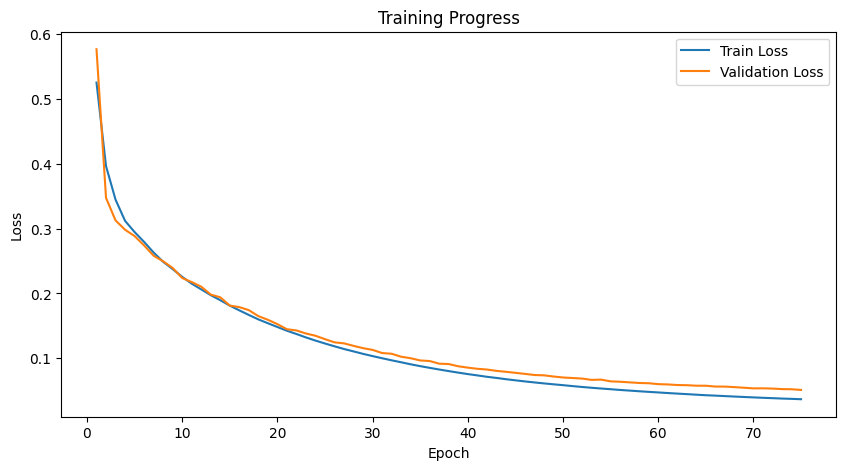

Epoch 76/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0362, Validation Loss: 0.0511


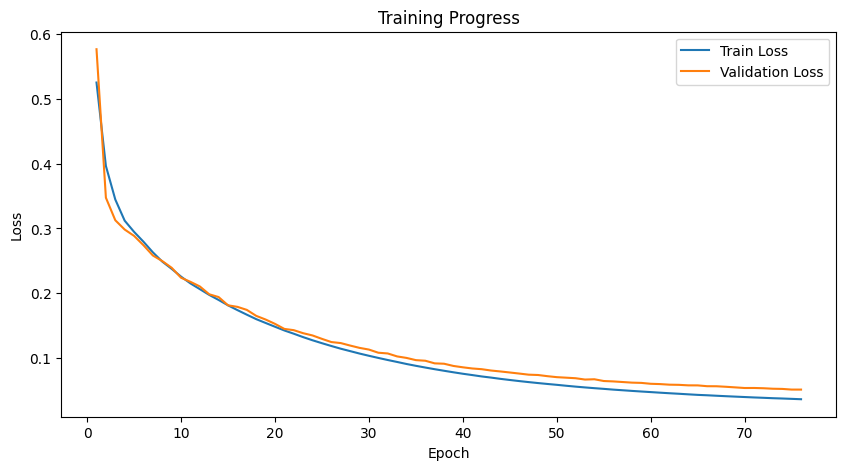

Epoch 77/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0358, Validation Loss: 0.0509


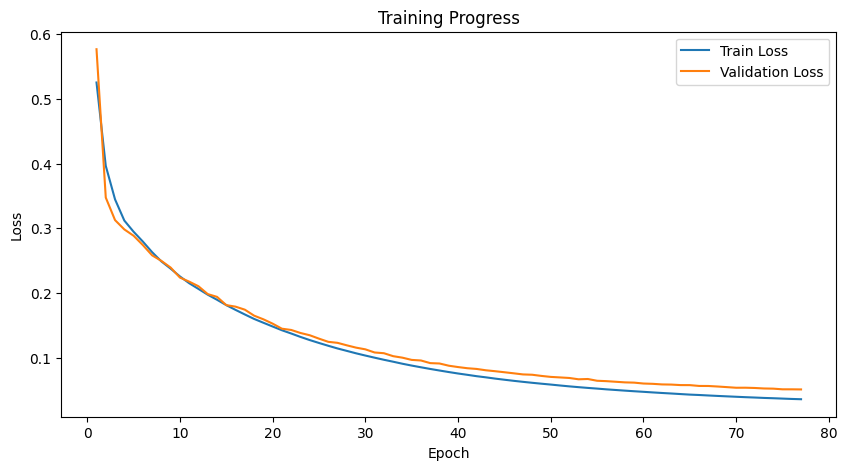

Epoch 78/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0353, Validation Loss: 0.0499


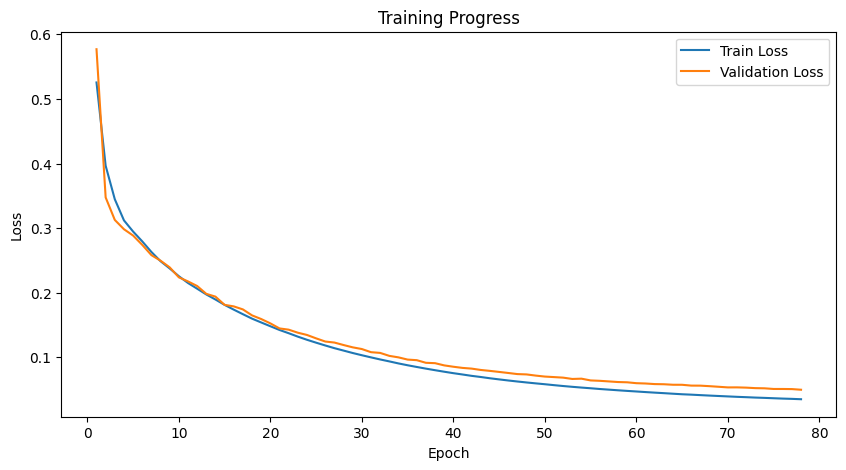

Epoch 79/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0348, Validation Loss: 0.0498


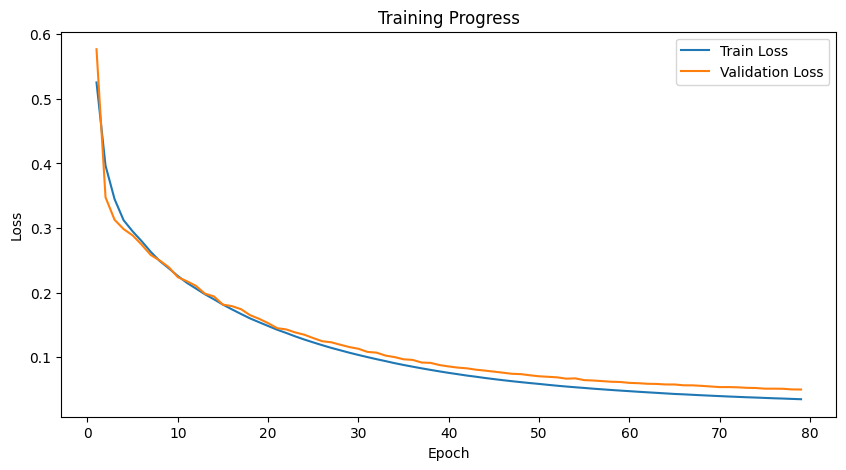

Epoch 80/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0343, Validation Loss: 0.0490


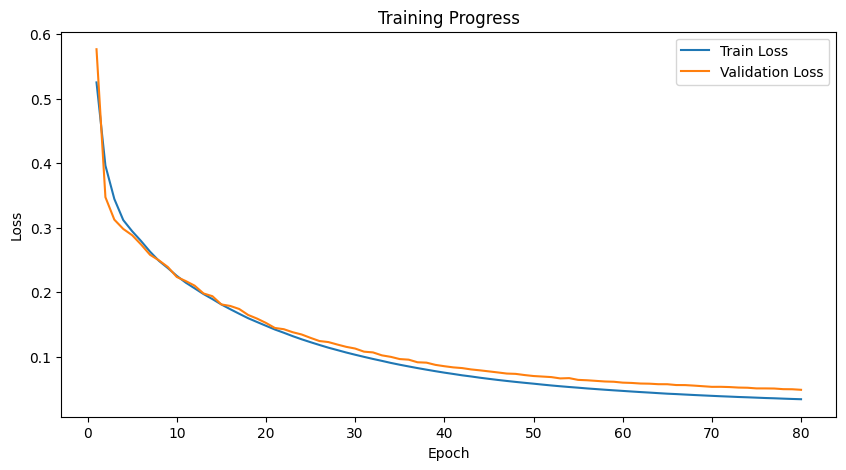

Epoch 81/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0339, Validation Loss: 0.0487


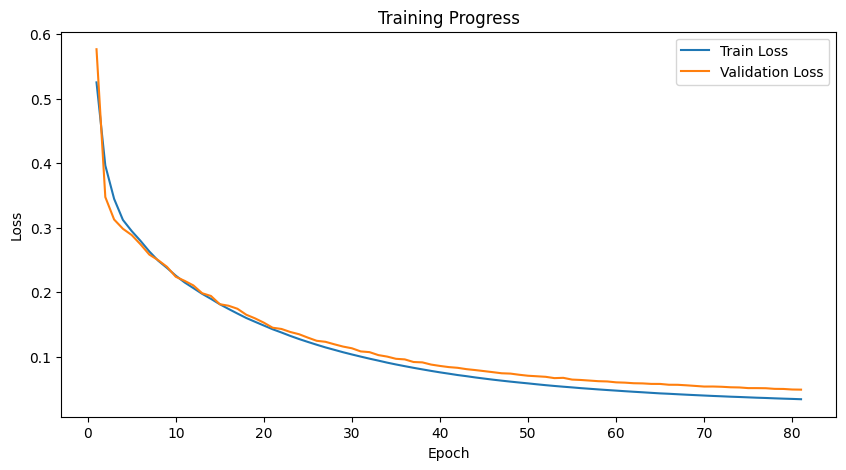

Epoch 82/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0335, Validation Loss: 0.0486


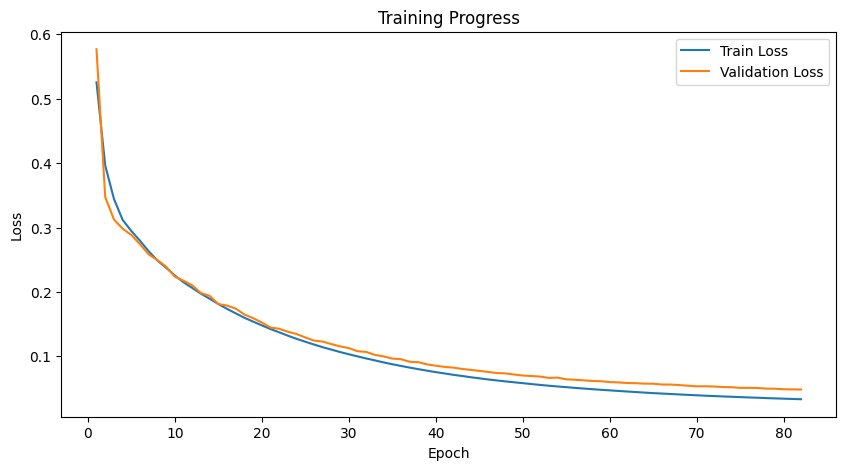

Epoch 83/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0331, Validation Loss: 0.0485


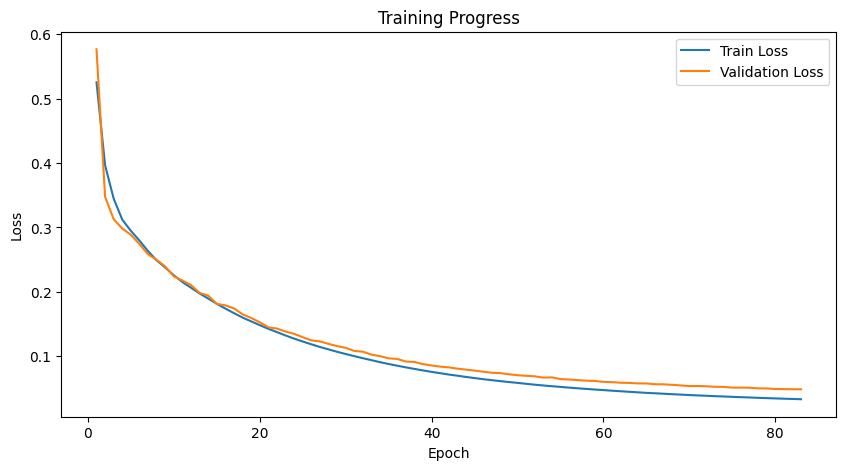

Epoch 84/200


100%|██████████| 23/23 [00:10<00:00,  2.28it/s]


==> Training Loss: 0.0327, Validation Loss: 0.0485


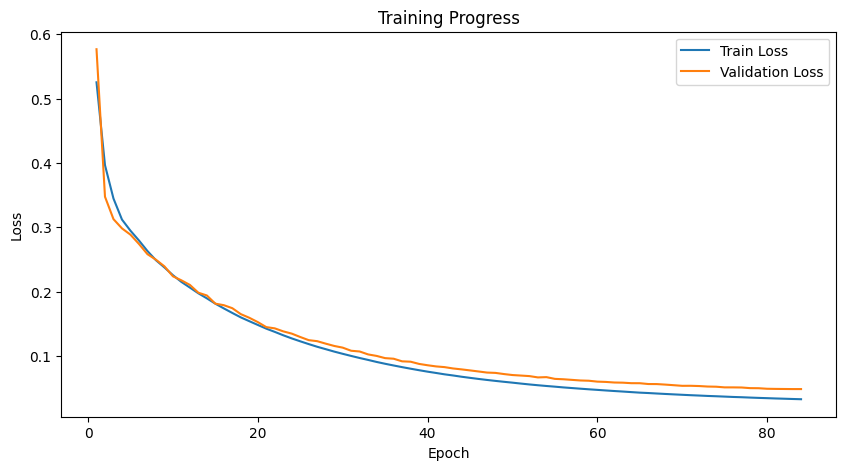

Epoch 85/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0323, Validation Loss: 0.0483


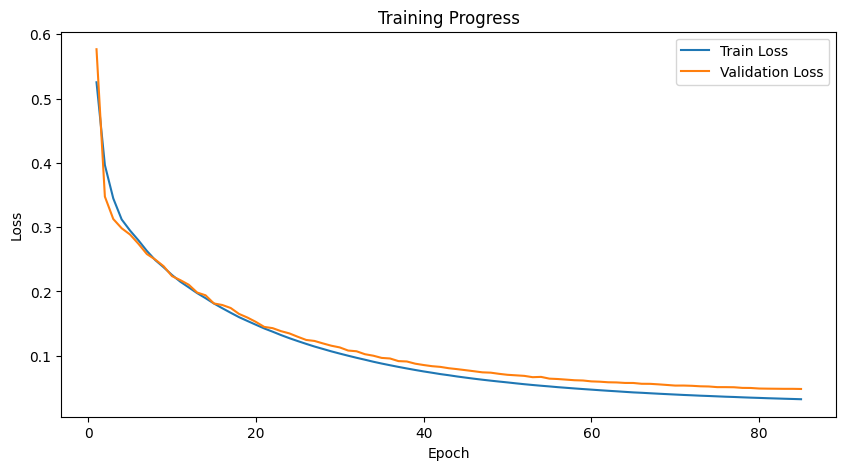

Epoch 86/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0319, Validation Loss: 0.0471


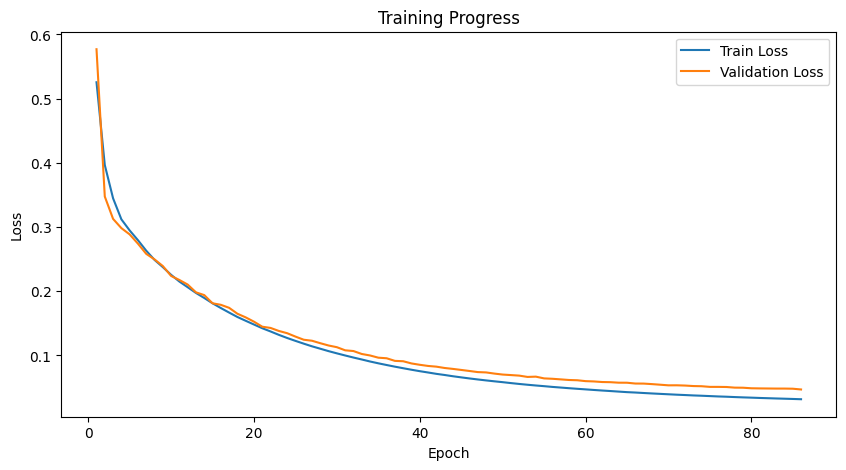

Epoch 87/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0315, Validation Loss: 0.0469


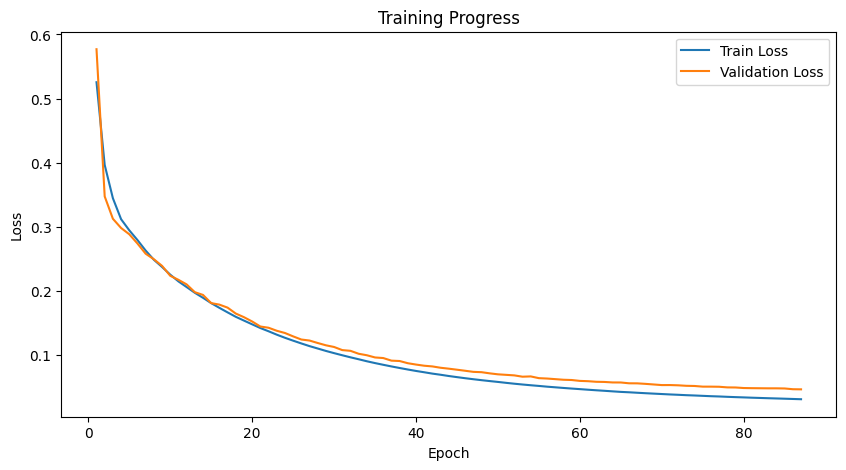

Epoch 88/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0312, Validation Loss: 0.0470


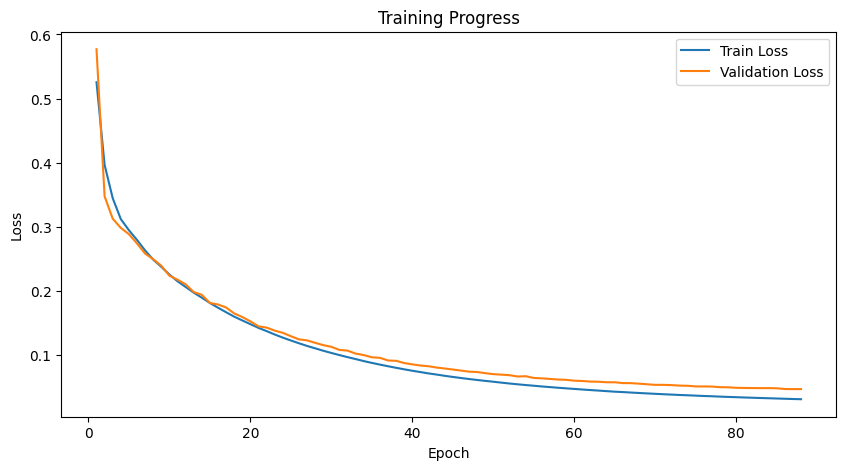

Epoch 89/200


100%|██████████| 23/23 [00:10<00:00,  2.24it/s]


==> Training Loss: 0.0308, Validation Loss: 0.0460


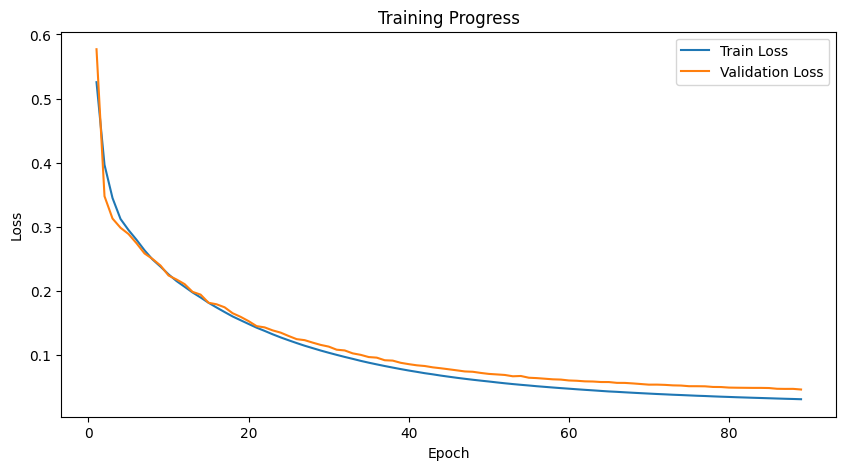

Epoch 90/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0305, Validation Loss: 0.0465


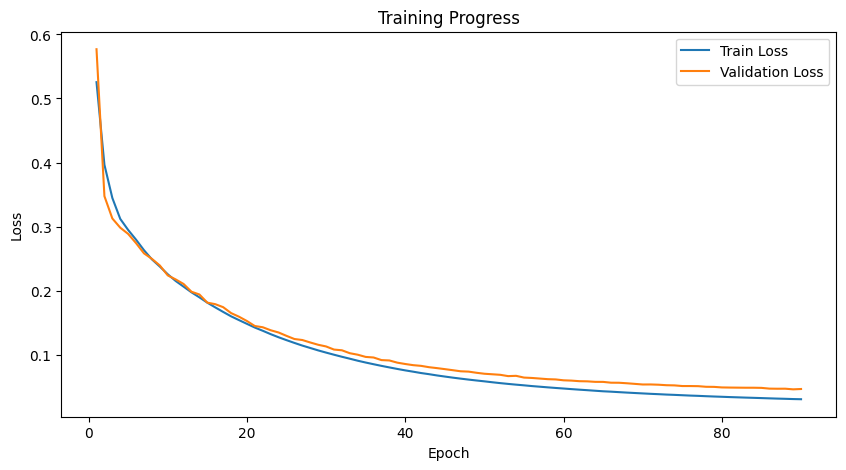

Epoch 91/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0303, Validation Loss: 0.0460


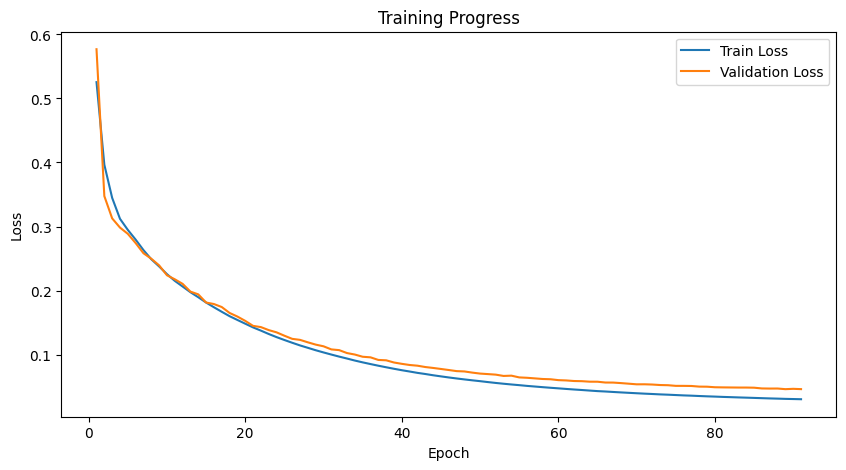

Epoch 92/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0299, Validation Loss: 0.0462


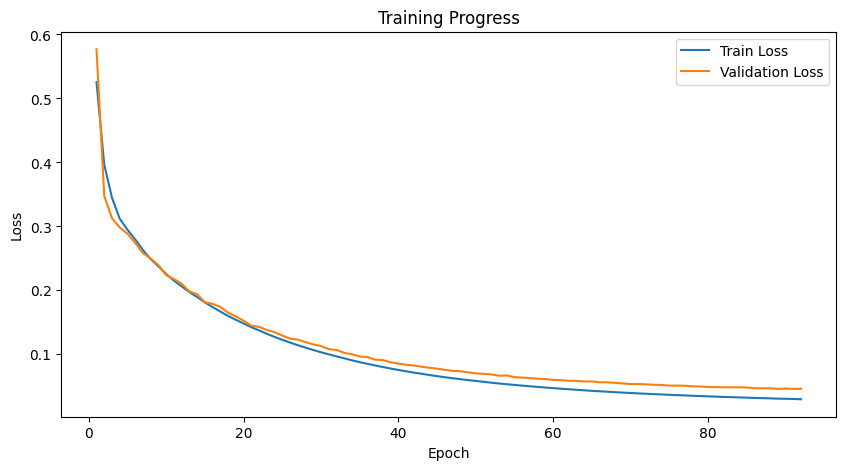

Epoch 93/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0295, Validation Loss: 0.0457


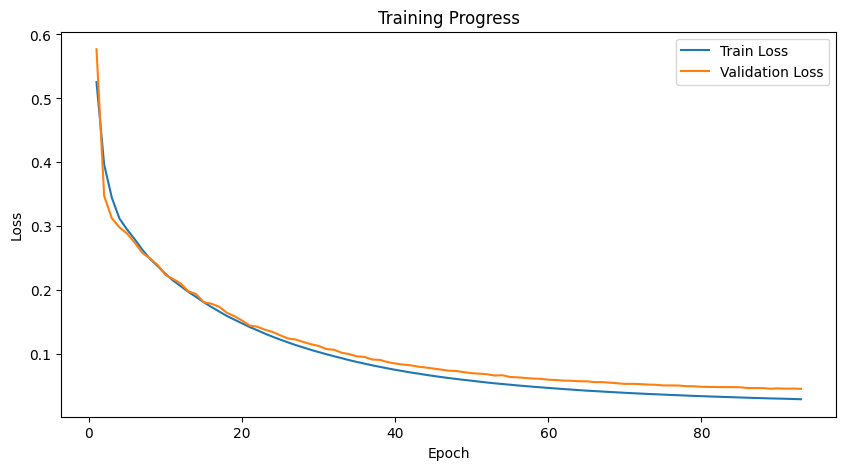

Epoch 94/200


100%|██████████| 23/23 [00:10<00:00,  2.24it/s]


==> Training Loss: 0.0292, Validation Loss: 0.0451


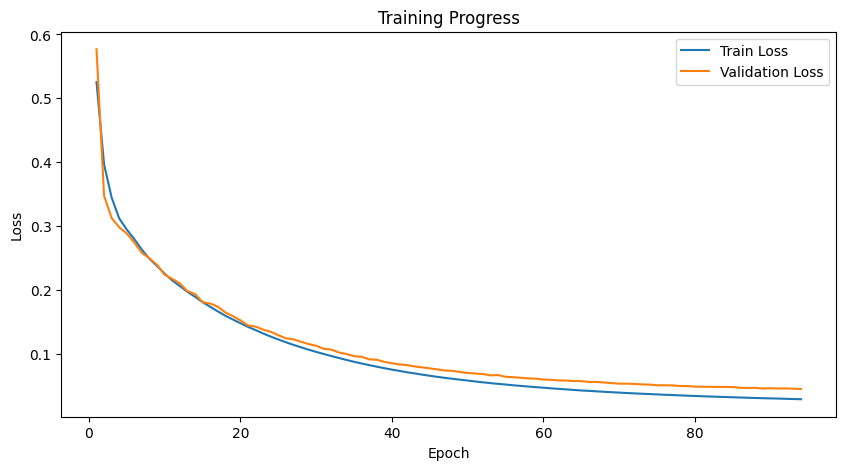

Epoch 95/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0290, Validation Loss: 0.0446


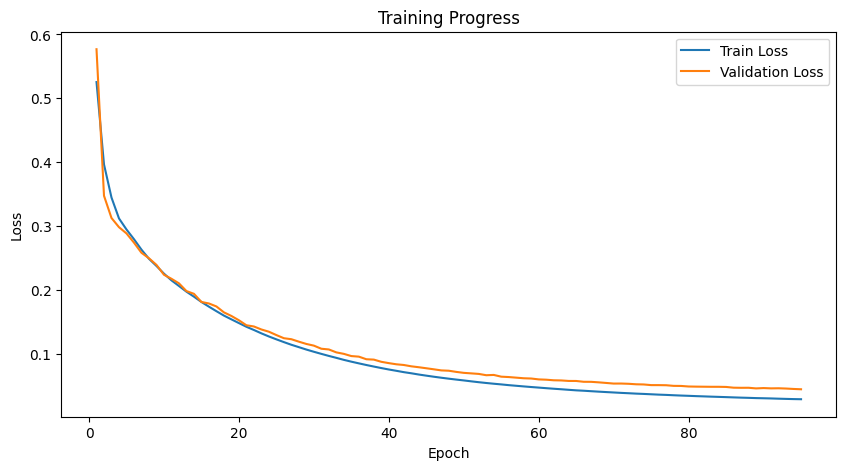

Epoch 96/200


100%|██████████| 23/23 [00:10<00:00,  2.24it/s]


==> Training Loss: 0.0287, Validation Loss: 0.0450


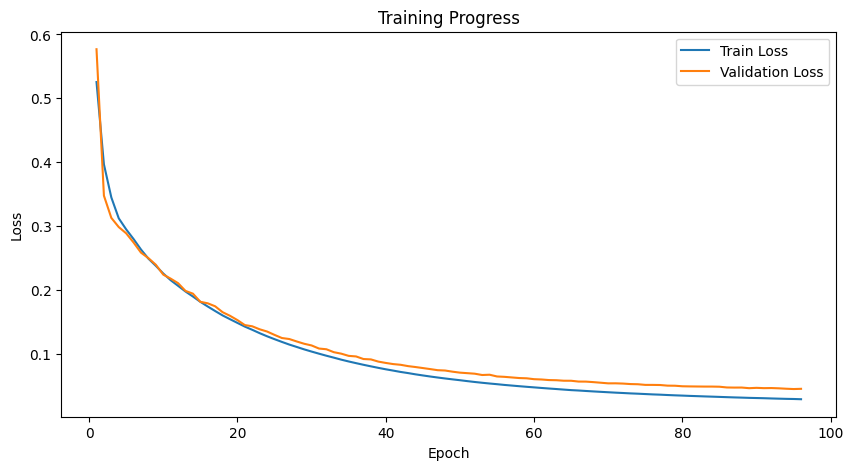

Epoch 97/200


100%|██████████| 23/23 [00:10<00:00,  2.24it/s]


==> Training Loss: 0.0285, Validation Loss: 0.0439


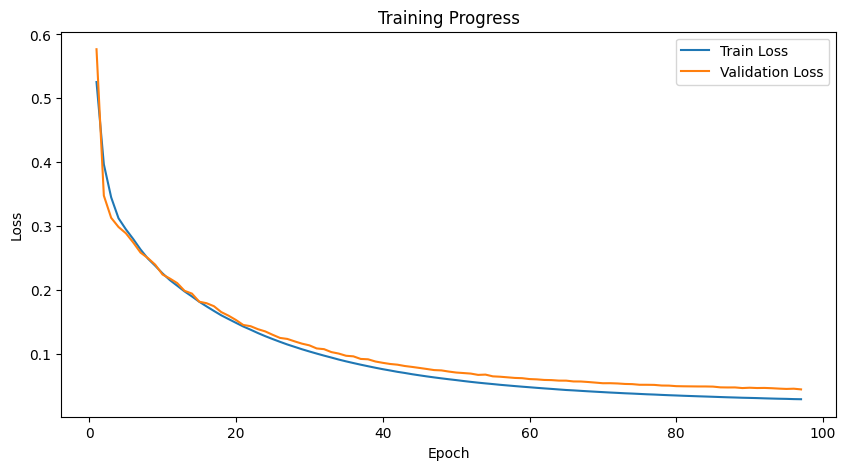

Epoch 98/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0283, Validation Loss: 0.0440


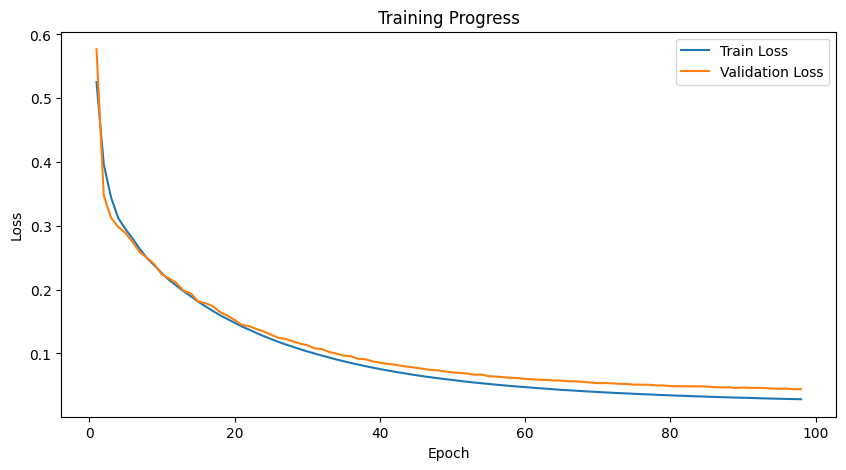

Epoch 99/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0280, Validation Loss: 0.0440


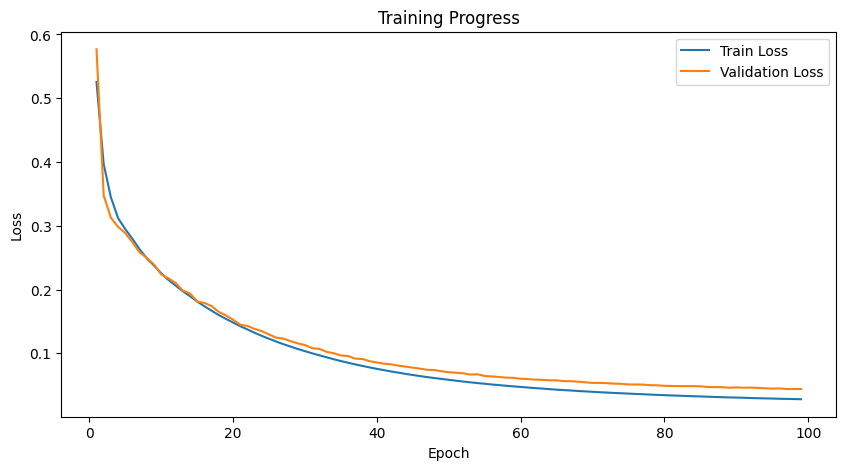

Epoch 100/200


100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


==> Training Loss: 0.0276, Validation Loss: 0.0432


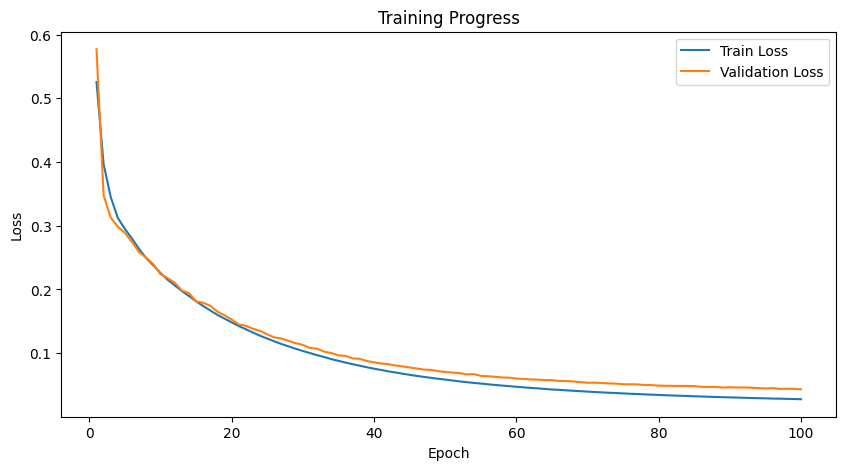

Epoch 101/200


100%|██████████| 23/23 [00:10<00:00,  2.26it/s]


==> Training Loss: 0.0275, Validation Loss: 0.0434


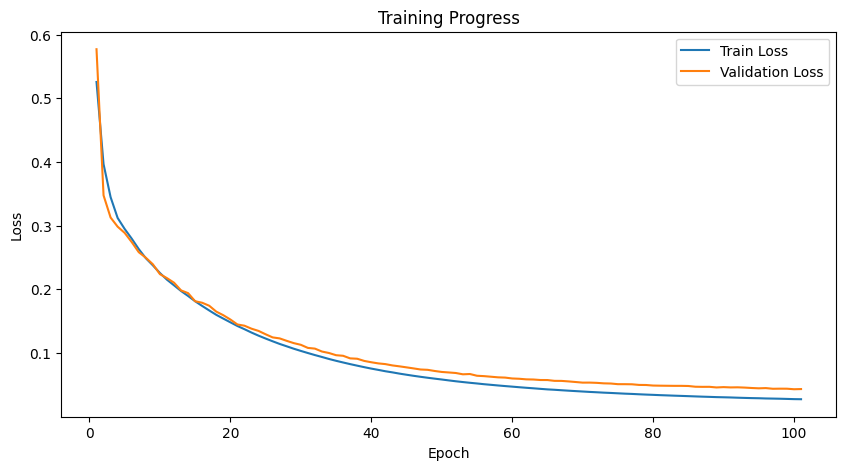

Epoch 102/200


100%|██████████| 23/23 [00:10<00:00,  2.22it/s]


==> Training Loss: 0.0273, Validation Loss: 0.0436


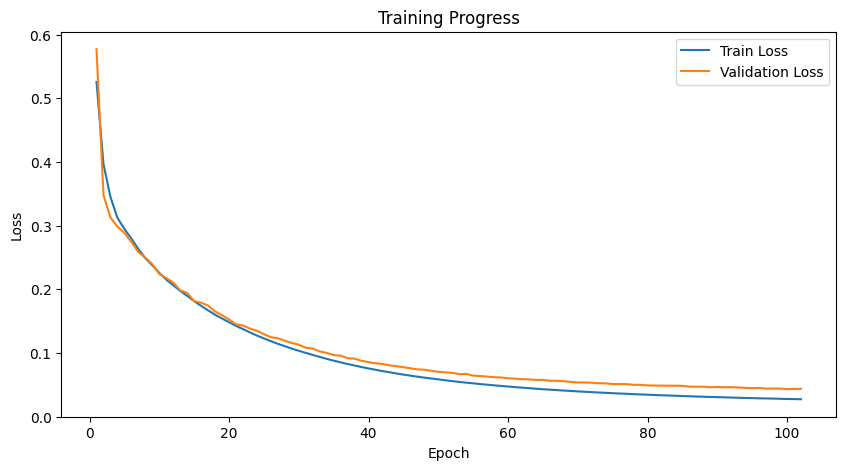

Epoch 103/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0270, Validation Loss: 0.0433


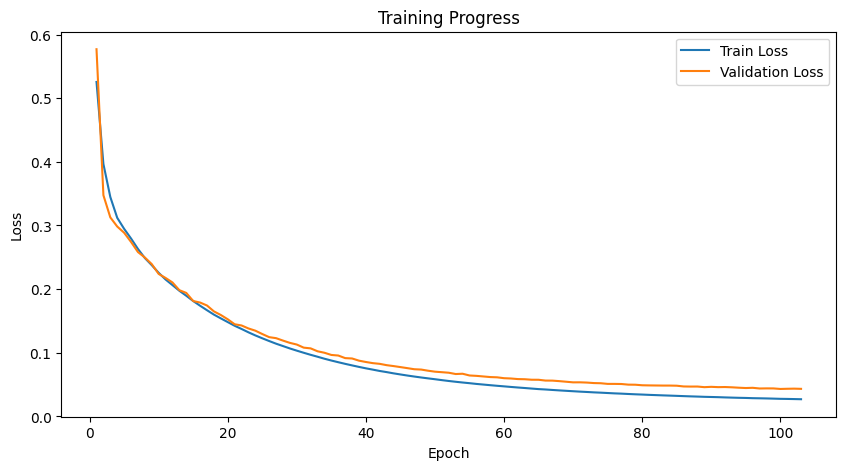

Epoch 104/200


100%|██████████| 23/23 [00:10<00:00,  2.24it/s]


==> Training Loss: 0.0268, Validation Loss: 0.0425


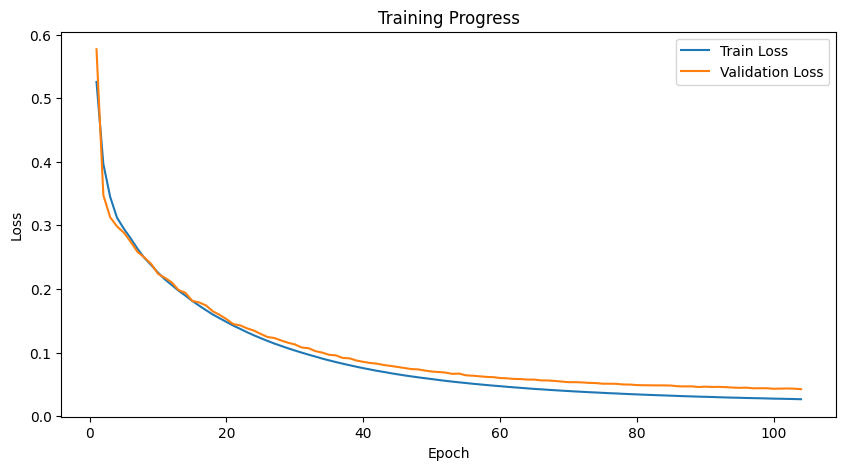

Epoch 105/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0265, Validation Loss: 0.0431


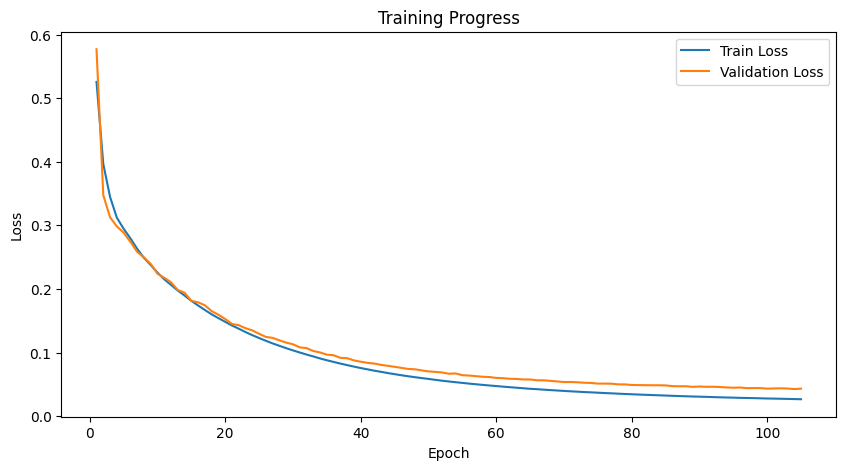

Epoch 106/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0263, Validation Loss: 0.0423


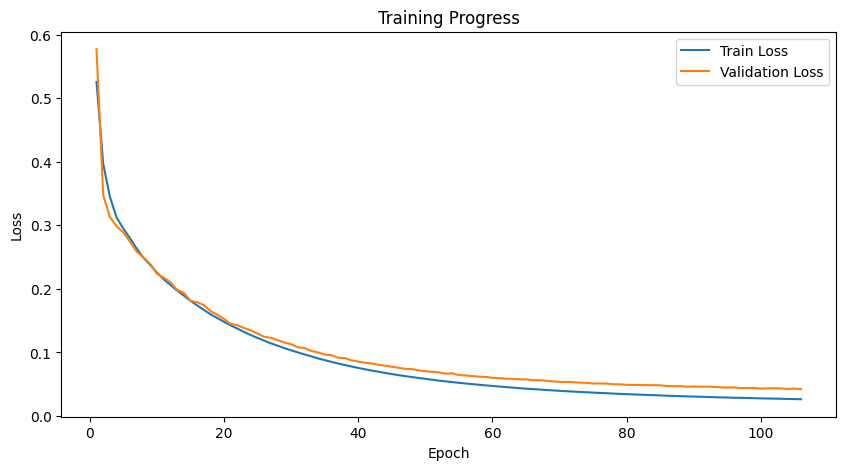

Epoch 107/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0262, Validation Loss: 0.0427


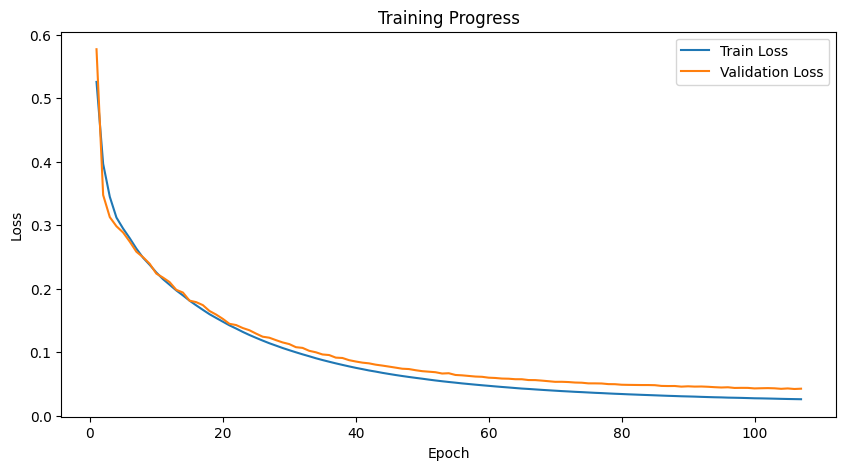

Epoch 108/200


100%|██████████| 23/23 [00:10<00:00,  2.22it/s]


==> Training Loss: 0.0260, Validation Loss: 0.0422


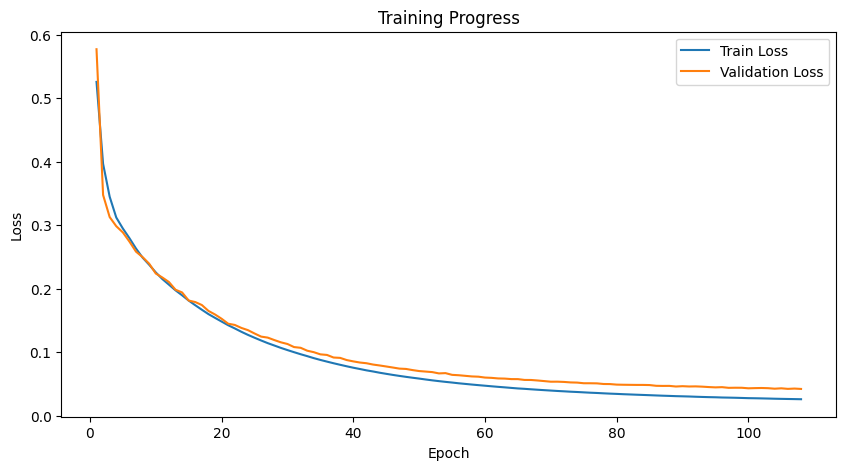

Epoch 109/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0257, Validation Loss: 0.0427


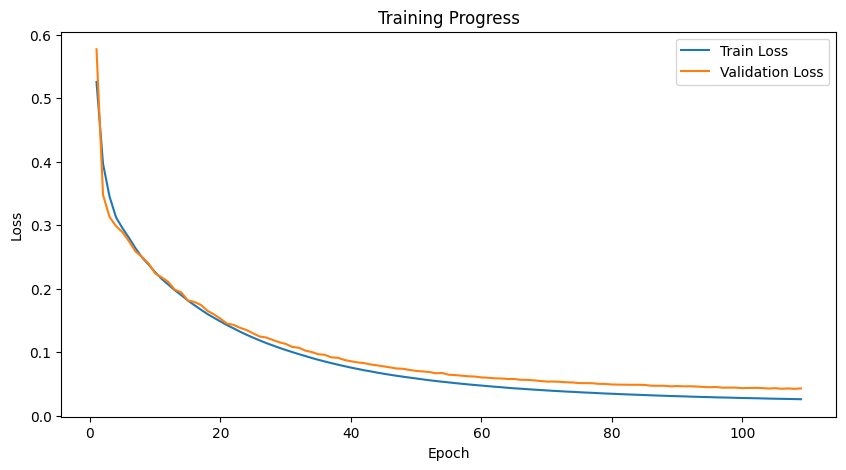

Epoch 110/200


100%|██████████| 23/23 [00:10<00:00,  2.22it/s]


==> Training Loss: 0.0256, Validation Loss: 0.0421


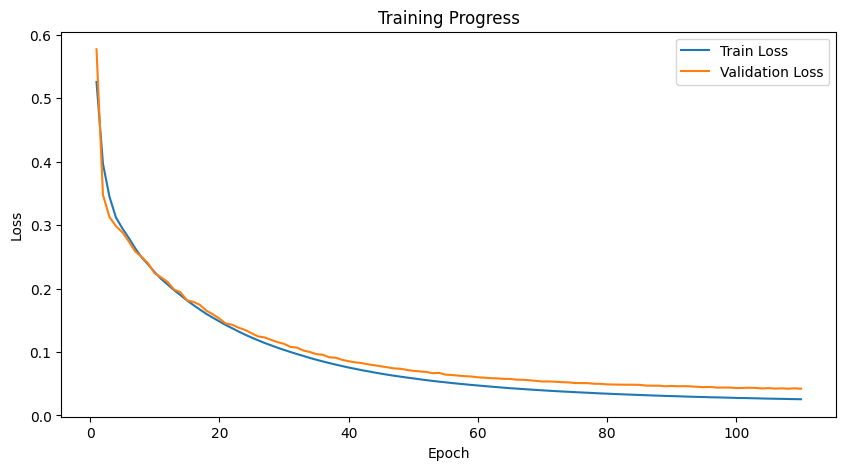

Epoch 111/200


100%|██████████| 23/23 [00:10<00:00,  2.20it/s]


==> Training Loss: 0.0254, Validation Loss: 0.0416


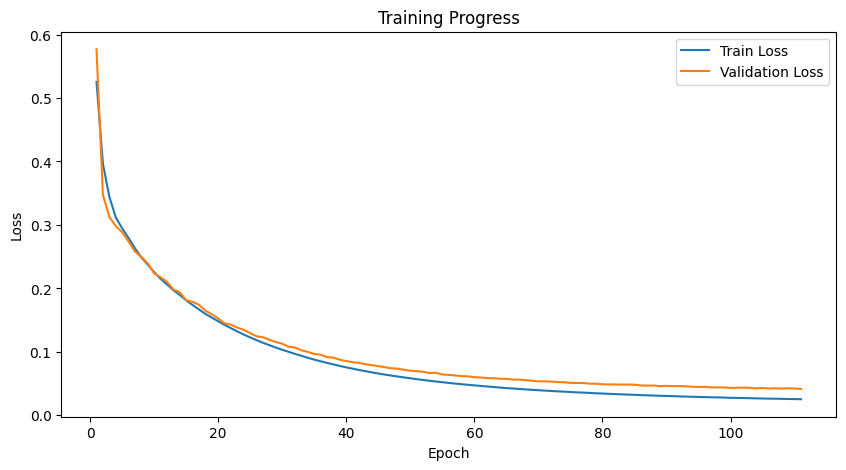

Epoch 112/200


100%|██████████| 23/23 [00:10<00:00,  2.22it/s]


==> Training Loss: 0.0252, Validation Loss: 0.0417


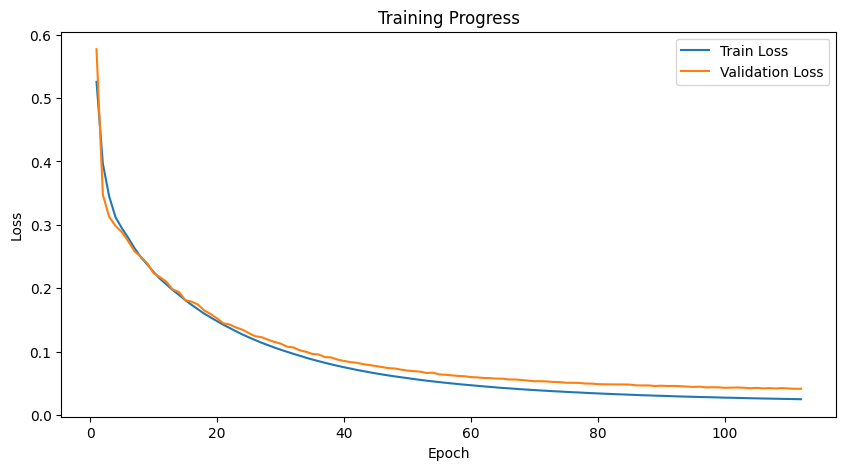

Epoch 113/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0250, Validation Loss: 0.0417


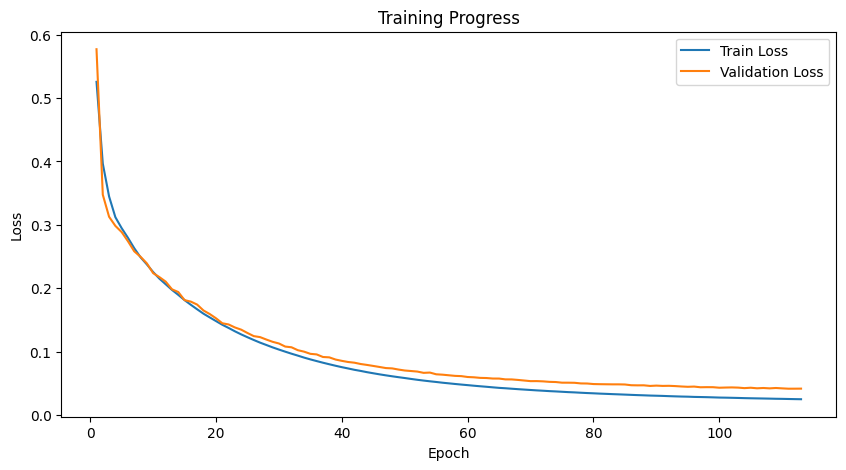

Epoch 114/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0248, Validation Loss: 0.0412


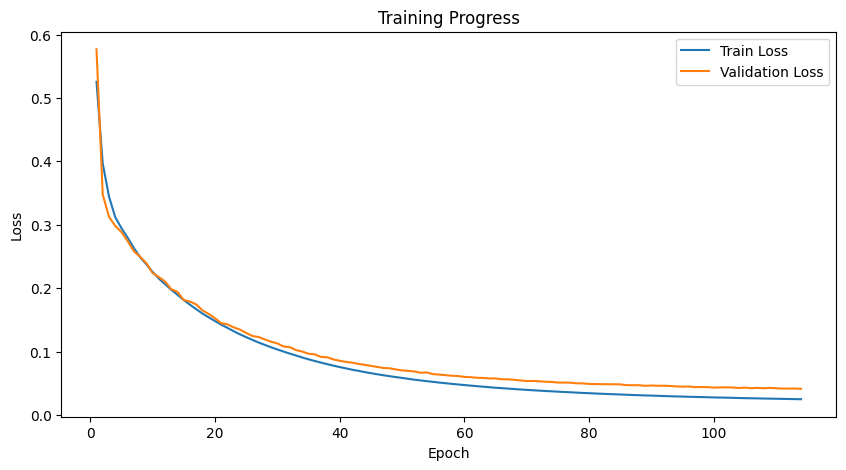

Epoch 115/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0247, Validation Loss: 0.0424


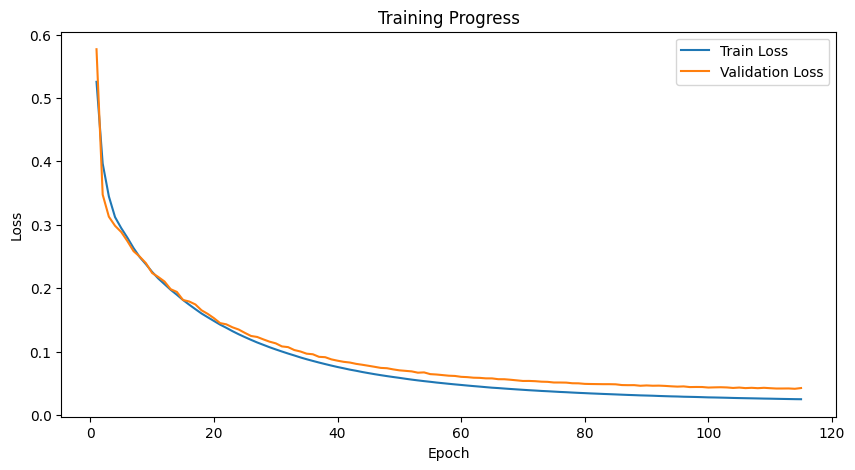

Epoch 116/200


100%|██████████| 23/23 [00:10<00:00,  2.24it/s]


==> Training Loss: 0.0246, Validation Loss: 0.0407


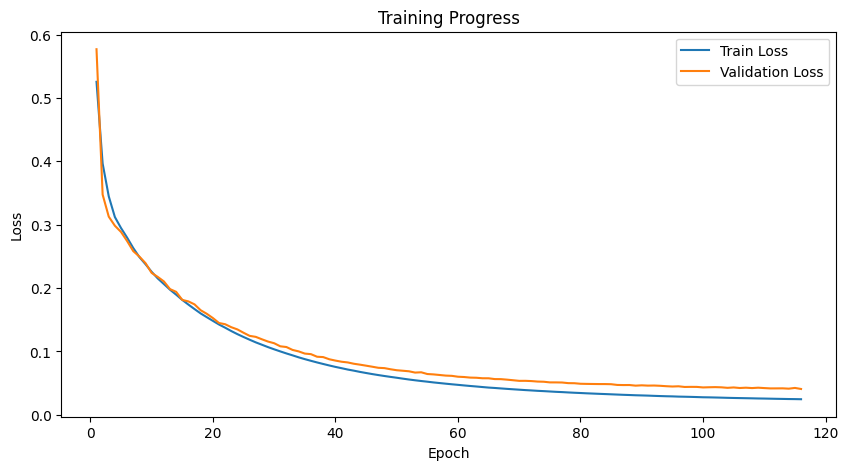

Epoch 117/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0245, Validation Loss: 0.0404


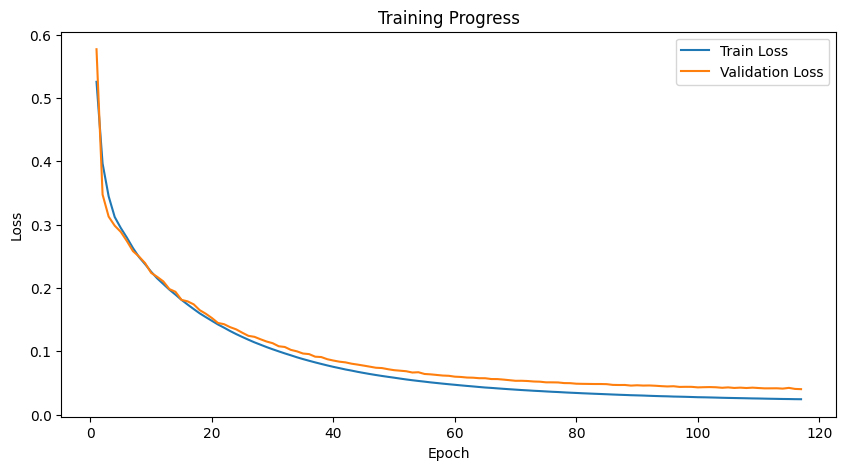

Epoch 118/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0242, Validation Loss: 0.0408


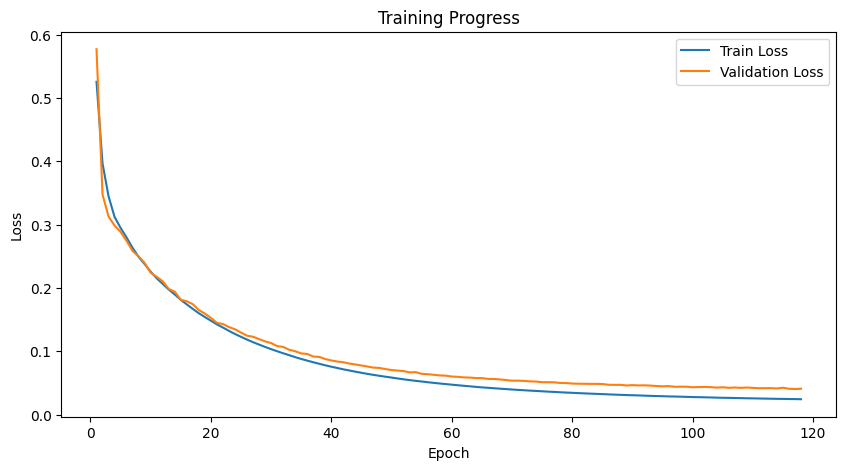

Epoch 119/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0241, Validation Loss: 0.0408


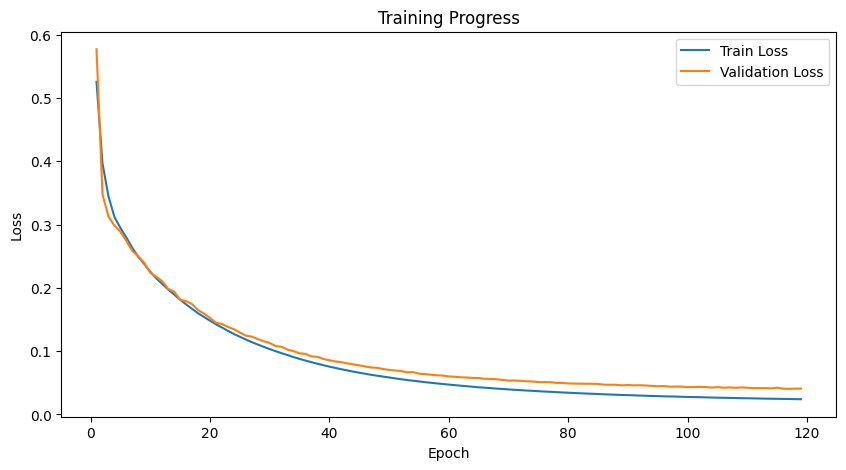

Epoch 120/200


100%|██████████| 23/23 [00:10<00:00,  2.22it/s]


==> Training Loss: 0.0240, Validation Loss: 0.0404


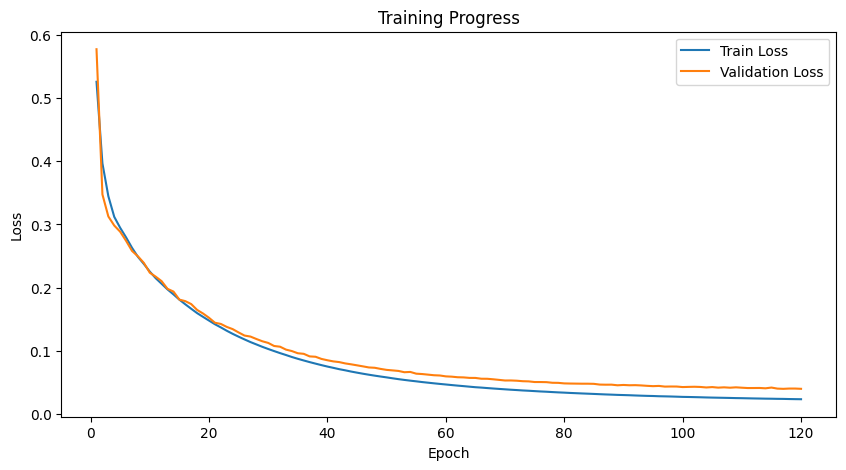

Epoch 121/200


100%|██████████| 23/23 [00:10<00:00,  2.20it/s]


==> Training Loss: 0.0238, Validation Loss: 0.0402


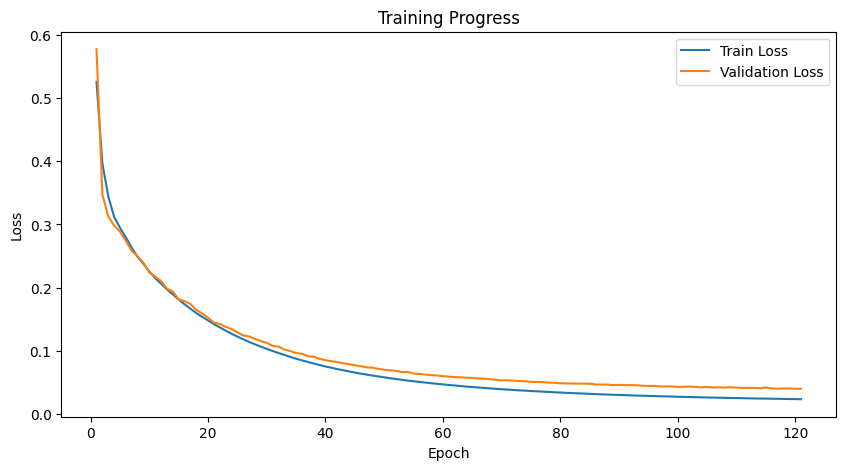

Epoch 122/200


100%|██████████| 23/23 [00:10<00:00,  2.19it/s]


==> Training Loss: 0.0237, Validation Loss: 0.0402


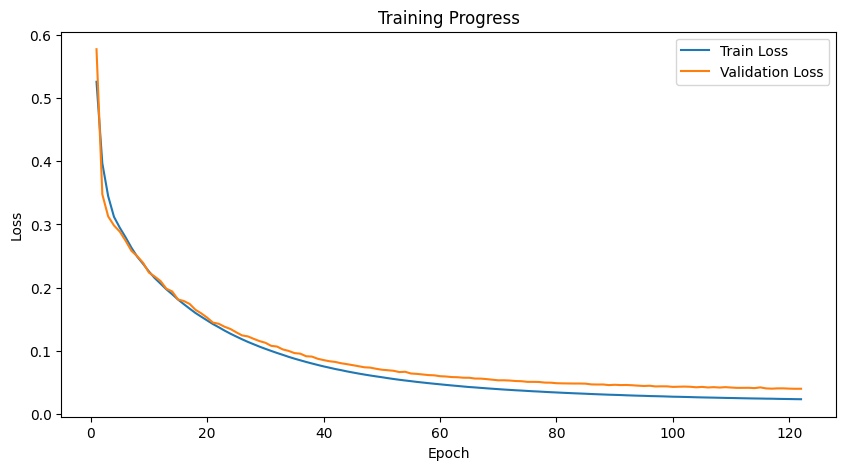

Epoch 123/200


100%|██████████| 23/23 [00:10<00:00,  2.22it/s]


==> Training Loss: 0.0235, Validation Loss: 0.0400


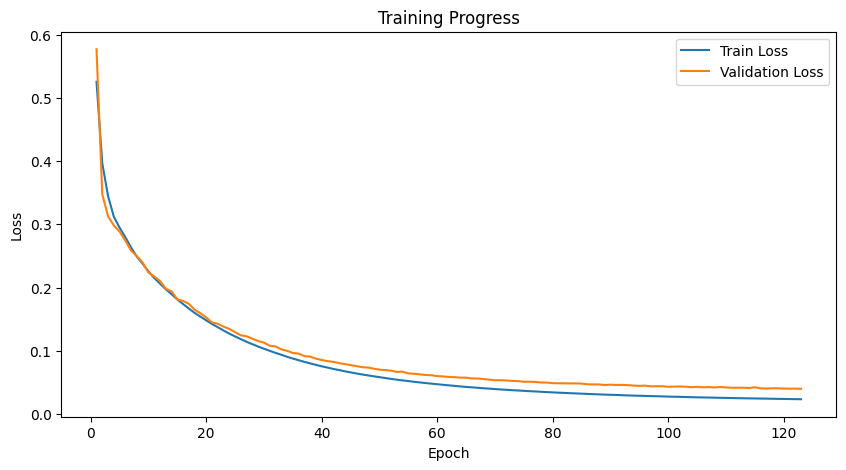

Epoch 124/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0234, Validation Loss: 0.0417


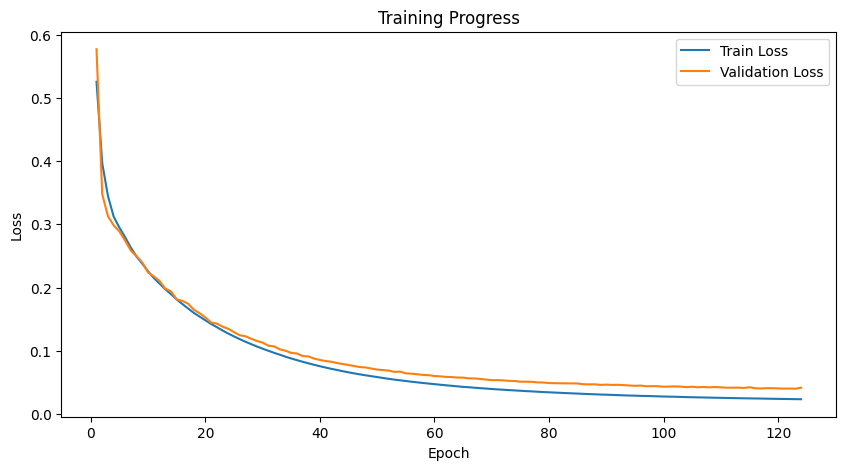

Epoch 125/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0232, Validation Loss: 0.0396


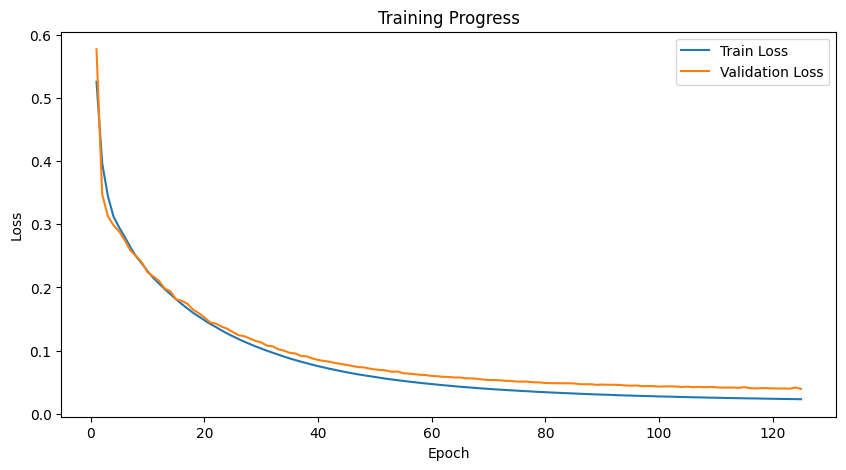

Epoch 126/200


100%|██████████| 23/23 [00:10<00:00,  2.22it/s]


==> Training Loss: 0.0231, Validation Loss: 0.0389


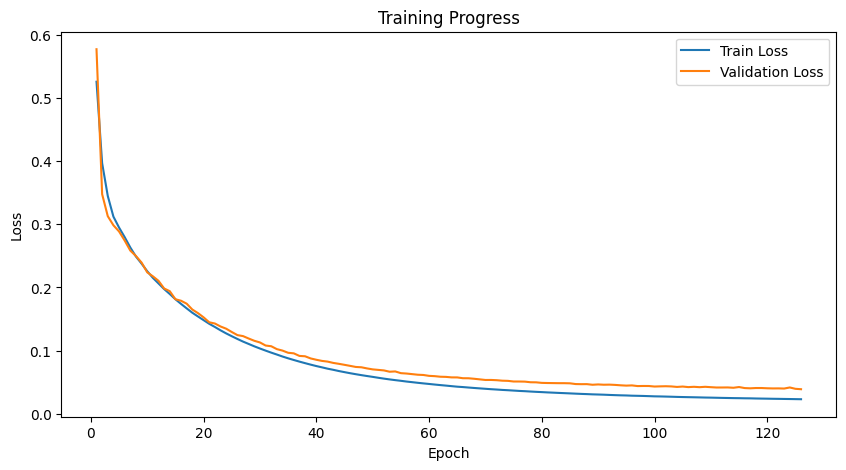

Epoch 127/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0230, Validation Loss: 0.0396


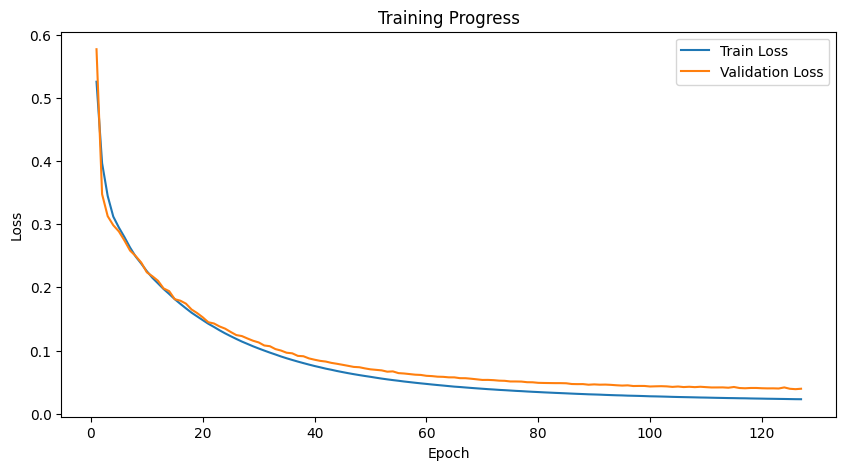

Epoch 128/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0229, Validation Loss: 0.0400


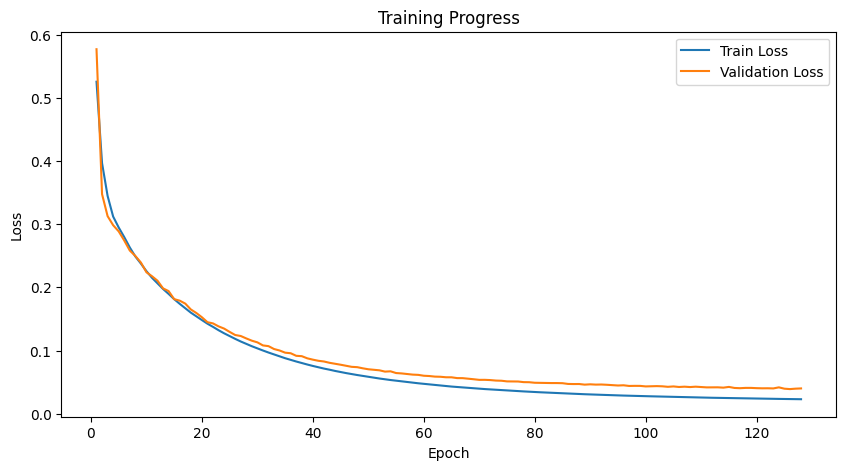

Epoch 129/200


100%|██████████| 23/23 [00:10<00:00,  2.20it/s]


==> Training Loss: 0.0228, Validation Loss: 0.0402


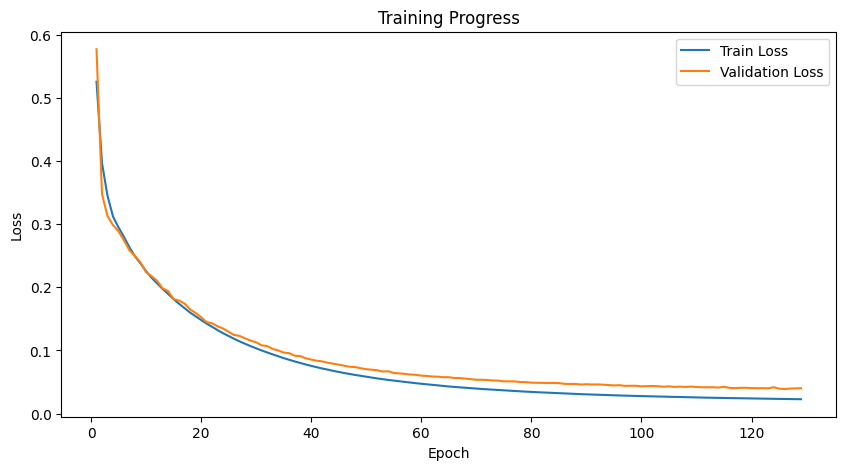

Epoch 130/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0226, Validation Loss: 0.0392


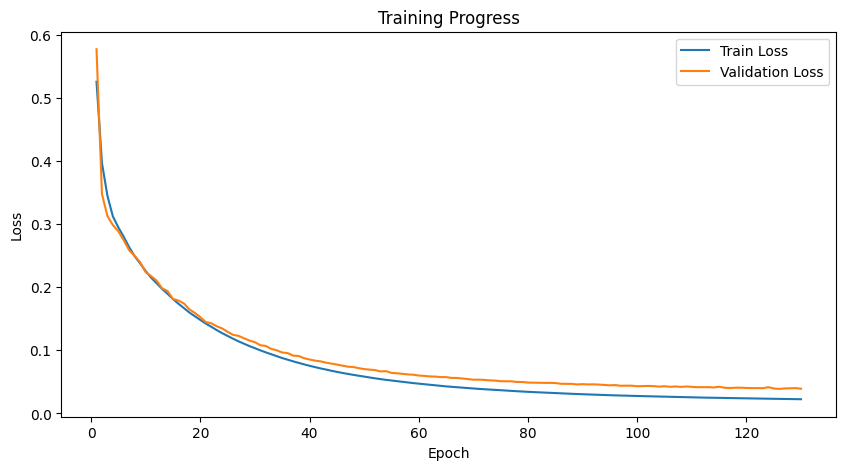

Epoch 131/200


100%|██████████| 23/23 [00:10<00:00,  2.20it/s]


==> Training Loss: 0.0226, Validation Loss: 0.0387


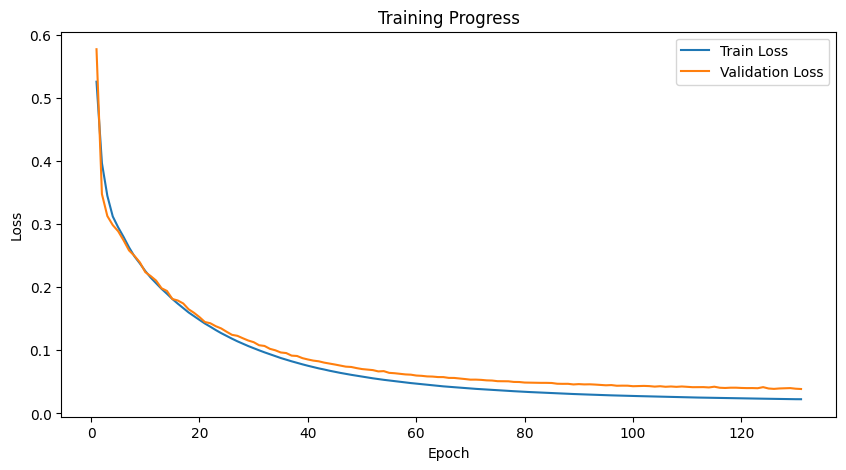

Epoch 132/200


100%|██████████| 23/23 [00:10<00:00,  2.22it/s]


==> Training Loss: 0.0224, Validation Loss: 0.0393


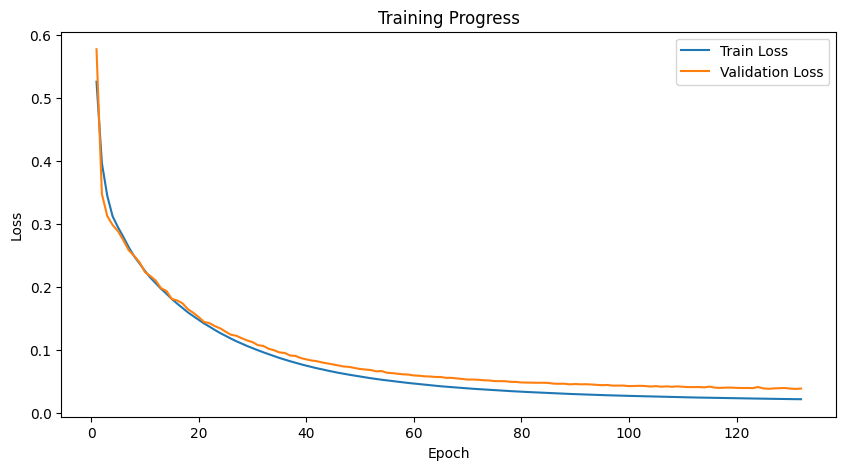

Epoch 133/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0223, Validation Loss: 0.0399


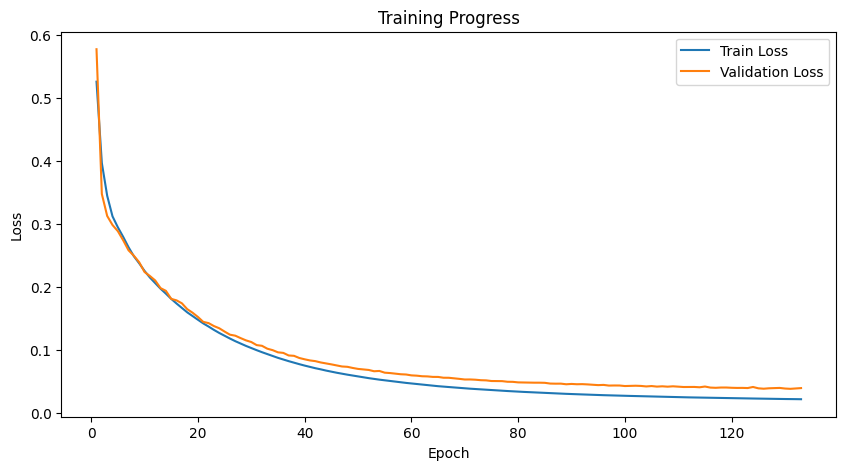

Epoch 134/200


100%|██████████| 23/23 [00:10<00:00,  2.25it/s]


==> Training Loss: 0.0222, Validation Loss: 0.0385


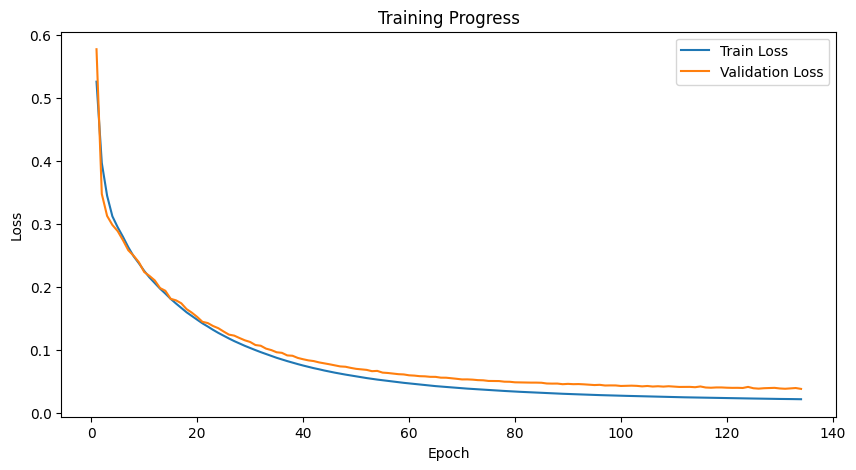

Epoch 135/200


100%|██████████| 23/23 [00:10<00:00,  2.23it/s]


==> Training Loss: 0.0221, Validation Loss: 0.0387


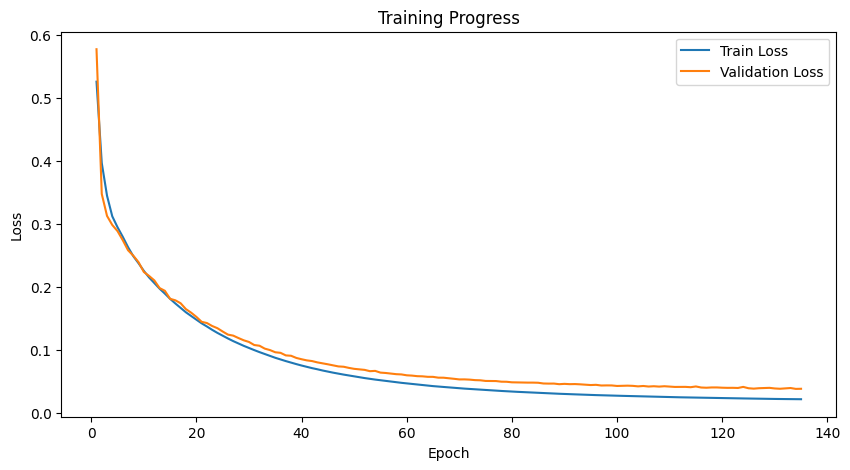

Epoch 136/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0220, Validation Loss: 0.0394


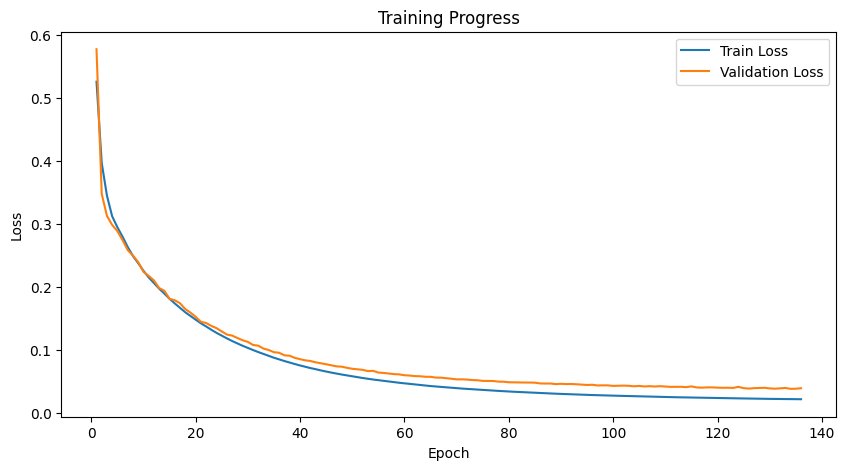

Epoch 137/200


100%|██████████| 23/23 [00:10<00:00,  2.20it/s]


==> Training Loss: 0.0219, Validation Loss: 0.0400


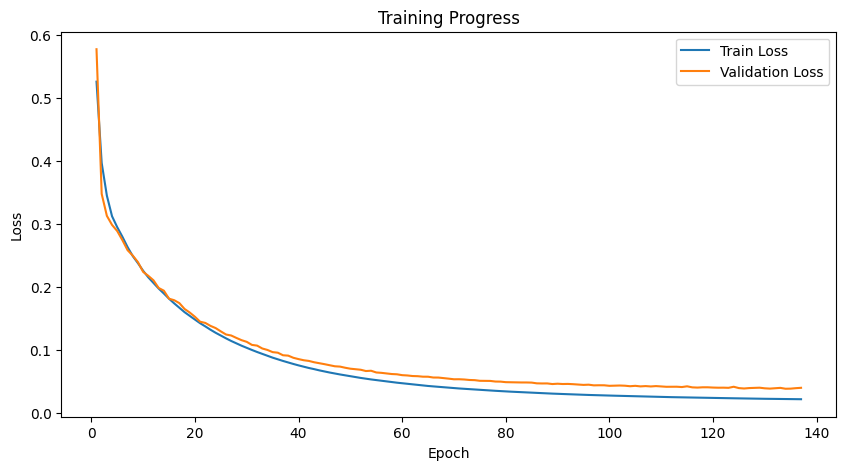

Epoch 138/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0219, Validation Loss: 0.0381


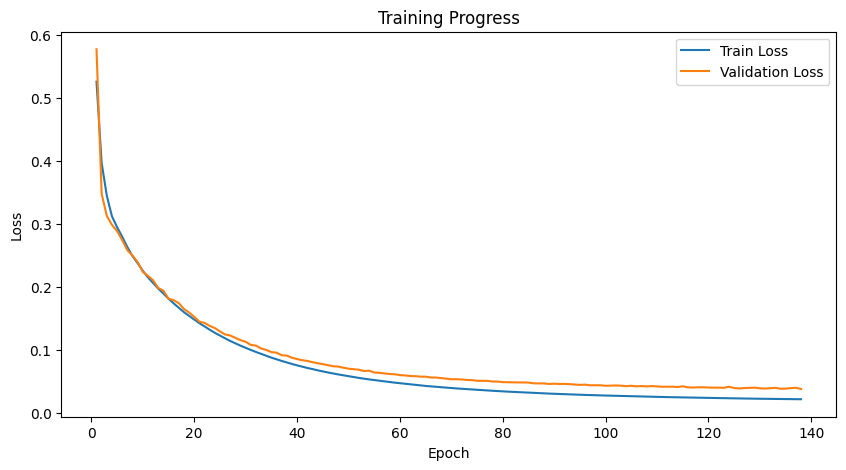

Epoch 139/200


100%|██████████| 23/23 [00:10<00:00,  2.19it/s]


==> Training Loss: 0.0218, Validation Loss: 0.0377


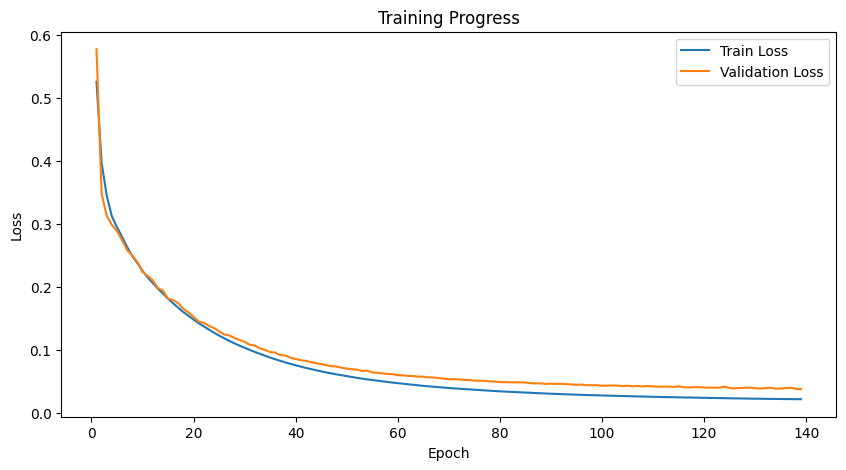

Epoch 140/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0216, Validation Loss: 0.0392


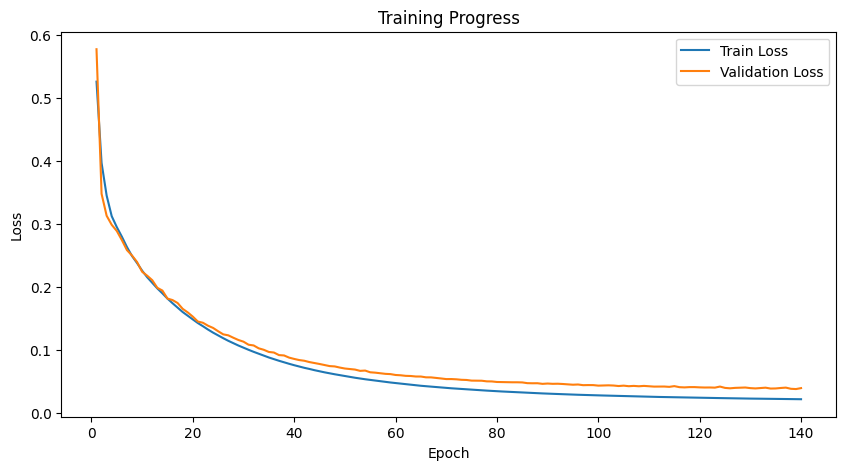

Epoch 141/200


100%|██████████| 23/23 [00:10<00:00,  2.20it/s]


==> Training Loss: 0.0215, Validation Loss: 0.0394


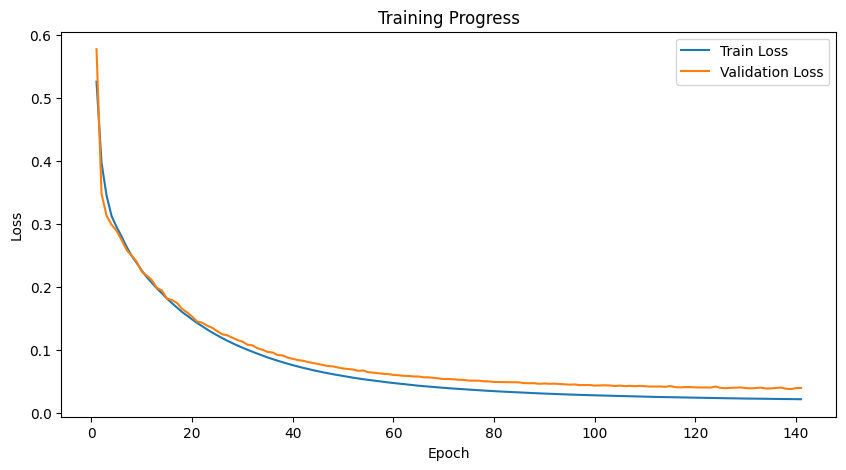

Epoch 142/200


100%|██████████| 23/23 [00:10<00:00,  2.21it/s]


==> Training Loss: 0.0214, Validation Loss: 0.0384


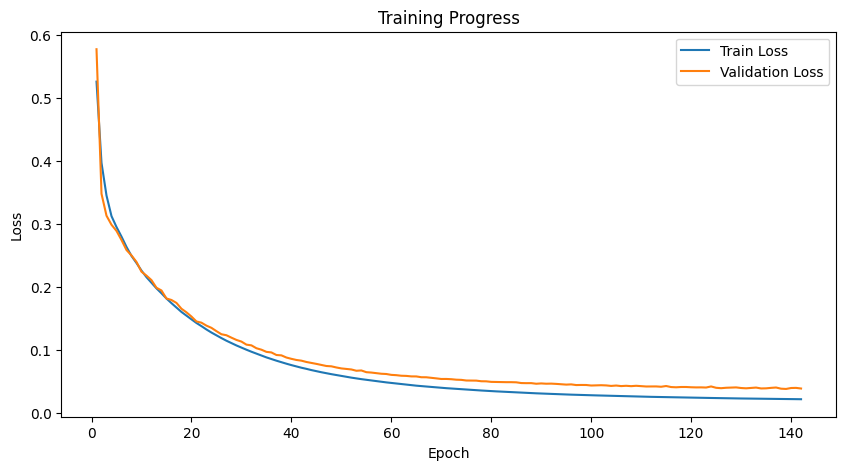

Epoch 143/200


100%|██████████| 23/23 [00:10<00:00,  2.20it/s]


==> Training Loss: 0.0213, Validation Loss: 0.0388


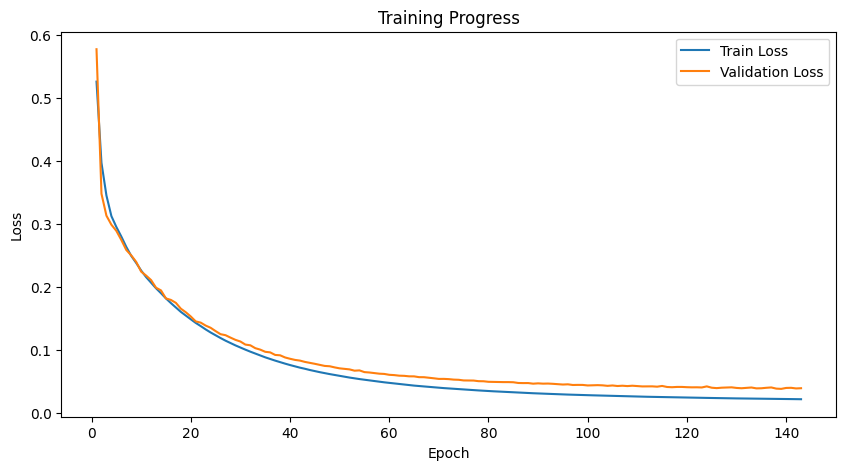

Epoch 144/200


100%|██████████| 23/23 [00:10<00:00,  2.20it/s]


==> Training Loss: 0.0212, Validation Loss: 0.0387


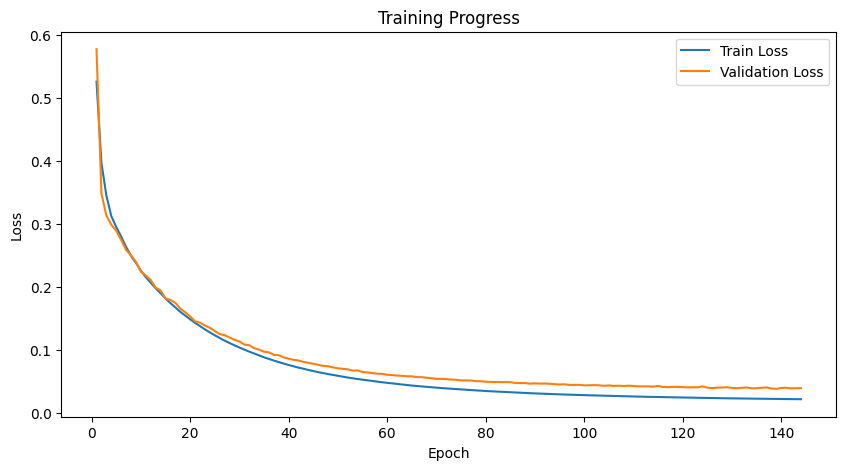

Early stopping at epoch 144 as there is no improvement.


([0.525460298942483,
  0.39653782093006634,
  0.34473011804663617,
  0.3120465136092642,
  0.29473886930424237,
  0.27953450964844745,
  0.2631426090779512,
  0.24884353059789407,
  0.2376107333794884,
  0.22561980524788733,
  0.21512233433516129,
  0.20628790363021518,
  0.19738079218760782,
  0.1895529964695806,
  0.18125468881233878,
  0.1738940082166506,
  0.16682818661565366,
  0.15994980477768442,
  0.154033987418465,
  0.14821216528830322,
  0.1424320929724237,
  0.1374113643946855,
  0.13212505501249563,
  0.12725427714378937,
  0.12276006198447684,
  0.11843004628368047,
  0.11426682737858398,
  0.1105294217881949,
  0.10676821159279865,
  0.10332111398810925,
  0.10000994931096616,
  0.09680090164360793,
  0.09378855707852737,
  0.09064956462901572,
  0.08781614057395769,
  0.08516894702030264,
  0.08259918054808742,
  0.08016976163439128,
  0.07780871702277142,
  0.07556559080662935,
  0.0735268780718679,
  0.07141083867653557,
  0.06963741422995277,
  0.06767813245887341,
 

In [ ]:
from torch.optim import Adam
import torch

# Hyper parameters
EPOCHS = 200
LEARNING_RATE = 1e-4
PATIENCE = 5

loss_fn = torch.nn.BCEWithLogitsLoss()
scaler = torch.cuda.amp.GradScaler()
optim = Adam(model.parameters(), lr=LEARNING_RATE)

# Launching the training
train_loop(model, train_dataloader, val_dataloader, optim, loss_fn, scaler, EPOCHS, PATIENCE, pos_weight=False)

In [ ]:
# Saving the model
torch.save(model, 'unet_cells.pth')

In [ ]:
import torchvision.transforms.functional as TF
import cv2
import numpy as np
from torchvision.transforms import CenterCrop, Pad

def rgb2gray(rgb):
    """
    Convert an RGB image to grayscale.

    Parameters:
    - rgb (numpy.ndarray): Input RGB image.

    Returns:
    - numpy.ndarray: Grayscale image.
    """
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray


def tens2image(im):
    """
    Convert a PyTorch tensor image to a NumPy array for visualization.

    Parameters:
    - im (torch.Tensor): Input tensor image.

    Returns:
    - numpy.ndarray: NumPy array representation of the image.
    """
    im = im.cpu()
    # removing batch size
    tmp = np.squeeze(im.numpy()*255)
    # if greyscale
    if tmp.ndim == 2:
        return tmp
    else:
        # in order to perform np.subtract and to plot images, we have to transfer channel to the last dimension
        return tmp.transpose((1, 2, 0))


def inv_normalize(im):
    """
    Inverse normalization for an image.

    Parameters:
    - im (numpy.ndarray): Normalized image.

    Returns:
    - numpy.ndarray: Inversely normalized image.
    """
    assert np.max(im) <= 1 and np.min(im) >= 0, "Image is not scaled between 0 and 1"
    # im.min() = im.max() float32 (normalization not done channel-wise)
    return im * 255

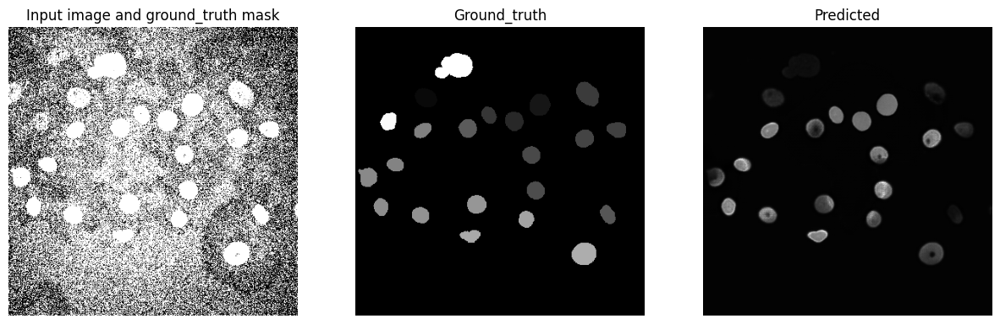

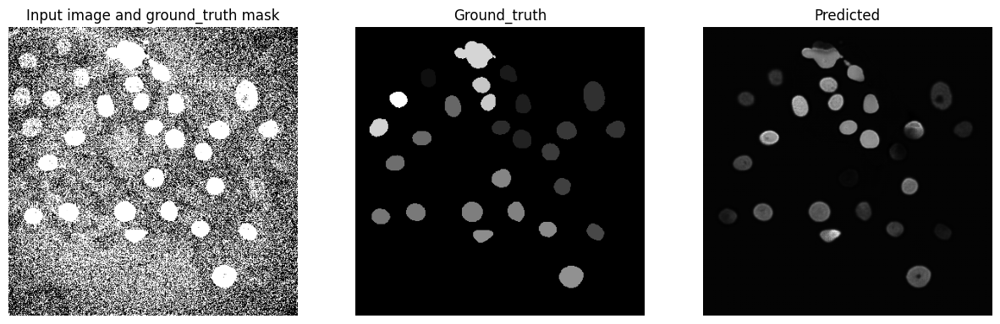

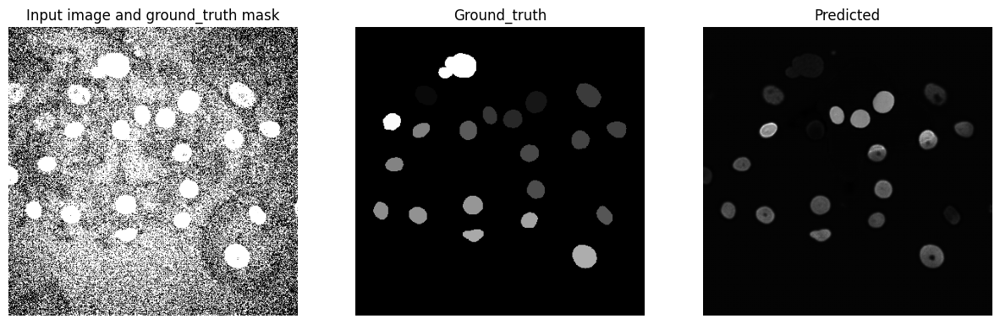

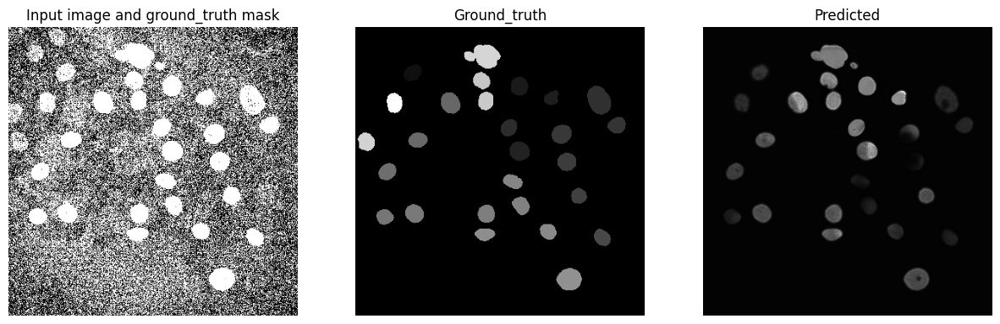

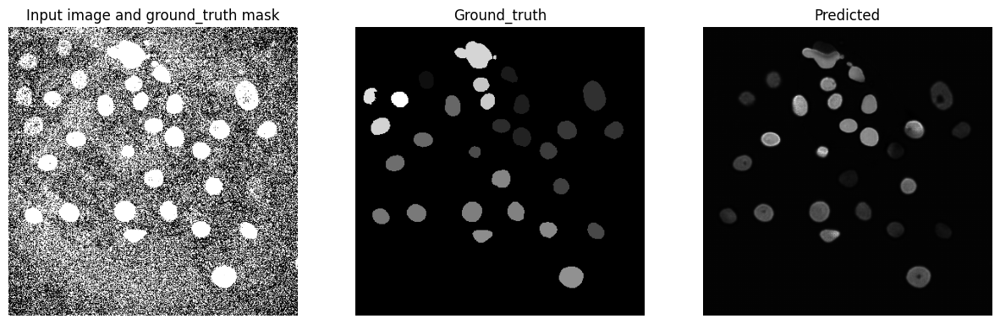

...

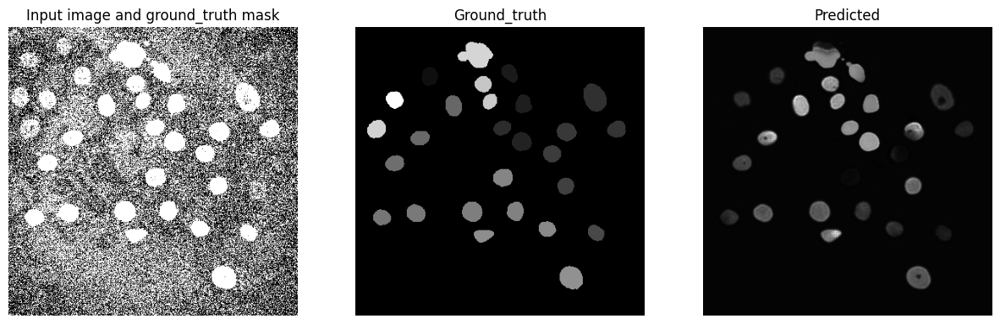

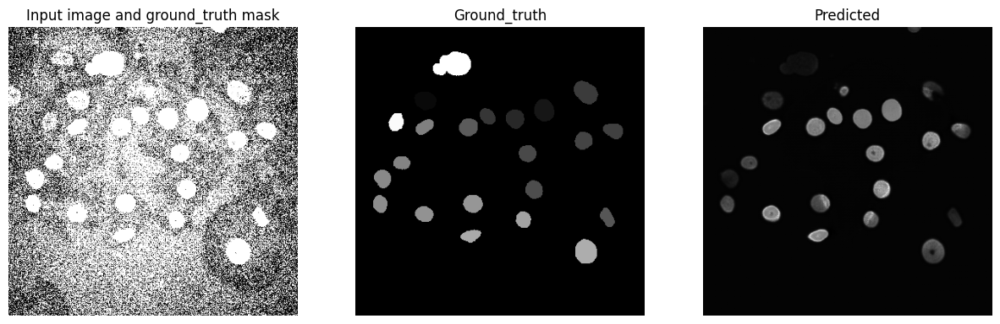

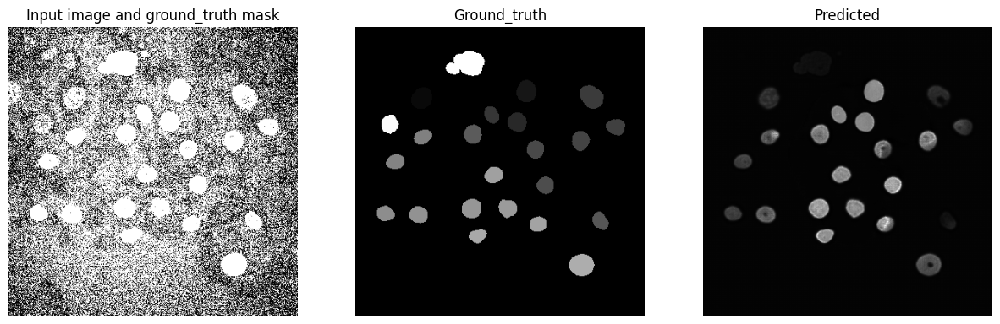

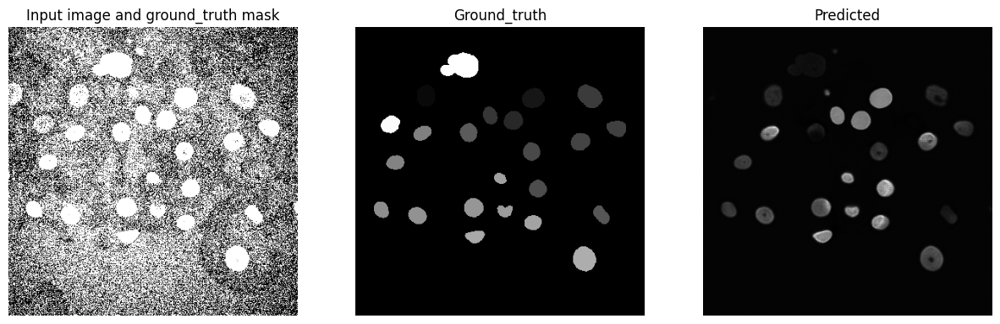

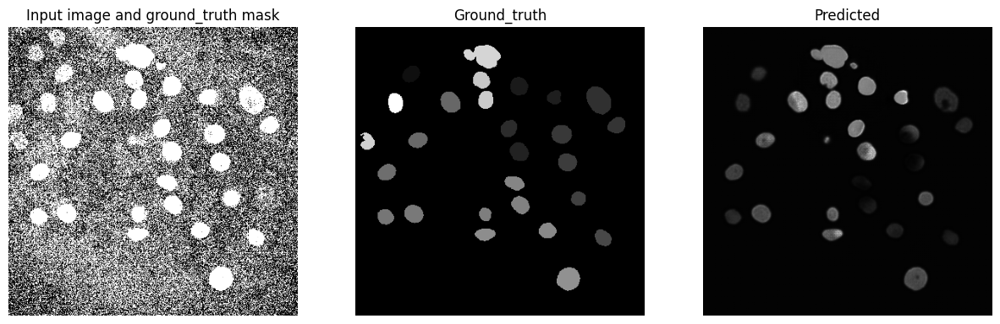

In [ ]:
import os
import matplotlib.pyplot as plt


def printing_images(model, loader, folder, epoch, device, num_images, pad_mirroring):
    path = os.path.join(folder, f"epoch_{epoch + 1}")
    if not os.path.exists(path):
        os.makedirs(path)

    model.eval()

    with torch.no_grad():
        for idx, (images, masks) in enumerate(loader):
            if idx < num_images:
                images = images.to(device)
                outs = torch.sigmoid(model(images))
                #print(outs)
                outs = (outs).float()
                #print(outs)
                if pad_mirroring:
                    images = CenterCrop((IMAGE_HEIGHT, IMAGE_WIDTH))(images)
                # if the batch_size is > 1 we take just the first image/mask

                # plotting the first image/mask per batch
                image = images[0]
                mask = masks[0]
                out = outs[0]

                image = tens2image(image)
                mask = tens2image(mask)
                out = tens2image(out)


                fig = plt.figure(figsize=(15, 7))
                rows = 1
                columns = 3

                fig.add_subplot(rows, columns, 1)
                plt.imshow(image)
                plt.axis('off')
                plt.title("Input image and ground_truth mask")

                fig.add_subplot(rows, columns, 2)
                plt.imshow(mask, cmap='binary_r')
                plt.axis('off')
                plt.title("Ground_truth")

                fig.add_subplot(rows, columns, 3)
                plt.imshow(out, cmap='binary_r')
                plt.axis('off')
                plt.title("Predicted")
                plt.show()

            else:
                break

num_images = 50
device = 'cuda'
folder = 'output'
epoch = 1
printing_images(model, test_dataloader, folder, epoch, device, num_images, PAD_MIRRORING)
